# Thesis work

## imports

In [1]:
import astropy
from astropy.io import fits
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import pandas as pd
from itables import show
import pprint

import itertools
from multiprocess import Pool
import multiprocess
from multiprocess import Manager
from threading import Thread

import os
import re
from datetime import datetime
from tqdm import tqdm
from tqdm.contrib.concurrent import process_map  # or thread_map
import numpy as np
from scipy.interpolate import interp1d
# from scipy.optimize import UnivariateSpline
from scipy.interpolate import interp1d, UnivariateSpline
import matplotlib.pyplot as plt
from astropy.io import fits
from FitsClass import FITSFile as myfits
from ObservationClass import ObservationManager as obsm
from SimulationClass import Simulations as sc

import specs as specs
from CCF import CCFclass

obs = obsm()

# XSHOOTER data manipulations

## Stitching cleaned (from 2D images) normalized data 

In [3]:
for star_name in specs.star_names:
    star = obs.load_star_instance(star_name)
    try:
        star.stitch_cleaned_normalized_flux(overwrite=True)
    except: 
        continue

Property 'cleaned_normalized_flux' not found
[Epoch 1] missing cleaned_normalized_flux for band UVB; skipping.
Property 'cleaned_normalized_flux' not found
[Epoch 2] missing cleaned_normalized_flux for band UVB; skipping.
Property 'cleaned_normalized_flux' not found
[Epoch 3] missing cleaned_normalized_flux for band UVB; skipping.
Property 'cleaned_normalized_flux' not found
[Epoch 4] missing cleaned_normalized_flux for band UVB; skipping.
Property 'cleaned_normalized_flux' not found
[Epoch 5] missing cleaned_normalized_flux for band UVB; skipping.
Property 'cleaned_normalized_flux' not found
[Epoch 6] missing cleaned_normalized_flux for band UVB; skipping.
Loaded property from: Data/Brey  83/epoch1/UVB/output/cleaned_normalized_flux.npz
Data/Brey  83/epoch1/UVB/ADP.2020-11-13T13_19_45.578.fits
Data loaded from Data/Brey  83/epoch1/UVB/ADP.2020-11-13T13_19_45.578.fits
Loaded property from: Data/Brey  83/epoch1/VIS/output/cleaned_normalized_flux.npz
Data/Brey  83/epoch1/VIS/ADP.2020-11-

# Orginazing Observation Data

## X-SHOOTER 1D files

In [3]:
obs = obsm()
obs.organize_star_files('../RawData')

## X-SHOOTER 2D files

In [ ]:
obs = obsm()
obs.organize_star_2D_images('../RawData')

## NRES 1D, 2D and raw together

In [2]:
obs = obsm()
obs.organize_nres_files2('../RawData')

Found 288 .fits.fz files in ../RawData.
Copied '../RawData/lco_data-20250104-56/cptnrs03-fa13-20250103-0033-e92-1d.fits.fz' => 'Data/WR17/epoch1/1/1D/cptnrs03-fa13-20250103-0033-e92-1d.fits.fz' [star=WR17, epoch=1, spec=1]
Copied '../RawData/lco_data-20250104-56/cptnrs03-fa13-20250103-0033-e00.fits.fz' => 'Data/WR17/epoch1/1/raw/cptnrs03-fa13-20250103-0033-e00.fits.fz' [star=WR17, epoch=1, spec=1]
Copied '../RawData/lco_data-20250104-56/cptnrs03-fa13-20250103-0033-e92-2d.fits.fz' => 'Data/WR17/epoch1/1/2D/cptnrs03-fa13-20250103-0033-e92-2d.fits.fz' [star=WR17, epoch=1, spec=1]
Copied '../RawData/lco_data-20250104-56/cptnrs03-fa13-20250103-0034-e92-1d.fits.fz' => 'Data/WR17/epoch1/2/1D/cptnrs03-fa13-20250103-0034-e92-1d.fits.fz' [star=WR17, epoch=1, spec=2]
Copied '../RawData/lco_data-20250104-56/cptnrs03-fa13-20250103-0034-e00.fits.fz' => 'Data/WR17/epoch1/2/raw/cptnrs03-fa13-20250103-0034-e00.fits.fz' [star=WR17, epoch=1, spec=2]
Copied '../RawData/lco_data-20250104-56/cptnrs03-fa13-2

# Orginazing 2D star fits files

In [9]:
obs = obsm()
obs.organize_star_2D_images(f'../RawData/archive')

Star names found: ['Brey  70', 'Brey  83', 'HD  38029', 'HD  37248', 'Brey  95a', 'MNM2014 LMC195-1', 'HD  32125', 'HD  37026', 'HD 269818', 'HD  38448', 'HD  38030', 'HD  37680', 'Brey  58a', 'HD  32228', 'HD  32257', 'HD 269888', 'HD  36156', 'H2013 LMCe  584', 'RMC 140', 'HD  32402', 'Brey  70a', 'Brey  16a', 'Brey  93', 'Brey  90a', 'HD 269891']
Found 468 FITS files in ../RawData/archive
Organizing files for star: Brey  70
Found 18 FITS files for Brey  70
Processing 3 files for Brey  70 on 2020-10-28 (epoch1)
Sub-exposure not found for ../RawData/archive/ADP.2020-11-13T13:19:45.727.fits. Assigning to sub-exposure 1.
Copied ../RawData/archive/ADP.2020-11-13T13:19:45.727.fits to Data/Brey  70/epoch1/NIR/2D image/ADP.2020-11-13T13:19:45.727.fits
Sub-exposure not found for ../RawData/archive/ADP.2020-11-13T13:19:45.413.fits. Assigning to sub-exposure 1.
Copied ../RawData/archive/ADP.2020-11-13T13:19:45.413.fits to Data/Brey  70/epoch1/VIS/2D image/ADP.2020-11-13T13:19:45.413.fits
Sub-e

In [11]:
path = f'../RawData/archive/ADP.2020-11-13T12:33:07.692.fits'
fit = myfits(path)
data = fit.data
image_data = fits.getdata(path, ext=0)

In [12]:
image_data

array([[-541.86664  , -268.81192  , 2001.8967   , ...,   13.63808  ,
          52.699177 ,   28.331072 ],
       [-202.36807  ,  550.6139   ,  139.13632  , ...,  -12.680979 ,
         -28.001728 ,   -7.966964 ],
       [-192.87576  ,  474.86603  ,  320.04724  , ...,  -18.424162 ,
          15.039984 ,   29.270485 ],
       ...,
       [ 309.92532  ,  317.94766  ,   92.83809  , ...,   -8.947825 ,
          -4.6025643,   16.124666 ],
       [-690.5028   ,  132.07367  ,  439.33838  , ...,    7.489552 ,
         -13.025372 ,   -5.767559 ],
       [-187.88748  , -173.53964  ,   62.862427 , ...,  -11.4056015,
          21.270926 ,  -16.842594 ]], dtype='>f4')

In [13]:
fit.print_file_info()

Opened FITS file: ../RawData/archive/ADP.2020-11-13T12:33:07.692.fits
Number of HDUs: 3
HDU 0: PrimaryHDU
------------------------------------------------------------
Header:
SIMPLE = True
BITPIX = -32
NAXIS = 2
NAXIS1 = 12854
NAXIS2 = 99
EXTEND = True
COMMENT =   FITS (Flexible Image Transport System) format is defined in 'Astronomy
COMMENT =   and Astrophysics', volume 376, page 359; bibcode: 2001A&A...376..359H
DATE = 2020-11-12T12:45:11
LAMNLIN = 3310
LAMRMS = 0.0034449051386803
CRDER1 = 5.98774463754332e-05
CSYER1 = 0.03
CUNIT1 = nm
SPATRMS = 0.0102419914646424
CRDER2 = 0.000178020662402537
CSYER2 = 0.17
CUNIT2 = arcsec
CRPIX1 = 1.0
CRVAL1 = 298.92
CDELT1 = 0.02
CTYPE1 = LINEAR
CRPIX2 = 1.0
CRVAL2 = -10.2600002288818
CDELT2 = 0.16
CTYPE2 = LINEAR
CD1_1 = 0.02
CD1_2 = 0.0
CD2_1 = 0.0
CD2_2 = 0.16
ORIGIN = ESO
TELESCOP = ESO-VLT-U3
INSTRUME = XSHOOTER
OBJECT = Brey  70a
RA = 84.397331
DEC = -69.14351
EQUINOX = 2000.0
RADECSYS = FK5
EXPTIME = 1357.0
MJD-OBS = 59144.319757056
DATE-OBS

In [5]:
count = 0
for star_name in specs.star_names:
    print(f'Number {count}: is {star_name}')
    count += 1

Number 0: is Brey  70
Number 1: is Brey  83
Number 2: is HD  38029
Number 3: is HD  37248
Number 4: is Brey  95a
Number 5: is MNM2014 LMC195-1
Number 6: is HD  32125
Number 7: is HD  37026
Number 8: is HD 269818
Number 9: is HD  38448
Number 10: is HD  38030
Number 11: is HD  37680
Number 12: is Brey  58a
Number 13: is HD  32228
Number 14: is HD  32257
Number 15: is HD 269888
Number 16: is HD  36156
Number 17: is H2013 LMCe  584
Number 18: is RMC 140
Number 19: is HD  32402
Number 20: is Brey  70a
Number 21: is Brey  16a
Number 22: is Brey  93
Number 23: is Brey  90a
Number 24: is HD 269891


# Load X-Shooter 2D images data

In [2]:
# path = f'Data/Brey  70/epoch1/
obs = obsm()
star_name = specs.star_names[2]
star = obs.load_star_instance(star_name)
file = star.load_2D_observation(1,'UVB')
raw_data = file.raw_data

Spectral type not found in the SIMBAD response.
Data/HD  38029/epoch1/UVB/2D image/ADP.2020-11-13T13:47:10.249.fits
Data loaded from Data/HD  38029/epoch1/UVB/2D image/ADP.2020-11-13T13:47:10.249.fits


## Plot 2D image

Data/HD  38029/epoch4/UVB/ADP.2021-08-04T12_51_37.454.fits
Data loaded from Data/HD  38029/epoch4/UVB/ADP.2021-08-04T12_51_37.454.fits
Data/HD  38029/epoch4/UVB/2D image/ADP.2021-08-04T12:51:37.455.fits
Data loaded from Data/HD  38029/epoch4/UVB/2D image/ADP.2021-08-04T12:51:37.455.fits
spacial axis has 99 items


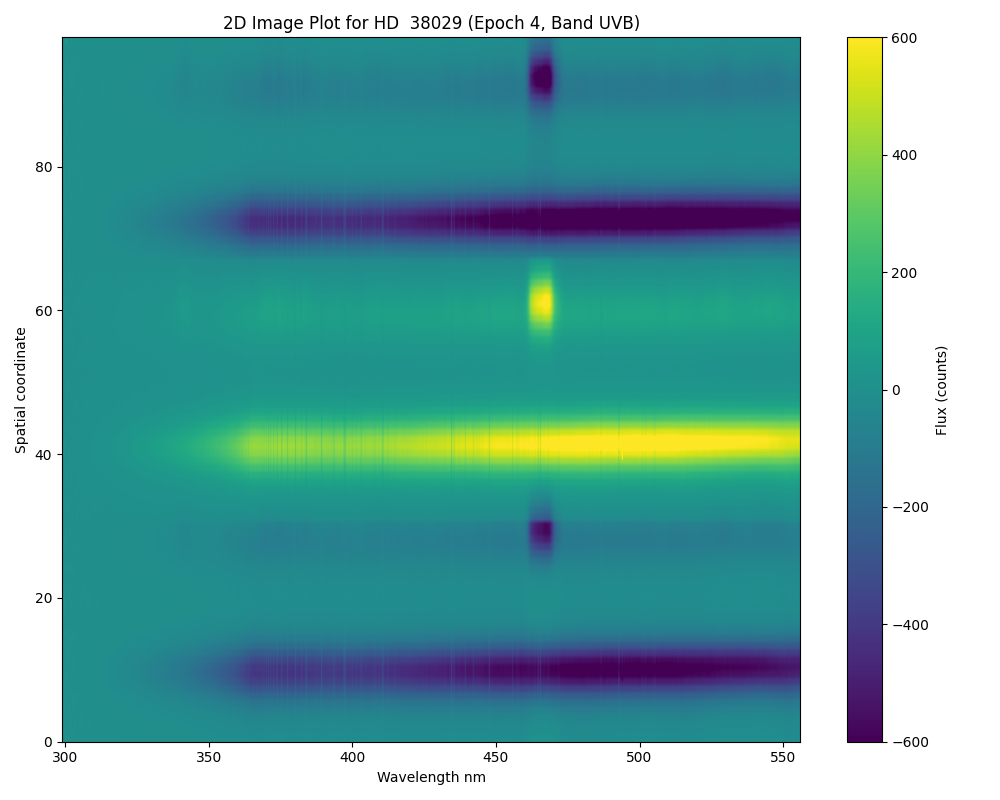

In [4]:
%matplotlib widget
star.plot_2D_image(4,'UVB',ValMax=600, ValMin=-600,norm = False,see_all=True)

In [24]:
star.plot_2D_image(6,'UVB',ValMin=-600,ValMax=600)

Data/H2013 LMCe  584/epoch6/UVB/ADP.2021-11-19T09_03_44.903.fits
Data loaded from Data/H2013 LMCe  584/epoch6/UVB/ADP.2021-11-19T09_03_44.903.fits
Data/H2013 LMCe  584/epoch6/UVB/2D image/ADP.2021-11-19T09:03:44.904.fits
Error loading Data/H2013 LMCe  584/epoch6/UVB/2D image/ADP.2021-11-19T09:03:44.904.fits: [Errno 2] No such file or directory: 'Data/H2013 LMCe  584/epoch6/UVB/2D image/ADP.2021-11-19T09:03:44.904.fits'


TypeError: '>' not supported between instances of 'NoneType' and 'int'

Data/Brey  58a/epoch1/VIS/ADP.2020-12-15T09_04_22.589.fits
Data loaded from Data/Brey  58a/epoch1/VIS/ADP.2020-12-15T09_04_22.589.fits
Data/Brey  58a/epoch1/VIS/2D image/ADP.2020-12-15T09:04:22.590.fits
Data loaded from Data/Brey  58a/epoch1/VIS/2D image/ADP.2020-12-15T09:04:22.590.fits
spacial axis has 28 items


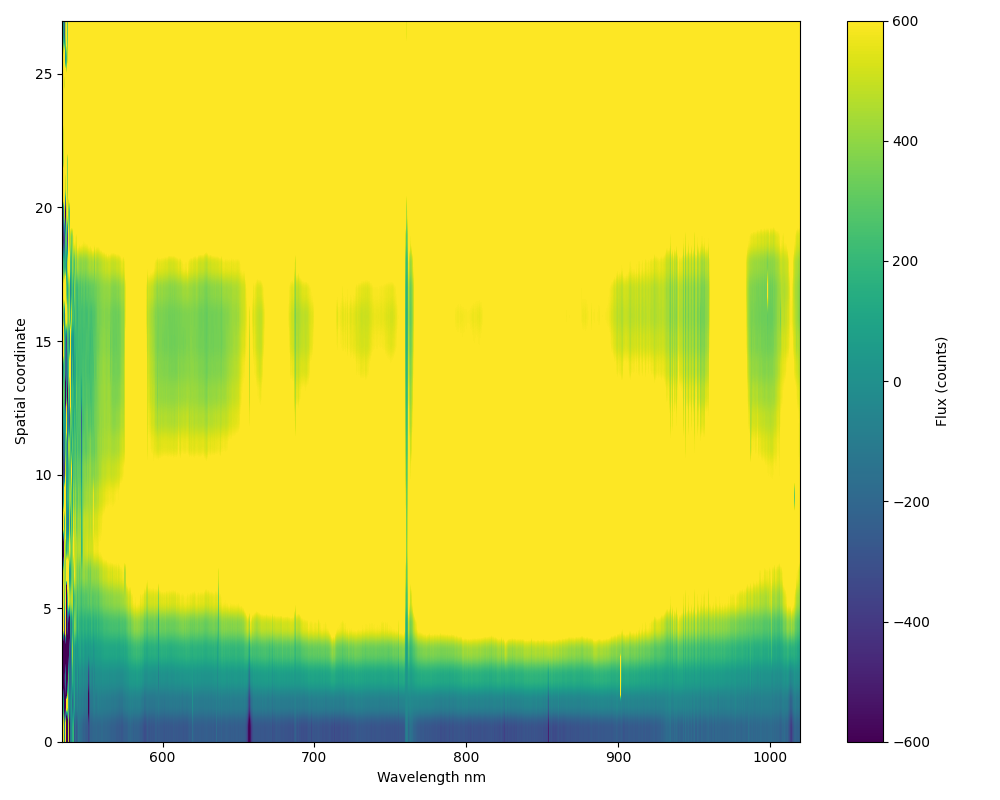

In [17]:
star.plot_2D_image(1,'VIS',ValMin=-600,ValMax=600)

Data/Brey  83/epoch1/NIR/ADP.2020-11-13T13_19_45.746.fits
Data loaded from Data/Brey  83/epoch1/NIR/ADP.2020-11-13T13_19_45.746.fits
Data/Brey  83/epoch1/NIR/2D image/ADP.2020-11-13T13:19:45.747.fits
Data loaded from Data/Brey  83/epoch1/NIR/2D image/ADP.2020-11-13T13:19:45.747.fits
spacial axis has 28 items


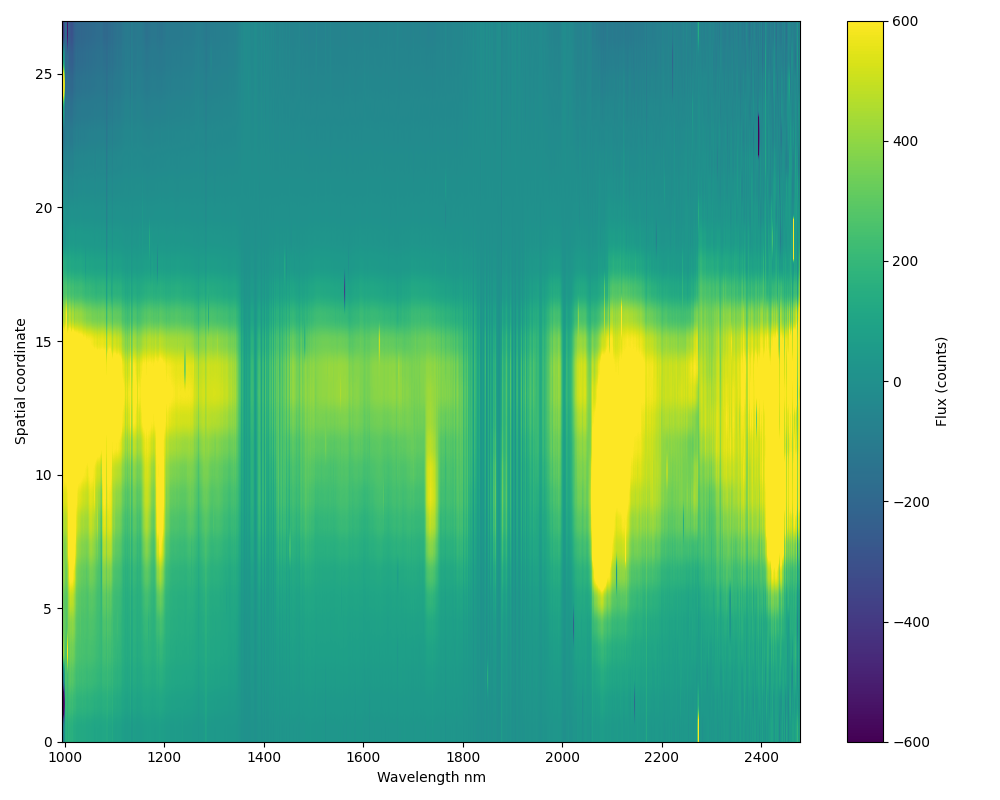

In [3]:
%matplotlib widget
star_name = specs.star_names[1]
star = obs.load_star_instance(star_name)
star.plot_2D_image(1,'NIR',ValMin=-600,ValMax=600)

In [61]:
fits_file = star.load_2D_observation(1,band = 'VIS')
spectra_fits_file = star.load_observation(1,'VIS')
print(fits_file.dataheader)

Data/RMC 140/epoch1/VIS/2D image/ADP.2020-11-13T13:47:10.407.fits
Data loaded from Data/RMC 140/epoch1/VIS/2D image/ADP.2020-11-13T13:47:10.407.fits
Data/RMC 140/epoch1/VIS/ADP.2020-11-13T13_47_10.406.fits
Data loaded from Data/RMC 140/epoch1/VIS/ADP.2020-11-13T13_47_10.406.fits
XTENSION= 'IMAGE   '           / IMAGE extension                                BITPIX  =                  -32 / number of bits per data pixel                  NAXIS   =                    2 / number of data axes                            NAXIS1  =                24318 / length of data axis 1                          NAXIS2  =                   99 / length of data axis 2                          PCOUNT  =                    0 / required keyword; must = 0                     GCOUNT  =                    1 / required keyword; must = 1                     EXTNAME = 'ERRS    '                                                            BUNIT   = 'ADU     '                                                            

In [62]:
print(spectra_fits_file.dataheader)

XTENSION= 'BINTABLE'           / binary table extension                         BITPIX  =                    8 / 8-bit bytes                                    NAXIS   =                    2 / 2-dimensional binary table                     NAXIS1  =              1264536 / width of table in bytes                        NAXIS2  =                    1 / number of rows in table                        PCOUNT  =                    0 / size of special data area                      GCOUNT  =                    1 / one data group (required keyword)              TFIELDS =                    7 / number of fields in each row                   TTYPE1  = 'WAVE    '           / label for field   1                            TFORM1  = '24318D  '           / data format of field: 8-byte DOUBLE            TUNIT1  = 'nm      '           / physical unit of field                         TTYPE2  = 'FLUX    '           / label for field   2                            TFORM2  = '24318D  '           / data fo

# NRES data mainupulations

## cleaning normalized spectra from bad pixels

In [2]:
%matplotlib widget
star_names = star_names = ['WR 52','WR17']
for star_name in star_names:
    star = obs.load_star_instance(star_name)
    star.clean_bad_pixels()

BAT99 not found properly. Indices -1, 39. Found sion="1.0" encoding="UTF-8" ?>
Retaining pixel at wavelength 3897.88 with average flux -5.51 (not negative in all spectra)
Retaining pixel at wavelength 3897.91 with average flux -3.75 (not negative in all spectra)
Retaining pixel at wavelength 3897.93 with average flux -7.28 (not negative in all spectra)
Retaining pixel at wavelength 3897.95 with average flux -9.84 (not negative in all spectra)
Retaining pixel at wavelength 3897.97 with average flux -0.31 (not negative in all spectra)
Retaining pixel at wavelength 3897.99 with average flux 5.56 (not negative in all spectra)
Retaining pixel at wavelength 3898.02 with average flux -2.64 (not negative in all spectra)
Retaining pixel at wavelength 3898.04 with average flux 9.27 (not negative in all spectra)
Retaining pixel at wavelength 3898.06 with average flux -7.46 (not negative in all spectra)
Retaining pixel at wavelength 3898.08 with average flux -7.90 (not negative in all spectra)
Ret

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)




Retaining pixel at wavelength 7384.17 with average flux -0.85 (not negative in all spectra)
Retaining pixel at wavelength 7384.21 with average flux -0.96 (not negative in all spectra)
Retaining pixel at wavelength 7384.25 with average flux -0.91 (not negative in all spectra)
Retaining pixel at wavelength 7384.57 with average flux -1.03 (not negative in all spectra)
Retaining pixel at wavelength 7387.77 with average flux -2.11 (not negative in all spectra)
Retaining pixel at wavelength 7387.89 with average flux -1.01 (not negative in all spectra)
Retaining pixel at wavelength 7387.93 with average flux -1.03 (not negative in all spectra)
Retaining pixel at wavelength 7388.01 with average flux -1.18 (not negative in all spectra)
Retaining pixel at wavelength 7388.05 with average flux -0.92 (not negative in all spectra)
Retaining pixel at wavelength 7388.09 with average flux -0.79 (not negative in all spectra)
Retaining pixel at wavelength 7388.13 with average flux -0.66 (not negative in 

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



Retaining pixel at wavelength 5849.55 with average flux 1.07 (not negative in all spectra)
Retaining pixel at wavelength 5849.73 with average flux 0.77 (not negative in all spectra)
Retaining pixel at wavelength 5849.99 with average flux 1.09 (not negative in all spectra)
Retaining pixel at wavelength 5850.30 with average flux 0.91 (not negative in all spectra)
Retaining pixel at wavelength 5850.37 with average flux 0.74 (not negative in all spectra)
Retaining pixel at wavelength 5850.60 with average flux 1.30 (not negative in all spectra)
Retaining pixel at wavelength 5850.71 with average flux 1.48 (not negative in all spectra)
Retaining pixel at wavelength 5850.73 with average flux 0.76 (not negative in all spectra)
Retaining pixel at wavelength 5850.76 with average flux 0.87 (not negative in all spectra)
Retaining pixel at wavelength 5850.83 with average flux 0.82 (not negative in all spectra)
Retaining pixel at wavelength 5850.94 with average flux 0.82 (not negative in all spectra)

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



## Combining fluxes using SNR weighting, fixing with blaze function and saving

BAT99 not found properly. Indices -1, 39. Found sion="1.0" encoding="UTF-8" ?>
Data loaded from Data/WR17/epoch1/1/1D/cptnrs03-fa13-20250103-0033-e92-1d.fits.fz


/Users/guyshtainer/Library/CloudStorage/OneDrive-Tel-AvivUniversity/תואר שני!/Thesis/Thesis-codes/NRESClass.py:1728: RuntimeWarning: invalid value encountered in divide
  flux_obj = flux_arrays[index_obj] / blaze_arrays[index_obj]
/Users/guyshtainer/Library/CloudStorage/OneDrive-Tel-AvivUniversity/תואר שני!/Thesis/Thesis-codes/NRESClass.py:1730: RuntimeWarning: invalid value encountered in divide
  flux_sky = flux_arrays[index_sky] / blaze_arrays[index_sky]


Backing up before overwrite: Data/WR17/epoch1/1/1D/output/combined_flux.npz
Backed up Data/WR17/epoch1/1/1D/output/combined_flux.npz -> Backups/overwritten/WR17/epoch1/1/1D/output/combined_flux_backup_20250330_173127.npz
Saved property to Data/WR17/epoch1/1/1D/output/combined_flux.npz
Data loaded from Data/WR17/epoch1/2/1D/cptnrs03-fa13-20250103-0034-e92-1d.fits.fz
Backing up before overwrite: Data/WR17/epoch1/2/1D/output/combined_flux.npz
Backed up Data/WR17/epoch1/2/1D/output/combined_flux.npz -> Backups/overwritten/WR17/epoch1/2/1D/output/combined_flux_backup_20250330_173136.npz
Saved property to Data/WR17/epoch1/2/1D/output/combined_flux.npz
Data loaded from Data/WR17/epoch1/3/1D/cptnrs03-fa13-20250103-0035-e92-1d.fits.fz
Backing up before overwrite: Data/WR17/epoch1/3/1D/output/combined_flux.npz
Backed up Data/WR17/epoch1/3/1D/output/combined_flux.npz -> Backups/overwritten/WR17/epoch1/3/1D/output/combined_flux_backup_20250330_173146.npz
Saved property to Data/WR17/epoch1/3/1D/out

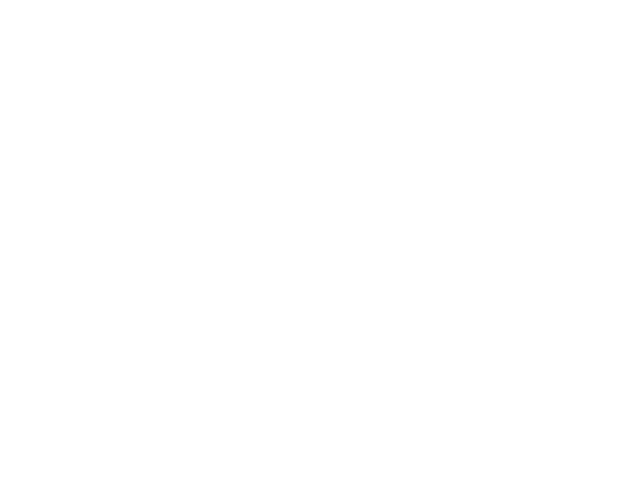

In [2]:
%matplotlib widget
star_names = ['WR 52','WR17']
# star_names = ['WR 52']
star_names = ['WR17']
plt.clf()
for star_name in star_names:
    star = obs.load_star_instance(star_name)
    epochs = star.get_all_epoch_numbers()
    for epoch_num in epochs[:]:
        spectra = star.get_all_spectra_in_epoch(epoch_num)
        for spectrum_num in spectra[:]:
            wave, flux, SNR = star.get_stitched_spectra3(epoch_num,spectrum_num,direct_snr_method = True,subtract_sky=True,window_size = 20)
            # wave, flux, SNR = star.get_stitched_spectra(epoch_num,spectrum_num,subtract_sky=True)
            data = {'wavelength': wave, 'flux': flux, 'SNR':SNR}
            overwrite = True
            star.save_property('combined_flux',data,epoch_num=epoch_num,spectra_num=spectrum_num,overwrite=overwrite)

print('Done')

In [ ]:
params = {}
star_names = ['WR 52','WR17']
for star_name in star_names:
    star = obs.load_star_instance(star_name)
    epochs = star.get_all_epoch_numbers()
    for epoch_num in epochs:
        spectra = star.get_all_spectra_in_epoch(epoch_num)
        for spectrum_num in spectra:
            # params.append(star_name, epoch_num, spectrum_num)
            params['direct_snr_method'] = True

params = {'direct_snr_method': True}
method_name = 'get_stitched_spectra2'
obs.execute_method_on_stars(method_name,'combined_flux',stars = star_names,parallel=True)
# star.execute_method(method,params= params, epoch_nums = star.get_all_epoch_numbers(),spectra_nums=star.get_all_spectra_in_epoch(1),overwrite=True,parallel=True)

Data/HD  32125/epoch6/COMBINED/combined_bands.fits
Data loaded from Data/HD  32125/epoch6/COMBINED/combined_bands.fits


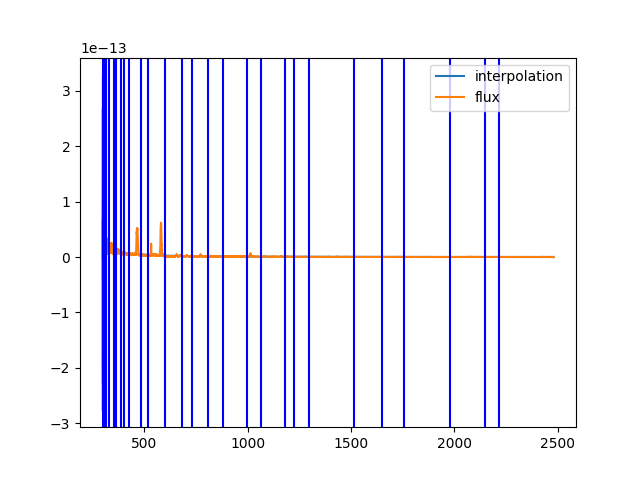

[ 298.92  309.46  317.26  330.8   352.54  365.72  386.52  400.24  429.06
  482.64  520.66  601.52  683.96  731.44  810.22  879.22  998.9  1066.8
 1180.32 1226.58 1295.7  1516.74 1651.26 1758.6  1981.14 2148.06 2216.16]


In [2]:
%matplotlib widget
obs = obsm()
star_name = specs.star_names[6]
star = obs.load_star_instance(star_name)
normalized_flux_tmp = star.load_property('normalized_flux',6,'COMBINED')
interpolated_flux_tmp = star.load_property('interpolated_flux',6,'COMBINED')
anchor_points_tmp = star.load_property('norm_anchor_wavelengths',6,'COMBINED')
# anchor_points = anchor_points_tmp['norm_anchor_wavelengths']
flux = star.load_observation(6,'COMBINED').data['FLUX'][0]
wavelengths = normalized_flux_tmp['wavelengths']
normalized_flux = normalized_flux_tmp['normalized_flux']
interpolated_flux = interpolated_flux_tmp['interpolated_flux']
plt.plot(wavelengths,interpolated_flux,label = 'interpolation')
plt.plot(wavelengths,flux,label = 'flux')
for wave in anchor_points_tmp:
    plt.axvline(x = wave, color = 'b')
# plt.scatter(
plt.legend()
plt.show()

print(anchor_points_tmp)
# print(normalized_flux)
# print(interpolated_flux)

# Calculating RV compared to the first epoch

## For X-Shooter

In [9]:
obs = obsm()
star_names = specs.star_names
star_name = star_names[3]
print(f'We use {star_name}')
star = obs.load_star_instance(star_name)

We use HD  37248


### Testing Tomers CCF with a python library

sum of weights: 1.0 (should b 1)


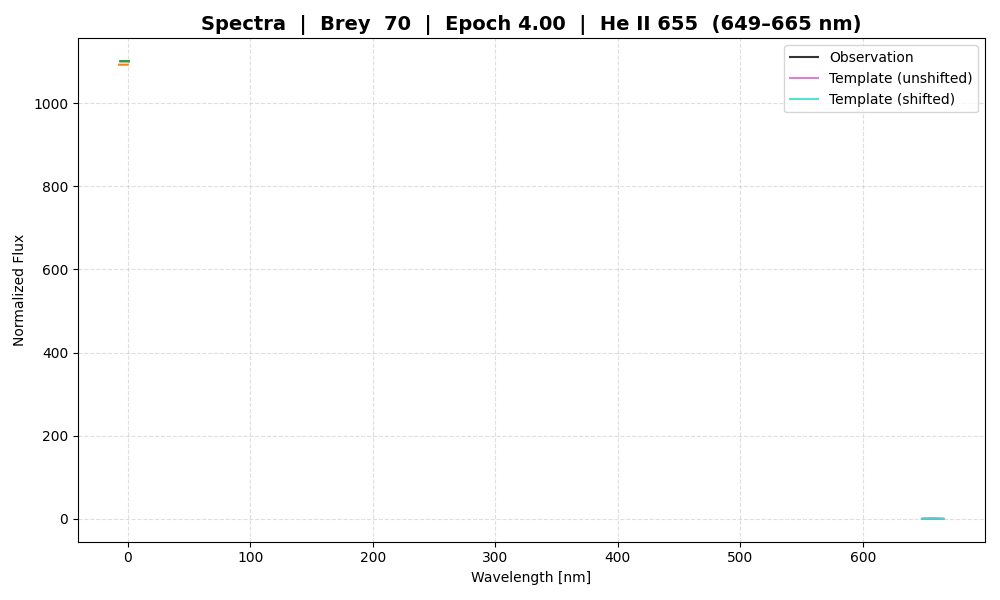

Brey  70 | He II 4686 | epoch 01: in-house    -0.37 km/s   PyAstr    -0.36 km/s


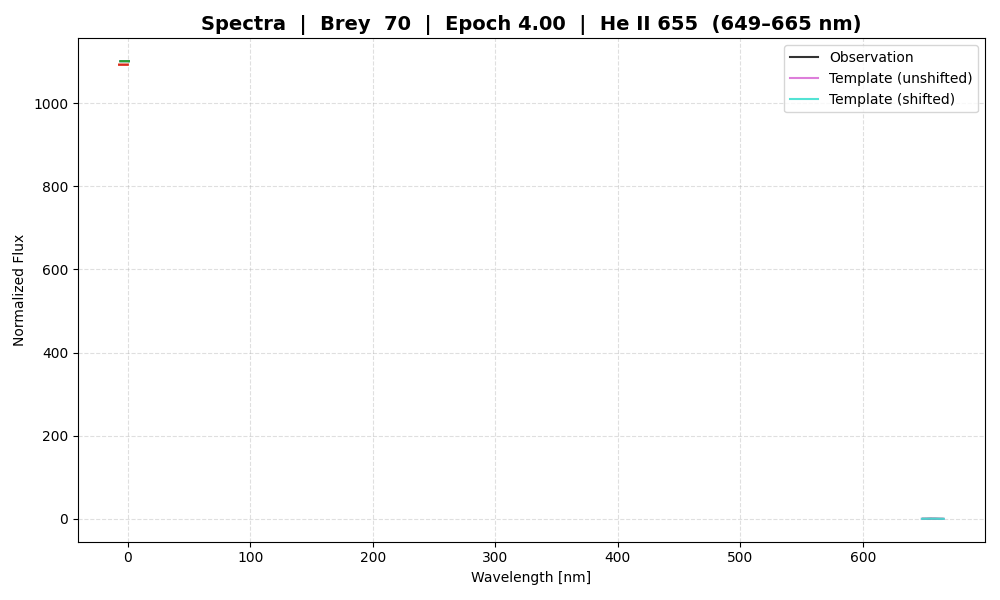

PyAValError: 
---------------------
A PyA error occurred:
---------------------
Type of error: PyA Value Error
What happened?
    The requested fitting range around the extreme is not covered by the data.
What are possible solutions?
  - Adapt 'dp'.
  - Do you need to change the mode?


In [37]:
# %%
# ──────────────────────────────────────────────────────────────────────────────
#  Compare in-house TWO-PASS CCF with PyAstronomy's crosscorrRV + quadExtreme
# ──────────────────────────────────────────────────────────────────────────────
# If PyAstronomy is not yet installed, uncomment the next line:
# %pip install --quiet PyAstronomy

%matplotlib widget

from PyAstronomy import pyasl
import numpy as np
from datetime import datetime

star_names = specs.star_names

emission_lines = {
    'He II 4686':              [456., 480.],
    'C IV 5808-5812':          [570., 590.],
    # 'He II 655':               [649., 665.],
    # 'C IV-III 761-772':        [752., 790.],
    # 'C III 970':               [957., 988.],
    # 'C IV-III 1022-1012':      [1000., 1030.],
    # 'C III 1187':              [1176., 1200.],
    # 'idk1':                    [1715., 1755.],
    # 'idk2':                    [2050., 2110.]
}

run_ts = datetime.now().strftime("%Y-%m-%d_%H-%M-%S")

for star_name in star_names[0:3]:
    Fit_Range_in_fraction = 0.95
    if star_name == 'HD  38029':
        Fit_Range_in_fraction = 0.99

    star = obs.load_star_instance(star_name, to_print=False)

    # ── initial template (epoch 1) ────────────────────────────────────────────
    d0 = (star.load_property('cleaned_normalized_flux', 1, 'COMBINED')
          or
          star.load_property('normalized_flux',          1, 'COMBINED'))
    tpl_wave_all, tpl_flux_all = d0['wavelengths'], d0['normalized_flux']

    # ── gather every epoch’s spectrum ────────────────────────────────────────
    epoch_nums = star.get_all_epoch_numbers()
    obs_data   = []
    for ep in epoch_nums:
        d = (star.load_property('cleaned_normalized_flux', ep, 'COMBINED')
             or
             star.load_property('normalized_flux',          ep, 'COMBINED'))
        obs_data.append((ep, d['wavelengths'], d['normalized_flux']))

    # ── loop over emission-line windows ──────────────────────────────────────
    for line_tag, rng in emission_lines.items():

        # Restrict template once for this window
        m_tpl          = (tpl_wave_all >= rng[0]) & (tpl_wave_all <= rng[1])
        # tpl_wave, tflx = tpl_wave_all[m_tpl], tpl_flux_all[m_tpl]
        tpl_wave, tflx = tpl_wave_all, tpl_flux_all

        # ────────────────────────────────────────────────────────────────────
        # (1) Your existing TWO-PASS CCF (unchanged)
        # ────────────────────────────────────────────────────────────────────
        # NB: `ep` here is just the last epoch number from the loop above
        CCF_base = CCFclass(
            PlotAll=False,
            CrossVeloMin=-400, CrossVeloMax=400,
            Fit_Range_in_fraction=Fit_Range_in_fraction,
            CrossCorRangeA=[rng],
            star_name=star_name,
            epoch=ep,
            line_tag=line_tag,
            run_ts=run_ts,
            nm=False
        )
        r1, r2, (tpl_wave, tflx) = CCF_base.double_ccf(
            [(w, f) for _, w, f in obs_data],
            tpl_wave, tflx,
            return_coadd=True
        )

        # ────────────────────────────────────────────────────────────────────
        # (2) PyAstronomy CCF + parabolic interpolation
        # ────────────────────────────────────────────────────────────────────
        pyastr_rvs, pyastr_rver = [], []

        for (ep, w, f) in obs_data:

            m_obs         = (w >= rng[0]) & (w <= rng[1])
            ow, oflx      = w[m_obs], f[m_obs]

            # Mean-centre both spectra (continuum already removed, but safe)
            oflx -= oflx.mean()
            tflx_mc = tflx - tflx.mean()
            # print(f'tflux mean is {tflx.mean()}')
            # print(f'tflx_mc is {tflx_mc}')

            # Discrete CCF
            rv_grid, ccf = pyasl.crosscorrRV(
                ow, oflx, tpl_wave, tflx_mc,
                rvmin=-400, rvmax=400, drv=1,skipedge=True  # km s⁻¹ grid
            )
            # print(f'ccf is {ccf}')

            # 3-point quadratic (parabolic) interpolation of the peak
            # ─── keep only the top 1 % of CCF values for the quadratic fit ──────────
            pct     = 99                                  # percentile to keep
            thresh  = np.percentile(ccf, pct)             # 99th-percentile value
            mask    = ccf >= thresh                       # boolean mask
            
            rv_fit  = rv_grid[mask]
            ccf_fit = ccf[mask]
            
            # quadExtreme needs the x-array in ascending order
            # order        = np.argsort(rv_fit)
            # rv_fit       = rv_fit [order]
            # ccf_fit      = ccf_fit[order]
            
            # fall back gracefully if too few points survive
            if rv_fit.size < 3:
                rv_fit, ccf_fit = rv_grid, ccf            # use all points instead
            
            # ─── parabolic peak based on the filtered set ───────────────────────────
            plt.plot(rv_fit,ccf_fit)
            plt.show()
            rv_peak, _ = pyasl.quadExtreme(rv_fit, ccf_fit, mode='max')
            # # Index of the discrete maximum
            # i_max = np.argmax(ccf)
            
            # # Protect against boundary cases
            # if i_max == 0 or i_max == len(ccf) - 1:
            #     raise RuntimeError("Peak lies on the CCF edge – enlarge RV range or use skipedge")
            
            # # Three points that define the parabola
            # x3 = rv_grid[i_max-1 : i_max+2]
            # y3 = ccf    [i_max-1 : i_max+2]
            
            # # y = a x² + b x + c
            # a, b, c_coef = np.polyfit(x3, y3, 2)
            
            # # High-resolution curve for the plot
            # x_fit = np.linspace(x3[0], x3[-1], 200)
            # y_fit = a * x_fit**2 + b * x_fit + c_coef
            # y_peak = a * rv_peak**2 + b * rv_peak + c_coef   # value at the refined peak
            
            # fig, ax = plt.subplots()
            # ax.plot(rv_grid, ccf,            lw=1,  label="CCF")
            # ax.plot(x_fit,  y_fit,   "r--",  lw=1.5, label="Parabolic fit")
            # ax.plot(rv_peak, y_peak, "ro",           label=f"Peak = {rv_peak:.2f} km/s")
            # ax.set_xlabel("RV  [km s⁻¹]")
            # ax.set_ylabel("Correlation")
            # ax.set_title(f"{star_name}  |  {line_tag}  |  epoch {ep:02d}")
            # ax.legend()
            # plt.show()
            pyastr_rvs.append(rv_peak)
            pyastr_rver.append(2.0 / np.sqrt(8.0))   # ~drv/√8 placeholder

            # ── instant side-by-side printout ────────────────────────────
            my_rv = r2[epoch_nums.index(ep)][0]
            print(f"{star_name} | {line_tag} | epoch {ep:02d}: "
                  f"in-house {my_rv:8.2f} km/s   PyAstr {rv_peak:8.2f} km/s")

        # ── OPTIONAL: save PyAstronomy RVs alongside existing ones ──────────
        # for idx, (ep, _, _) in enumerate(obs_data):
        #     entry = {'pyastro_RV': pyastr_rvs[idx],
        #              'pyastro_RV_err': pyastr_rver[idx]}
        #     RVs = star.load_property('RVs', ep, 'COMBINED') or {}
        #     RVs.setdefault(line_tag, {}).update(entry)
        #     star.save_property('RVs', RVs, ep,
        #                        overwrite=True, band='COMBINED')

        # ── your original per-epoch plotting (unchanged) ───────────────────
        # for (ep, w, f), (RV_val, RV_err) in zip(obs_data, r2):

        #     CCF_plot = CCFclass(
        #         PlotAll=True,
        #         CrossVeloMin=-400, CrossVeloMax=400,
        #         Fit_Range_in_fraction=Fit_Range_in_fraction,
        #         CrossCorRangeA=[rng],
        #         star_name=star_name,
        #         epoch=ep,
        #         line_tag=line_tag,
        #         savePlot=True,
        #         run_ts=run_ts
        #     )
        #     _ = CCF_plot.compute_RV(w, f, tpl_wave, tflx)


### Using Tomers CCF while generating the coadded template and using it directly in a list

#### First using CCF twice, first calculates the RVs using a co-added template and the second only for CCF graph savings

In [2]:
skip_epochs = {'HD  38029': [5,6],
               'Brey  95a': [5,6],
               'Brey  83': [5,6],
               'MNM2014 LMC195-1':[4], # was cleaned but remained diluted
               'Brey  58a':[4,5,6], #relatively diluted and wpoch 5 gave very high RV
               'HD  32228': [5,6],
               'HD  32125': [2,7],
               'H2013 LMCe  584': [6],
               'HD  38448':[7] #epoch 7 has weird He II shape
                }

emission_lines = {
    'O V 3100-3175': [310., 317.5],
    'O IV 3350-3480': [335,348],
    'C IV 3650-3900': [365.,390],
    'He II 4686':  [456., 480.],
    'O VI 5210-5340': [521,533.5],
    'C IV 5350-5540': [535,554],
    'C IV 5808-5812': [570., 590],
    'C III 6700-6800': [666.5,684.],
    'C III 6970-7100': [697,714],
    # 'idk1': [1715,1755],
    # 'idk2': [2050,2110],
    # 'telurics1': [1340,1495],
    # 'telurics2': [1795,1985],
    'He I 17100-17630': [1710,1763],
    'Mystery 20500-21000': [2050,2100]
}
skip_emission_lines = { #epoch 0 means all epochs
    'HD  38448':{'C IV 5350-5540':[5],'He II 4686':[7]},
    'Brey  58a':{'O V 3100-3175':[0],'C IV 3650-3900':[5],'He I 17100-17630':[0]},
    'HD  32257':{'O V 3100-3175':[4]},
    'HD  269888':{'C IV 5350-5540':[6],'He I 17100-17630':[3]}, #epoch 6 in C IV has a big narrow line which screws with the CCF and also ep3 in He I
    'HD  36156':{'O V 3100-3175':[4,6]}, # eps 4,6 in O V big narrow line
    'RMC  140':{'O IV 3350-3480':[0],'O VI 5210-5340':[2,3],'He I 17100-17630':[0],'Mystery 20500-21000':[1]},
    'HD  32402':{'He I 17100-17630':[0]}, # in He I the narrow peaks ruin it
    'Brey  70a':{'O V 3100-3175':[0]}, # O V is too diluted
    'HD  269891':{'O VI 5210-5340':[0],'C III 6970-7100':[0]}
    }
# run_ts = datetime.now().strftime("%Y-%m-%d_%H-%M-%S") #run time stamp

In [9]:
print(run_ts)

2025-09-15_03-12-03


In [3]:
run_ts = '2025-09-15_03-12-03'

In [8]:
%matplotlib widget
star_names = specs.star_names
c_kms = 299792.458  # speed of light in km/s

skip_epochs = {'HD  38029': [5,6],
               'Brey  95a': [5,6],
               'Brey  83': [5,6],
               'MNM2014 LMC195-1':[4], # was cleaned but remained diluted
               'Brey  58a':[4,5,6], #relatively diluted and wpoch 5 gave very high RV
               'HD  32228': [5,6],
               'HD  32125': [2,7],
               'H2013 LMCe  584': [6],
               'HD  38448':[7] #epoch 7 has weird He II shape
                }
skip_emission_lines = { #epoch 0 means all epochs
    'HD  38448':{'C IV 5350-5540':[5],'He II 4686':[7]},
    'Brey  58a':{'O V 3100-3175':[0],'C IV 3650-3900':[5],'He I 17100-17630':[0]},
    'HD  32257':{'O V 3100-3175':[4]},
    'HD  269888':{'C IV 5350-5540':[6],'He I 17100-17630':[3]}, #epoch 6 in C IV has a big narrow line which screws with the CCF and also ep3 in He I
    'HD  36156':{'O V 3100-3175':[4,6]}, # eps 4,6 in O V big narrow line
    'RMC  140':{'O IV 3350-3480':[0],'O VI 5210-5340':[2,3],'He I 17100-17630':[0],'Mystery 20500-21000':[1]},
    'HD  32402':{'He I 17100-17630':[0]}, # in He I the narrow peaks ruin it
    'Brey  70a':{'O V 3100-3175':[0]}, # O V is too diluted
    'HD  269891':{'O VI 5210-5340':[0],'C III 6970-7100':[0]}
    }

emission_lines = {
    'O V 3100-3175': [310., 317.5],
    'O IV 3350-3480': [335,348],
    'C IV 3650-3900': [365.,390],
    'He II 4686':  [456., 480.],
    'O VI 5210-5340': [521,533.5],
    'C IV 5350-5540': [535,554],
    'C IV 5808-5812': [570., 590],
    'C III 6700-6800': [666.5,684.],
    'C III 6970-7100': [697,714],
    # 'idk1': [1715,1755],
    # 'idk2': [2050,2110],
    # 'telurics1': [1340,1495],
    # 'telurics2': [1795,1985],
    'He I 17100-17630': [1710,1763],
    'Mystery 20500-21000': [2050,2100]
}
# run_ts = datetime.now().strftime("%Y-%m-%d_%H-%M-%S") #run time stamp
CrossVelo = 2000


for star_name in star_names:
    if star_name == 'HD 269891':
        CrossVelo = 1000
    # Fit_Range_in_fraction=0.95
    # if star_name == 'HD  38029':
    #     Fit_Range_in_fraction=0.99
    print(star_name)
    star = obs.load_star_instance(star_name,to_print = True)

    # ---------- initial template (epoch 1) -----------------------------
    d0 = (star.load_property('cleaned_normalized_flux', 1, 'COMBINED')
          or
          star.load_property('normalized_flux',          1, 'COMBINED'))
    # fits_file = star.load_observation(1, band='VIS')
    # bary = fits_file.header['ESO QC VRAD BARYCOR']  # barycentric correction in km/s
    bary = 0
    # Shift observed wavelength to barycentric frame
    w_corrected = d0['wavelengths'] * (1 + bary / c_kms)
    tpl_wave, tpl_flux = w_corrected, d0['normalized_flux']

    # ---------- collect all epochs’ spectra ---------------------------
    epoch_nums = star.get_all_epoch_numbers()
    
    # Use template's wavelength grid as the common one for all interpolations
    common_wavegrid = tpl_wave
    
    obs_data = []
    for ep in epoch_nums:
        if star_name in skip_epochs:
            if ep in skip_epochs[star_name]:
                continue
        d = (star.load_property('cleaned_normalized_flux', ep, 'COMBINED')
             or
             star.load_property('normalized_flux',          ep, 'COMBINED'))
        # fits_file = star.load_observation(ep, band='VIS')
        # bary = fits_file.header['ESO QC VRAD BARYCOR']
        bary = 0
        # # Shift observed wavelength to barycentric frame
        w_corr = d['wavelengths'] * (1 - bary / c_kms)
        f_corr = d['normalized_flux']

        # ---- clean NaNs / infs before interpolation ----
        mask = np.isfinite(w_corr) & np.isfinite(f_corr)
        w_corr = w_corr[mask]
        f_corr = f_corr[mask]
        
        if w_corr.size == 0:
            raise ValueError(f"All values are NaN/inf for epoch {ep}")

        # Interpolate flux onto the common wavelength grid
        interp_flux = interp1d(w_corr, f_corr,
                               kind='cubic', bounds_error=False, fill_value=1.0)(common_wavegrid)
    
        obs_data.append((ep, common_wavegrid, interp_flux))

    # ==================================================================
    # loop over emission‑line windows
    # ==================================================================
    for line_tag, rng in emission_lines.items():
        if star_name in skip_emission_lines:
            if line_tag in skip_emission_lines[star_name]:
                # collect the epochs to skip for this star/line
                skip_eps = skip_emission_lines[star_name][line_tag]
        
                # make sure it's iterable (allow single int too)
                if isinstance(skip_eps, (int, np.integer)):
                    skip_eps = [skip_eps]
        
                # filter obs_data: keep only those not in skip_eps
                obs_data = [data for data in obs_data if data[0] not in skip_eps]
                            
        try:
            Fit_Range_in_fraction = specs.CCF_parabola_fraction[star_name][line_tag]
        except:
            Fit_Range_in_fraction = 0.95
        
        # -- run TWO‑PASS RV once (silent) -----------------------------
        CCF_base = CCFclass(
            PlotAll=False,
            CrossVeloMin=-CrossVelo, CrossVeloMax=CrossVelo,
            Fit_Range_in_fraction=Fit_Range_in_fraction,
            CrossCorRangeA=[rng],
            star_name=star_name,
            epoch=ep,
            line_tag=line_tag,
            run_ts=run_ts,
            nm = False
        )
        r1, r2, (co_wave, co_flux) = CCF_base.double_ccf(
            [(w, f) for _, w, f in obs_data],
            tpl_wave, tpl_flux,
            return_coadd=True
        )
        print(f'Ended real calculation, now runs again for plots')

        # -- per‑epoch plotting with updated titles --------------------
        for (ep, w, f), (RV_val, RV_err) in zip(obs_data, r2):

            CCF_plot = CCFclass(
                PlotAll=False,                  # produce figures
                CrossVeloMin=-CrossVelo, CrossVeloMax=CrossVelo,
                Fit_Range_in_fraction=Fit_Range_in_fraction,
                CrossCorRangeA=[rng],
                star_name=star_name,
                epoch=ep,
                line_tag=line_tag,
                savePlot = True,
                run_ts=run_ts
            )
            # co_wave , co_flux = tpl_wave, tpl_flux
            # compute_RV only to generate plots (numbers already in r2)
            _ = CCF_plot.compute_RV(w, f, co_wave, co_flux)

            # -------- save RVs exactly as before ----------------------
            entry = {'full_RV': RV_val, 'full_RV_err': RV_err}

            # -------- save RVs ----------------------
            RVs = star.load_property('RVs', ep, 'COMBINED') or {}
            
            # check if this line/epoch is marked to skip
            to_skip = False
            if star_name in skip_emission_lines and line_tag in skip_emission_lines[star_name]:
                skip_eps = skip_emission_lines[star_name][line_tag]
                # normalize to list
                if isinstance(skip_eps, (int, np.integer)):
                    skip_eps = [skip_eps]
                if 0 in skip_eps or ep in skip_eps:   # 0 means all epochs for this line
                    to_skip = True
            
            if to_skip:
                # delete if already exists
                if line_tag in RVs:
                    del RVs[line_tag]
                    print(f"[skip] Removed {line_tag} from RVs for {star_name} (epoch {ep})")
            else:
                RVs[line_tag] = {'full_RV': RV_val, 'full_RV_err': RV_err}
            
            # save back
            star.save_property('RVs', RVs, ep, overwrite=True, band='COMBINED')



Brey  70
Calculating for first time to get shifts and create the coadded template
Now calculating coadded template
Finally calculating CCF using coadded template
Ended real calculation, now runs again for plots
[saved] plots to ../output/Brey__70/CCF/2025-09-15_03-12-03/O V 3100-3175
Property saved at Data/Brey  70/epoch1/COMBINED/output/RVs.npz
[saved] plots to ../output/Brey__70/CCF/2025-09-15_03-12-03/O V 3100-3175
Property saved at Data/Brey  70/epoch2/COMBINED/output/RVs.npz
[saved] plots to ../output/Brey__70/CCF/2025-09-15_03-12-03/O V 3100-3175
Property saved at Data/Brey  70/epoch3/COMBINED/output/RVs.npz
[saved] plots to ../output/Brey__70/CCF/2025-09-15_03-12-03/O V 3100-3175
Property saved at Data/Brey  70/epoch4/COMBINED/output/RVs.npz
[saved] plots to ../output/Brey__70/CCF/2025-09-15_03-12-03/O V 3100-3175
Property saved at Data/Brey  70/epoch5/COMBINED/output/RVs.npz
[saved] plots to ../output/Brey__70/CCF/2025-09-15_03-12-03/O V 3100-3175
Property saved at Data/Brey  7

/Users/guyshtainer/Library/CloudStorage/OneDrive-Tel-AvivUniversity/תואר שני!/Thesis/Codes/CCF.py:110: RuntimeWarning: invalid value encountered in sqrt
  sigma = np.sqrt(-1. / (N * 2 * a * CCFAtMax / (1 - CCFAtMax ** 2)))
/Users/guyshtainer/Library/CloudStorage/OneDrive-Tel-AvivUniversity/תואר שני!/Thesis/Codes/CCF.py:242: RuntimeWarning: invalid value encountered in sqrt
  return np.array([vmax, np.sqrt(-1./(N * CFFdvdvAtMax *


[saved] plots to ../output/Brey__95a/CCF/2025-09-15_03-12-03/C IV 5350-5540
File exists. Creating a backup before overwriting: Data/Brey  95a/epoch1/COMBINED/output/RVs.npz
Backup created at Backups/overwritten/Brey  95a/epoch1/COMBINED/RVs_backup_15_09_2025__10_01_47.npz
Property saved at Data/Brey  95a/epoch1/COMBINED/output/RVs.npz
[saved] plots to ../output/Brey__95a/CCF/2025-09-15_03-12-03/C IV 5350-5540
File exists. Creating a backup before overwriting: Data/Brey  95a/epoch2/COMBINED/output/RVs.npz
Backup created at Backups/overwritten/Brey  95a/epoch2/COMBINED/RVs_backup_15_09_2025__10_01_47.npz
Property saved at Data/Brey  95a/epoch2/COMBINED/output/RVs.npz
[saved] plots to ../output/Brey__95a/CCF/2025-09-15_03-12-03/C IV 5350-5540
File exists. Creating a backup before overwriting: Data/Brey  95a/epoch3/COMBINED/output/RVs.npz
Backup created at Backups/overwritten/Brey  95a/epoch3/COMBINED/RVs_backup_15_09_2025__10_01_47.npz
Property saved at Data/Brey  95a/epoch3/COMBINED/outp

#### second is going through all the RVs and saving an appropriate RV vs epochs graphs

Loaded property from: Data/Brey  70/epoch1/COMBINED/output/RVs.npz
Loaded property from: Data/Brey  70/epoch2/COMBINED/output/RVs.npz
Loaded property from: Data/Brey  70/epoch3/COMBINED/output/RVs.npz
Loaded property from: Data/Brey  70/epoch4/COMBINED/output/RVs.npz
Loaded property from: Data/Brey  70/epoch5/COMBINED/output/RVs.npz
Loaded property from: Data/Brey  70/epoch6/COMBINED/output/RVs.npz
Brey  70 – O V 3100-3175: summary plot written to ../output/Brey__70/CCF/2025-09-15_03-12-03/O V 3100-3175/RVs.png
Loaded property from: Data/Brey  70/epoch1/COMBINED/output/RVs.npz
Loaded property from: Data/Brey  70/epoch2/COMBINED/output/RVs.npz
Loaded property from: Data/Brey  70/epoch3/COMBINED/output/RVs.npz
Loaded property from: Data/Brey  70/epoch4/COMBINED/output/RVs.npz
Loaded property from: Data/Brey  70/epoch5/COMBINED/output/RVs.npz
Loaded property from: Data/Brey  70/epoch6/COMBINED/output/RVs.npz
Property 'cleaned_normalized_flux' not found
Loaded property from: Data/Brey  70/

/Users/guyshtainer/Library/CloudStorage/OneDrive-Tel-AvivUniversity/תואר שני!/Thesis/Codes/StarClass.py:1791: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax_main = plt.subplots(figsize=(10, 6))


Saved C III 6970-7100 plot to ../output/Brey__83/CCF/2025-09-15_03-12-03/C III 6970-7100/Brey  83_C III 6970-7100_extremeRV_scaled.png
Loaded property from: Data/Brey  83/epoch1/COMBINED/output/RVs.npz
Loaded property from: Data/Brey  83/epoch2/COMBINED/output/RVs.npz
Loaded property from: Data/Brey  83/epoch3/COMBINED/output/RVs.npz
Loaded property from: Data/Brey  83/epoch4/COMBINED/output/RVs.npz
Property 'RVs' not found
Property 'RVs' not found
Loaded property from: Data/Brey  83/epoch4/COMBINED/output/cleaned_normalized_flux.npz
Loaded property from: Data/Brey  83/epoch2/COMBINED/output/cleaned_normalized_flux.npz
Saved C III 6970-7100 plot to ../output/Brey__83/CCF/2025-09-15_03-12-03/C III 6970-7100/Brey  83_C III 6970-7100_extremeRV_unscaled.png
Loaded property from: Data/Brey  83/epoch1/COMBINED/output/RVs.npz
Loaded property from: Data/Brey  83/epoch2/COMBINED/output/RVs.npz
Loaded property from: Data/Brey  83/epoch3/COMBINED/output/RVs.npz
Loaded property from: Data/Brey  83

/var/folders/hm/f5s7jhns5qvgrw2hxpgfn5w80000gn/T/ipykernel_47909/4145594486.py:130: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()
/var/folders/hm/f5s7jhns5qvgrw2hxpgfn5w80000gn/T/ipykernel_47909/4145594486.py:165: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig2, ax2 = plt.subplots()


Saved He I 17100-17630 plot to ../output/Brey__83/CCF/2025-09-15_03-12-03/He I 17100-17630/Brey  83_He I 17100-17630_extremeRV_scaled.png
Loaded property from: Data/Brey  83/epoch1/COMBINED/output/RVs.npz
Loaded property from: Data/Brey  83/epoch2/COMBINED/output/RVs.npz
Loaded property from: Data/Brey  83/epoch3/COMBINED/output/RVs.npz
Loaded property from: Data/Brey  83/epoch4/COMBINED/output/RVs.npz
Property 'RVs' not found
Property 'RVs' not found
Loaded property from: Data/Brey  83/epoch4/COMBINED/output/cleaned_normalized_flux.npz
Loaded property from: Data/Brey  83/epoch1/COMBINED/output/cleaned_normalized_flux.npz
Saved He I 17100-17630 plot to ../output/Brey__83/CCF/2025-09-15_03-12-03/He I 17100-17630/Brey  83_He I 17100-17630_extremeRV_unscaled.png
Loaded property from: Data/Brey  83/epoch1/COMBINED/output/RVs.npz
Loaded property from: Data/Brey  83/epoch2/COMBINED/output/RVs.npz
Loaded property from: Data/Brey  83/epoch3/COMBINED/output/RVs.npz
Loaded property from: Data/Br

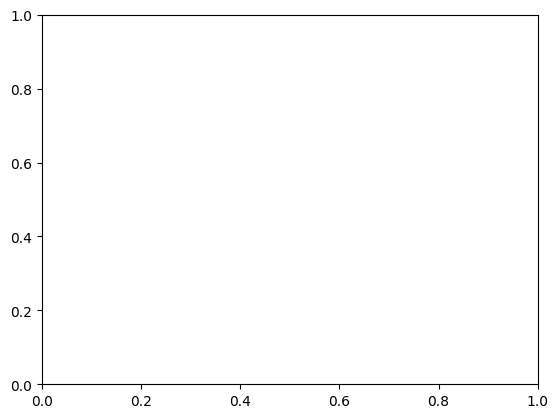

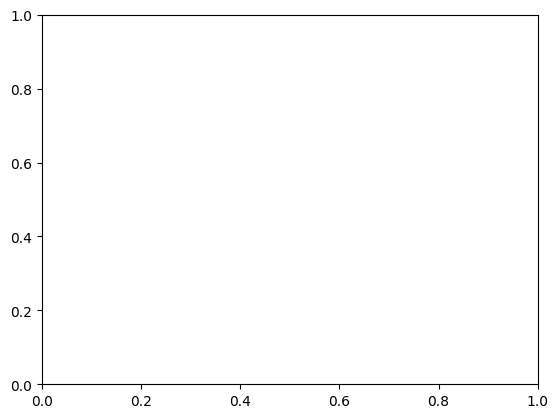

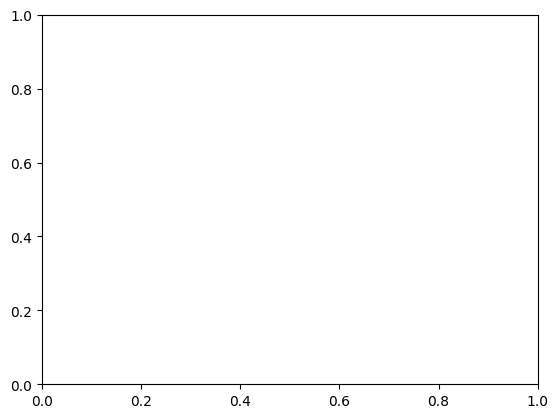

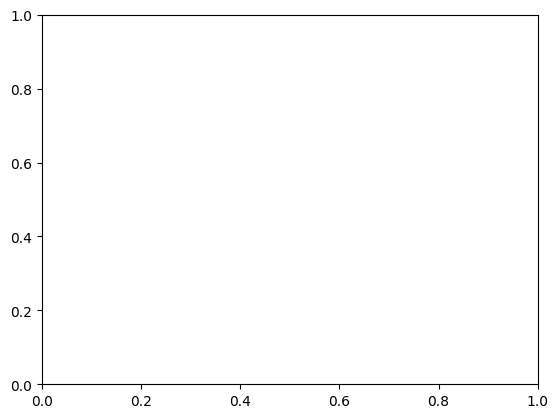

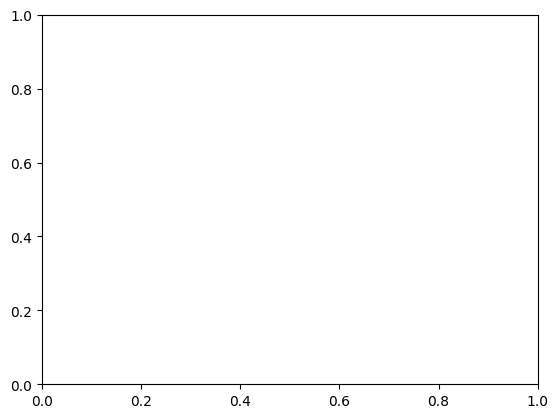

...

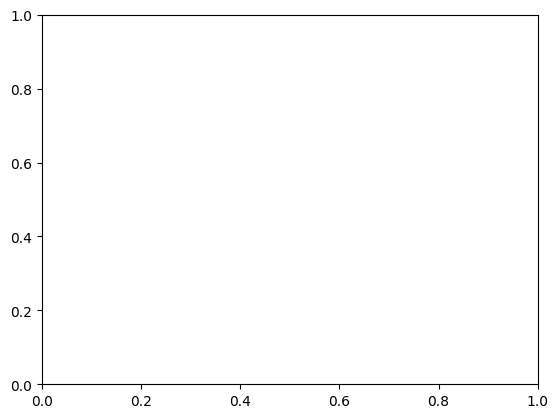

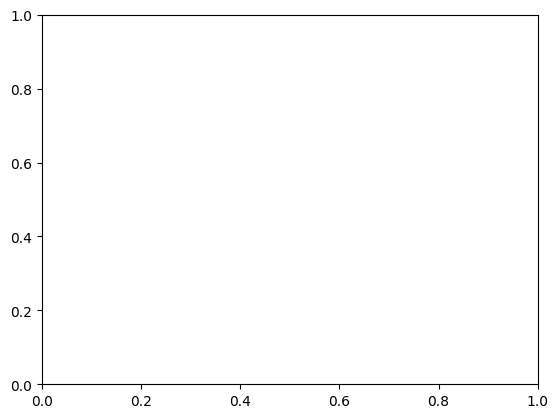

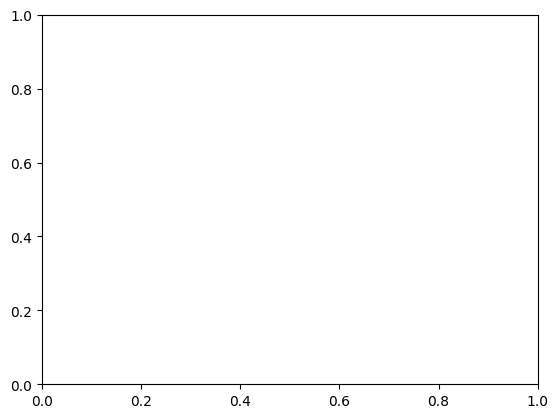

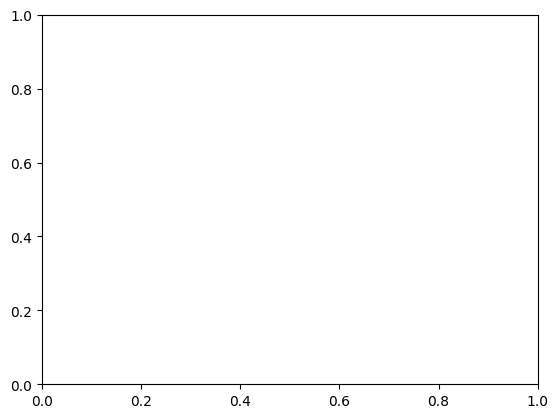

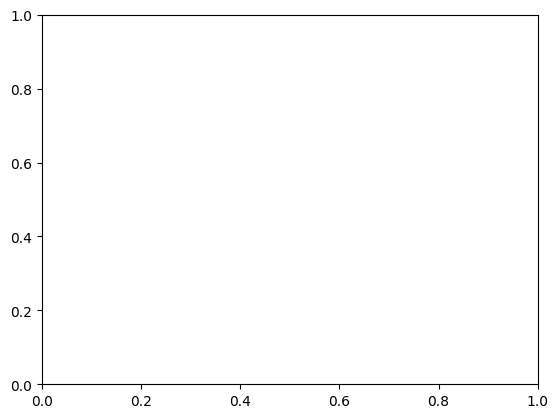

In [4]:
# --- NEW/CONFIRM IMPORTS (safe to repeat) ---
import re
from pathlib import Path
import matplotlib
import matplotlib.collections as mcoll

def _robust_ylim_from_visible(ax, x_min, x_max):
    """Compute robust y-limits from all visible artists within [x_min, x_max]."""
    yvals = []

    # 1) Lines (including errorbar lines)
    for ln in ax.lines:
        if not ln.get_visible():
            continue
        x = ln.get_xdata(orig=False)
        y = ln.get_ydata(orig=False)
        if x is None or y is None:
            continue
        m = (np.asarray(x) >= x_min) & (np.asarray(x) <= x_max)
        if np.any(m):
            yy = np.asarray(y)[m]
            yy = yy[np.isfinite(yy)]
            if yy.size:
                yvals.append(yy)

    # 2) Scatter points (PathCollection with offsets)
    for col in ax.collections:
        if not col.get_visible():
            continue
        # Skip non-PathCollection subclasses that don't expose offsets:
        if hasattr(col, "get_offsets"):
            offs = col.get_offsets()
            if offs is not None and len(offs):
                offs = np.asarray(offs)
                # Some collections store masked arrays:
                if np.ma.isMaskedArray(offs):
                    offs = offs.compressed().reshape(-1, 2) if offs.ndim == 1 else offs.filled(np.nan)
                if offs.ndim == 2 and offs.shape[1] >= 2:
                    xx = offs[:, 0]
                    yy = offs[:, 1]
                    m = (xx >= x_min) & (xx <= x_max) & np.isfinite(yy)
                    if np.any(m):
                        yvals.append(yy[m])

        # 3) Polygons from fill_between (PolyCollection with paths/vertices)
        if isinstance(col, mcoll.PolyCollection) and hasattr(col, "get_paths"):
            for p in col.get_paths():
                # vertices already in data coords for standard artists
                v = p.vertices
                if v is None or not len(v):
                    continue
                xx = v[:, 0]
                yy = v[:, 1]
                m = (xx >= x_min) & (xx <= x_max) & np.isfinite(yy)
                if np.any(m):
                    yvals.append(yy[m])

    if not yvals:
        # Fallback: let Matplotlib attempt, but still avoid symmetric ± small spans
        ax.relim()
        ax.autoscale_view(scalex=False, scaley=True)
        y0, y1 = ax.get_ylim()
        if not np.isfinite([y0, y1]).all() or (y1 - y0) < 1e-3:
            y0, y1 = -0.05, 0.05
        return min(y0, y1), max(y0, y1)

    ycat = np.concatenate(yvals)
    ycat = ycat[np.isfinite(ycat)]
    if ycat.size == 0:
        return -0.05, 0.05

    q_lo, q_hi = np.nanpercentile(ycat, [1.0, 99.0])
    if not np.isfinite(q_lo) or not np.isfinite(q_hi) or (q_hi - q_lo) < 1e-3:
        med = np.nanmedian(ycat)
        span = max(np.nanstd(ycat), 5e-3)
        y_lo, y_hi = med - 3 * span, med + 3 * span
    else:
        pad = 0.10 * (q_hi - q_lo)
        y_lo, y_hi = q_lo - pad, q_hi + pad

    if y_hi <= y_lo:
        y_lo, y_hi = y_lo - 0.05, y_lo + 0.05
    return float(y_lo), float(y_hi)


# -----------------------------------------------
# 1. gather RVs and save RV plot + spectra overlay
#    (NO inline plotting; everything wrapped in plt.ioff())
# -----------------------------------------------
# run_ts = '2025-05-22_17-47-39'
for star_name in specs.star_names:
    star = obs.load_star_instance(star_name)

    for line_tag in emission_lines:
        epochs, rv_vals, rv_errs = [], [], []

        for ep in star.get_all_epoch_numbers():
            if star_name in skip_epochs.keys() and ep in skip_epochs[star_name]:
                continue

            RVs = star.load_property('RVs', ep, 'COMBINED')
            if not RVs:
                continue

            entry = RVs.get(line_tag)
            if entry is None:
                continue
            if hasattr(entry, "item"):
                entry = entry.item()

            epochs.append(ep)
            rv_vals.append(entry.get('full_RV', np.nan))
            rv_errs.append(entry.get('full_RV_err', np.nan))

        if not epochs:
            print(f"{star_name} – {line_tag}: no stored RVs, skipping plots")
            continue

        order     = np.argsort(epochs)
        epochs    = np.array(epochs)[order]
        rv_vals   = np.array(rv_vals, dtype=float)[order]
        rv_errs   = np.array(rv_errs, dtype=float)[order]

        clean_star = re.sub(r"[^A-Za-z0-9_-]", "_", star_name)
        out_dir = Path('..') / 'output' / clean_star / 'CCF' / run_ts / line_tag
        out_dir.mkdir(parents=True, exist_ok=True)

        # ---------------- RV summary (non-interactive) ----------------
        with plt.ioff():
            fig, ax = plt.subplots()
            valid_mask = ~np.isnan(rv_errs)
            if np.any(valid_mask):
                ax.errorbar(epochs[valid_mask], rv_vals[valid_mask], yerr=rv_errs[valid_mask],
                            marker='o', linestyle='None', capsize=4, color='black', label='RV ± err')
            ax.set_xlabel('Epoch number')
            ax.set_ylabel('Radial velocity  [km s$^{-1}$]')
            ax.set_title(f'{star_name} – {line_tag}')
            ax.grid(True)
            ax.legend(loc='best')
            dest_rv = out_dir / 'RVs.png'
            fig.savefig(dest_rv, dpi=300, bbox_inches='tight')
            plt.close(fig)
        print(f"{star_name} – {line_tag}: summary plot written to {dest_rv}")

        # ---------------- Spectra overlay (non-interactive) ----------------
        if np.isfinite(rv_vals).sum() < 2:
            print(f"{star_name} – {line_tag}: <2 finite RVs; skipping spectra overlay")
            continue

        # wavelength window
        try:
            w1, w2 = emission_lines[line_tag]
            x_min, x_max = float(min(w1, w2)), float(max(w1, w2))
        except Exception:
            print(f"{star_name} – {line_tag}: no wavelength window; skipping spectra overlay")
            continue

        # models may not exist upstream
        try:
            _models = models
        except NameError:
            _models = None

        with plt.ioff():
            fig2, ax2 = plt.subplots()

        even_emission_line = True
        for l in range(2):
            star.plot_extreme_rv_spectra(
                emission_line=line_tag,
                emission_lines = emission_lines,
                to_plot=False,          # let it draw; we won’t show
                models=_models,
                correct_lmc=True,
                auto_annotate=True,
                even_emission_line=even_emission_line,
                save = True,
                ts = run_ts
            )
            even_emission_line = False



#### Summary of binary fraction from RVs vs various emission lines

{'O V 3100-3175': np.float64(3137.5), 'O IV 3350-3480': np.float64(3415.0), 'C IV 3650-3900': np.float64(3775.0), 'He II 4686': np.float64(4680.0), 'O VI 5210-5340': np.float64(5272.5), 'C IV 5350-5540': np.float64(5445.0), 'C IV 5808-5812': np.float64(5800.0), 'C III 6700-6800': np.float64(6752.5), 'C III 6970-7100': np.float64(7055.0), 'He I 17100-17630': np.float64(17365.0), 'Mystery 20500-21000': np.float64(20750.0)}
Loaded property from: Data/HD  38029/epoch1/COMBINED/output/RVs.npz
Loaded property from: Data/HD  38029/epoch2/COMBINED/output/RVs.npz
Loaded property from: Data/HD  38029/epoch3/COMBINED/output/RVs.npz
Loaded property from: Data/HD  38029/epoch4/COMBINED/output/RVs.npz
Loaded property from: Data/MNM2014 LMC195-1/epoch1/COMBINED/output/RVs.npz
Loaded property from: Data/MNM2014 LMC195-1/epoch2/COMBINED/output/RVs.npz
Loaded property from: Data/MNM2014 LMC195-1/epoch3/COMBINED/output/RVs.npz
Loaded property from: Data/MNM2014 LMC195-1/epoch5/COMBINED/output/RVs.npz
Loa

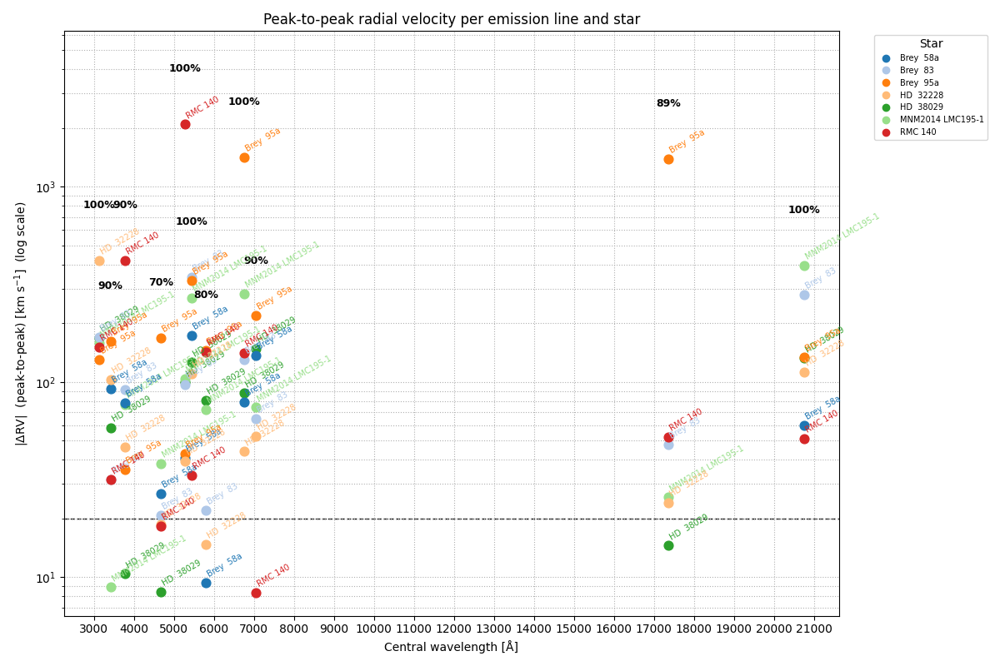

In [5]:
# ======================================================================
#  Peak-to-peak RV scatter (log-y)  +  binary fraction per emission line
# ======================================================================
%matplotlib widget
import pandas as pd
from collections import defaultdict
from itertools import cycle
from matplotlib.ticker import MaxNLocator

# ----------------------------------------------------------------------
#  1.  Emission windows  (Å/10 → Å)  & centres
# ----------------------------------------------------------------------
# emission_lines = {
#     'N IV 3479-3484' : [335., 350.],
#     'N V 4603-4619'  : [456., 480.],
#     'He II 5411'     : [538., 553.5],
#     'C III 5696'     : [570., 590.],
# }
line_centre = {tag: 10 * np.mean(rng) for tag, rng in emission_lines.items()}
print(line_centre)
plot_only_emission_lines = True  # ← set to False to include all RV tags

# ----------------------------------------------------------------------
#  2.  Harvest RVs  (same as before, zero → eps for log scale)
# ----------------------------------------------------------------------
records, eps = [], 1e-3
contaminated_stars = {'Brey  83','HD  38029','Brey  95a','MNM2014 LMC195-1','Brey  58a','HD  32228','RMC 140'}

# for star_name in specs.star_names:
for star_name in contaminated_stars:
    star = obs.load_star_instance(star_name)
    epochs = star.get_all_epoch_numbers()
    per_tag = defaultdict(list)

    for ep in epochs:
        if star_name in skip_epochs:
                if ep in skip_epochs[star_name]:
                    continue
        rv_block = star.load_property('RVs', ep, band='COMBINED')
        if not isinstance(rv_block, dict):
            continue
        for tag, vals in rv_block.items():
            if plot_only_emission_lines and tag not in emission_lines:
                continue
            if isinstance(vals, np.ndarray) and vals.dtype == object and vals.size == 1:
                vals = vals.item()
            if not (isinstance(vals, dict) and 'full_RV' in vals):
               continue
            rv = vals['full_RV']
            if rv is None or np.isnan(rv):
                continue
            per_tag[tag].append(float(rv))

    for tag, rv_list in per_tag.items():
        if len(rv_list) < 2:
            continue
        dRV = np.ptp(rv_list) or eps
        records.append({
            'star': star_name,
            'emission': tag,
            'λ_Å': line_centre.get(tag, np.nan),
            'ΔRV_km_s': dRV,
        })

if not records:
    raise RuntimeError("No usable RV data found.")

df = pd.DataFrame(records)

# ----------------------------------------------------------------------
#  3.  Compute binary fraction per emission line
# ----------------------------------------------------------------------
threshold = 20                   # km/s
frac_dict = {}                   # tag -> fraction (0…1)
for tag, grp in df.groupby('emission'):
    stars_this_line = grp['star'].unique()
    binary_stars = grp.loc[grp['ΔRV_km_s'] > threshold, 'star'].unique()
    frac_dict[tag] = (len(binary_stars)+3) / (len(stars_this_line)+3) if len(stars_this_line) else 0

# ----------------------------------------------------------------------
#  4.  Plot
# ----------------------------------------------------------------------
star_names   = sorted(df['star'].unique())
colour_cycle = cycle(plt.cm.tab20.colors)
star2col     = {s: next(colour_cycle) for s in star_names}

plt.figure(figsize=(12, 8))
ax = plt.gca()
ax.set_yscale('log')

# scatter with text labels
for _, row in df.iterrows():
    x, y, star = row['λ_Å'], row['ΔRV_km_s'], row['star']
    ax.scatter(x, y, color=star2col[star], s=60, zorder=3)
    ax.text(x + 2, y * 1.05, star,
            fontsize=7, color=star2col[star],
            rotation=30, ha='left', va='bottom', zorder=4)

# dashed binary threshold
ax.axhline(threshold, ls='--', lw=1, color='black', zorder=1)

ax.set_xlabel('Central wavelength [Å]')
ax.set_ylabel('|ΔRV|  (peak-to-peak) [km s$^{-1}$]  (log scale)')
ax.set_title('Peak-to-peak radial velocity per emission line and star')
ax.grid(ls=':', which='both', zorder=0)

# star-colour legend
handles = [plt.Line2D([], [], ls='', marker='o',
                      color=star2col[s], label=s) for s in star_names]
ax.legend(handles=handles, title='Star',
          bbox_to_anchor=(1.04, 1), loc='upper left', fontsize=7)

# ----------------------------------------------------------------------
#  5.  Annotate binary fraction above each emission column
# ----------------------------------------------------------------------
for tag, frac in frac_dict.items():
# for tag, frac in line_centre.items():
    # print(tag)
    x = line_centre[tag]
    # y-position: 1.8× the largest ΔRV in that column (or threshold)
    ymax = df.loc[df['emission'] == tag, 'ΔRV_km_s'].max()
    y_text = max(ymax, threshold) * 1.8
    ax.text(x, y_text, f"{frac*100:.0f}%",
            ha='center', va='bottom', fontsize=9, fontweight='bold')

# adjust limits to fit fraction text nicely
y_lim = ax.get_ylim()
ax.xaxis.set_major_locator(MaxNLocator(nbins=20))
ax.set_ylim(y_lim[0], max(y_lim[1], max(df['ΔRV_km_s'])*3))

plt.tight_layout()
plt.show()


### RV vs star name w\ thershold decensding order

16


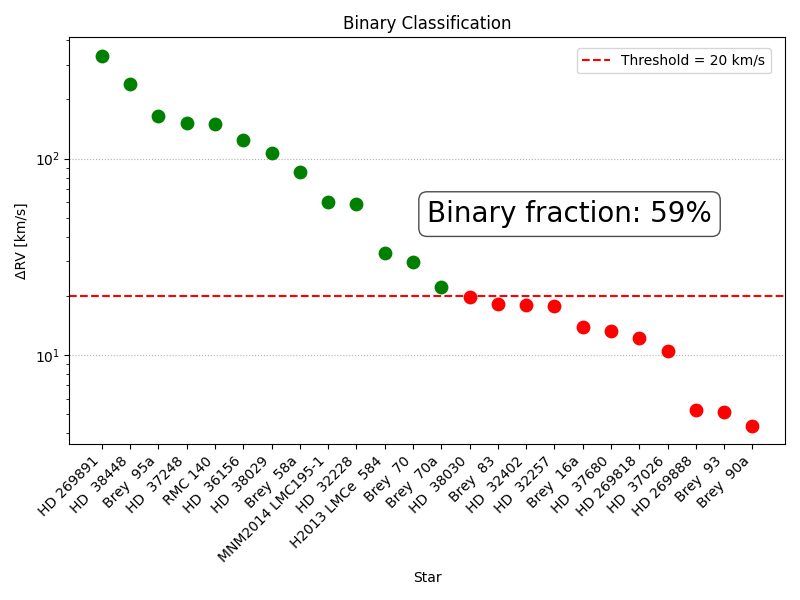

In [38]:
# ======================================================================
#  New figure: Max peak-to-peak ΔRV per star (log₁₀ y, ordered, points)
#  with binary‐fraction annotation (including 3 known binaries)
# ======================================================================
%matplotlib widget
import matplotlib.pyplot as plt
import numpy as np

# 1) Compute each star’s maximum ΔRV across all emission lines
ptp_per_star = df.groupby('star')['ΔRV_km_s'].max()

# 2) Sort descending so the first point is the star with the largest ΔRV
ptp_sorted = ptp_per_star.sort_values(ascending=False)

# 3) Prepare x locations and y values
stars  = list(ptp_sorted.index)
y_vals = np.array(ptp_sorted.values)
x_vals = np.array(range(len(stars)))

# 4) Define threshold and known binaries
threshold = 20  # km/s
known_binaries = ['StarA', 'StarB', 'StarC']  # ← replace with your 3 known binaries

# 5) Compute detected binaries above threshold
detected = [s for s, rv in ptp_sorted.items() if rv > threshold]

# 6) Combine detected + known, compute fraction
all_binaries    = set(detected) | set(known_binaries)
print(len(all_binaries))
binary_fraction = len(all_binaries) / (len(stars)+3) * 100

# 7) Create the scatter plot (y‐axis = log₁₀ ΔRV)
plt.figure(figsize=(8, 6))
plt.scatter(x_vals[y_vals <20], y_vals[y_vals <20], s=80, color='r', zorder=3)


plt.scatter(x_vals[y_vals >=20], y_vals[y_vals >=20], s=80, color='g', zorder=3)


# 8) Draw the detection threshold line
plt.axhline(threshold,
            linestyle='--',
            linewidth=1.5,
            color='r',
            label=f'Threshold = {threshold} km/s',
            zorder=2)
plt.yscale('log')
# 9) Annotate the binary fraction in the upper left (so it’s not hidden)
plt.text(0.5, 0.6,
         f"Binary fraction: {binary_fraction:.0f}%",
         transform=plt.gca().transAxes,
         ha='left', va='top',
         bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.7),
         zorder=4,size = 20)

# 10) Labels, title, and formatting
plt.ylabel('ΔRV [km/s]')
plt.xlabel('Star')
plt.title('Binary Classification')
plt.xticks(ticks=x_vals,
           labels=stars,
           rotation=45,
           ha='right')
plt.grid(axis='y', linestyle=':', zorder=0)

# 11) Move the legend so it doesn’t cover the annotation
plt.legend(loc='upper right', bbox_to_anchor=(0.99, 0.99))

plt.tight_layout()
plt.show()


### |$\Delta$ RV| chart of C IV of all stars

#### no RV rectengles

In [6]:
# === ΔRV dashboard with f_bin row + log-gradient rainbow coloring toggle ===
# Assumes: specs.star_names, obs (ObservationManager), emission_lines (dict), skip_epochs (dict; can be {})

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import textwrap
from IPython.display import display, clear_output
import ipywidgets as widgets

# ---------------- CONFIG ----------------
CIV_KEY = "C IV 5808-5812"   # default sort anchor
THRESH_KMS = 20.0            # threshold for green/red
EXTRA_ABOVE = 3              # add 3 known >=20 km/s not present here
WRAP_COL_WIDTH = 12
WRAP_STAR_WIDTH = 14
BAR_FIGSIZE = (10, 6)

# ---------------- BUILD df (ΔRV per star per emission line) ----------------
def _extract_full_rv(cell):
    try:
        if isinstance(cell, dict):
            return cell.get('full_RV', None)
        if hasattr(cell, "item"):
            v = cell.item()
            if isinstance(v, dict):
                return v.get('full_RV', None)
        if hasattr(cell, "get"):
            return cell.get('full_RV', None)
    except Exception:
        pass
    return None

def _line_delta_rv_for_star(star, line_key):
    rv_vals = []
    for ep in star.get_all_epoch_numbers():
        if star.star_name in skip_epochs and ep in skip_epochs[star.star_name]:
            continue
        RVs = star.load_property('RVs', ep, 'COMBINED')
        if not RVs or line_key not in RVs:
            continue
        rv = _extract_full_rv(RVs[line_key])
        if rv is not None:
            rv_vals.append(rv)
    if rv_vals:
        return abs(max(rv_vals) - min(rv_vals))
    return np.nan

rows = []
for star_name in specs.star_names:
    star = obs.load_star_instance(star_name, to_print=False)
    row = {"Star": star_name}
    for lk in emission_lines.keys():  # preserve dict order
        row[f"dRV | {lk}"] = _line_delta_rv_for_star(star, lk)
    rows.append(row)

df = pd.DataFrame(rows)

# ---------------- Column order & headers ----------------
ordered_lines = list(emission_lines.keys())
ordered_cols = ["Star"] + [f"dRV | {lk}" for lk in ordered_lines if f"dRV | {lk}" in df.columns]

civ_col = f"dRV | {CIV_KEY}"
if civ_col not in df.columns:
    raise RuntimeError(f"'{civ_col}' not found in df.")

df = df.sort_values(civ_col, ascending=False, na_position="last").reset_index(drop=True)

def wrap_header(colname: str) -> str:
    if colname == "Star":
        return "Star"
    friendly = colname.replace("dRV | ", "dRV\n")
    return "\n".join(textwrap.wrap(friendly, width=WRAP_COL_WIDTH, break_long_words=True))

header_map = {c: wrap_header(c) for c in ordered_cols}

def wrap_str(s, width):
    if pd.isna(s):
        return s
    return "\n".join(textwrap.wrap(str(s), width=width, break_long_words=True)) or str(s)

# ---------------- f_bin helpers ----------------
def fbin_text(series: pd.Series) -> str:
    valid = series.dropna()
    n_total = int(valid.size)
    if n_total == 0:
        return "f_bin: —"
    n_above = int((valid >= THRESH_KMS).sum())
    n_total_adj = n_total + EXTRA_ABOVE
    n_above_adj = n_above + EXTRA_ABOVE
    frac_adj = (n_above_adj / n_total_adj) if n_total_adj > 0 else np.nan
    return f"f_bin: {n_above_adj}/{n_total_adj} = {frac_adj:.0%}"

# ---------------- Styling helpers ----------------
def color_by_threshold(v):
    try:
        if pd.isna(v):
            return ""
        return "color: green" if float(v) >= THRESH_KMS else "color: red"
    except Exception:
        return ""

def color_log_gradient_col(col: pd.Series):
    """
    Column-wise log gradient coloring (rainbow colormap).
    - Skips f_bin row (index 0) and NaNs.
    """
    data = pd.to_numeric(col.iloc[1:], errors="coerce")
    # use log scale
    data_log = np.log1p(data)  # log(1+x) to handle zeros safely
    vmin, vmax = np.nanmin(data_log), np.nanmax(data_log)
    rng = (vmax - vmin) if (vmax > vmin) else 1.0

    cmap = plt.cm.rainbow
    styles = []
    for i, val in enumerate(col):
        if i == 0:
            styles.append("")  # skip f_bin row
            continue
        try:
            if pd.isna(val):
                styles.append("")
                continue
            t = (np.log1p(float(val)) - vmin) / rng
            r, g, b, _ = cmap(t)
            styles.append(f"color: rgb({int(r*255)},{int(g*255)},{int(b*255)})")
        except Exception:
            styles.append("")
    return styles

# ---------------- RENDER ----------------
def render(sort_col: str, ascending: bool, use_gradient: bool):
    base = df.copy()
    base = base[[c for c in ordered_cols if c in base.columns]]
    base = base.sort_values(sort_col, ascending=ascending, na_position="last").reset_index(drop=True)

    # prepend f_bin row
    fbin_row = {"Star": "f_bin"}
    for col in base.columns:
        if col == "Star":
            continue
        fbin_row[col] = fbin_text(base[col])
    base_with = pd.concat([pd.DataFrame([fbin_row], columns=base.columns), base], ignore_index=True)

    # wrapped display
    df_display = base_with.copy()
    if df_display.shape[0] > 1:
        df_display.loc[1:, "Star"] = df_display.loc[1:, "Star"].apply(lambda s: wrap_str(s, WRAP_STAR_WIDTH))

    wrapped_cols = [header_map[c] for c in df_display.columns]
    df_display.columns = wrapped_cols
    numeric_wrapped_cols = [header_map[c] for c in ordered_cols if c != "Star" and header_map[c] in wrapped_cols]

    def bold_first_row(row):
        return ["font-weight: 600" if row.name == df_display.index[0] else "" for _ in row]

    styler = (
        df_display.style
        .set_properties(**{"white-space": "pre-wrap", "word-wrap": "break-word", "max-width": "12em"})
        .set_table_styles([{"selector": "th",
                            "props": [("white-space", "pre-wrap"),
                                      ("word-wrap", "break-word"),
                                      ("max-width", "12em")]}])
        .format(lambda v: f"{v:.1f}" if isinstance(v, (float, int)) else v)
        .apply(bold_first_row, axis=1)
    )

    if use_gradient:
        styler = styler.apply(color_log_gradient_col, axis=0, subset=numeric_wrapped_cols)
    else:
        styler = styler.map(color_by_threshold, subset=(df_display.index[1:], numeric_wrapped_cols))

    display(styler)

    # bar chart of active column (threshold colors)
    vals = base[sort_col].to_numpy()
    x = np.arange(len(base))
    colors = ["green" if (not pd.isna(v) and v >= THRESH_KMS) else "red" for v in vals]

    plt.figure(figsize=BAR_FIGSIZE)
    plt.bar(x, vals, color=colors)
    plt.axhline(THRESH_KMS, linestyle="--", linewidth=1)

    for xi, yi, c in zip(x, vals, colors):
        if pd.isna(yi): continue
        plt.text(xi, yi, f"{yi:.1f}", ha="center", va="bottom", fontsize=9, color=c)

    plt.xticks(x, [wrap_str(s, 10) for s in base["Star"]], rotation=0, ha="center")
    plt.ylabel("|ΔRV| (km/s)")
    line_label = sort_col.replace("dRV | ", "")
    plt.title(f"Peak-to-peak |ΔRV| for {line_label} ({'asc' if ascending else 'desc'})")
    plt.tight_layout()
    plt.show()

# ---------------- Interactive controls ----------------
state = {"sort_col": civ_col, "ascending": False, "gradient": False}
btn_for_col = {}

def update_buttons():
    for col, btn in btn_for_col.items():
        active = (col == state["sort_col"])
        arrow = "↑" if (active and state["ascending"]) else ("↓" if active else "")
        btn.description = f"{header_map[col]} {arrow}".rstrip()
        btn.button_style = "info" if active else ""

def on_click(col):
    def _handler(_):
        if col == state["sort_col"]:
            state["ascending"] = not state["ascending"]
        else:
            state["sort_col"] = col
            state["ascending"] = False
        with out:
            clear_output(wait=True)
            render(state["sort_col"], state["ascending"], state["gradient"])
        update_buttons()
    return _handler

# gradient toggle
gradient_chk = widgets.Checkbox(value=False, description="Log-gradient rainbow coloring", indent=False)
def on_toggle(change):
    if change["name"] == "value":
        state["gradient"] = bool(change["new"])
        with out:
            clear_output(wait=True)
            render(state["sort_col"], state["ascending"], state["gradient"])
gradient_chk.observe(on_toggle)

# header buttons
buttons = []
for col in ordered_cols:
    b = widgets.Button(
        description=header_map[col],
        tooltip=f"Sort by {header_map[col]} (click again to toggle asc/desc)",
        layout=widgets.Layout(width="auto")
    )
    b.on_click(on_click(col))
    btn_for_col[col] = b
    buttons.append(b)

controls_bar = widgets.HBox([gradient_chk], layout=widgets.Layout(gap="12px"))
headers_bar = widgets.HBox(buttons, layout=widgets.Layout(flex_flow="row wrap", gap="6px"))
out = widgets.Output()

display(controls_bar)
display(headers_bar)
display(out)

with out:
    clear_output(wait=True)
    render(state["sort_col"], state["ascending"], state["gradient"])
update_buttons()


Loaded property from: Data/Brey  70/epoch1/COMBINED/output/RVs.npz
Loaded property from: Data/Brey  70/epoch2/COMBINED/output/RVs.npz
Loaded property from: Data/Brey  70/epoch3/COMBINED/output/RVs.npz
Loaded property from: Data/Brey  70/epoch4/COMBINED/output/RVs.npz
Loaded property from: Data/Brey  70/epoch5/COMBINED/output/RVs.npz
Loaded property from: Data/Brey  70/epoch6/COMBINED/output/RVs.npz
Loaded property from: Data/Brey  70/epoch1/COMBINED/output/RVs.npz
Loaded property from: Data/Brey  70/epoch2/COMBINED/output/RVs.npz
Loaded property from: Data/Brey  70/epoch3/COMBINED/output/RVs.npz
Loaded property from: Data/Brey  70/epoch4/COMBINED/output/RVs.npz
Loaded property from: Data/Brey  70/epoch5/COMBINED/output/RVs.npz
Loaded property from: Data/Brey  70/epoch6/COMBINED/output/RVs.npz
Loaded property from: Data/Brey  70/epoch1/COMBINED/output/RVs.npz
Loaded property from: Data/Brey  70/epoch2/COMBINED/output/RVs.npz
Loaded property from: Data/Brey  70/epoch3/COMBINED/output/RVs

Output()

#### more detailed table

In [3]:
# === ΔRV dashboard with per-cell epoch strips + continuous lines + clean-star indicator + mean/std (JupyterLab-safe) ===
# Assumes: specs.star_names, obs, emission_lines, skip_epochs, skip_emission_lines

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import textwrap
from IPython.display import display, clear_output
import ipywidgets as widgets

# ---------------- CONFIG ----------------
CIV_KEY = "C IV 5808-5812"
THRESH_KMS = 20.0
EXTRA_ABOVE = 3
WRAP_COL_WIDTH = 12
WRAP_STAR_WIDTH = 14
BAR_FIGSIZE = (12, 6)
EPOCHS_TO_SHOW = 7

MEAN_COL = "Mean ΔRV"
STD_COL  = "Std ΔRV"

# Epoch strip visuals (for continuity across columns)
EPOCH_STRIP_H = 6    # px height per epoch strip
EPOCH_STRIP_GAP = 2  # px vertical gap between strips

# ---------- helpers ----------
def _extract_full_rv(cell):
    try:
        if isinstance(cell, dict):
            return cell.get('full_RV', None)
        if hasattr(cell, "item"):
            v = cell.item()
            if isinstance(v, dict):
                return v.get('full_RV', None)
        if hasattr(cell, "get"):
            return cell.get('full_RV', None)
    except Exception:
        pass
    return None

def _is_epoch_skipped_for_line(star_name, line_key, ep):
    if star_name in skip_epochs and ep in skip_epochs[star_name]:
        return True
    if star_name in skip_emission_lines and line_key in skip_emission_lines[star_name]:
        arr = np.atleast_1d(skip_emission_lines[star_name][line_key])
        if 0 in arr:  # 0 means all epochs for that line
            return True
        if ep in arr:
            return True
    return False

rv_epoch_cache = {}  # (star_name, line_key) -> list of (ep, rv, included)

def _line_delta_rv_for_star(star, line_key):
    rv_vals, cache = [], []
    for ep in star.get_all_epoch_numbers():
        if _is_epoch_skipped_for_line(star.star_name, line_key, ep):
            cache.append((ep, np.nan, False))
            continue
        RVs = star.load_property('RVs', ep, 'COMBINED')
        if not RVs or line_key not in RVs:
            cache.append((ep, np.nan, False))
            continue
        rv = _extract_full_rv(RVs[line_key])
        if rv is None:
            cache.append((ep, np.nan, False))
            continue
        rv = float(rv)
        rv_vals.append(rv)
        cache.append((ep, rv, True))
    rv_epoch_cache[(star.star_name, line_key)] = cache
    return abs(max(rv_vals) - min(rv_vals)) if rv_vals else np.nan

def _is_clean_star(star):
    """Clean star if ALL epochs have cleaned_normalized_flux in COMBINED."""
    try:
        for ep in star.get_all_epoch_numbers():
            flux = star.load_property('cleaned_normalized_flux', ep, 'COMBINED')
            if flux is not None:
                return True
        return False
    except Exception:
        return False

# Build df
rows = []
for star_name in specs.star_names:
    star = obs.load_star_instance(star_name, to_print=False)
    row = {"Star": star_name, "Clean": "✓" if _is_clean_star(star) else ""}
    for lk in emission_lines.keys():  # preserve dict order
        row[f"dRV | {lk}"] = _line_delta_rv_for_star(star, lk)
    # mean / std across available dRV columns (ignore NaNs)
    drvs = [v for k, v in row.items() if isinstance(k, str) and k.startswith("dRV | ")]
    row[MEAN_COL] = float(np.nanmean(drvs)) if np.isfinite(np.nanmean(drvs)) else np.nan
    row[STD_COL]  = float(np.nanstd(drvs))  if np.isfinite(np.nanstd(drvs))  else np.nan
    rows.append(row)

df = pd.DataFrame(rows)

ordered_lines = list(emission_lines.keys())
# Include mean/std right after Clean
ordered_cols = ["Star", "Clean", MEAN_COL, STD_COL] + [f"dRV | {lk}" for lk in ordered_lines if f"dRV | {lk}" in df.columns]

civ_col = f"dRV | {CIV_KEY}"
if civ_col in df.columns:
    df = df.sort_values(civ_col, ascending=False, na_position="last").reset_index(drop=True)

def wrap_header(colname: str) -> str:
    if colname in ("Star", "Clean", MEAN_COL, STD_COL):
        return colname
    return "\n".join(textwrap.wrap(colname.replace("dRV | ", "dRV\n"),
                                   width=WRAP_COL_WIDTH, break_long_words=True))

def wrap_str(s, width):
    if pd.isna(s): return s
    return "\n".join(textwrap.wrap(str(s), width=width, break_long_words=True)) or str(s)

def fbin_text(series: pd.Series) -> str:
    valid = series.dropna()
    n_total = int(valid.size)
    if n_total == 0: return "f_bin: —"
    n_above = int((valid >= THRESH_KMS).sum())
    n_total_adj = n_total + EXTRA_ABOVE
    n_above_adj = n_above + EXTRA_ABOVE
    frac_adj = n_above_adj / n_total_adj if n_total_adj > 0 else np.nan
    return f"f_bin: {n_above_adj}/{n_total_adj} = {frac_adj:.0%}"

# ---------- epoch strip rendering (HTML) ----------
# Renders 7 full-width horizontal strips (one per epoch).
# Included epoch -> orange (min=max epochs colored red/blue).
# Not included -> transparent, so the line "breaks" in that column.
def _epoch_blocks_html_for_cell(star_name: str, line_key: str, epochs_to_show: int = 7) -> str:
    per_epoch = rv_epoch_cache.get((star_name, line_key), [])
    rv_by_ep = {ep: rv for ep, rv, inc in per_epoch if np.isfinite(rv) and inc}
    inc_by_ep = {ep: inc for ep, rv, inc in per_epoch}

    min_ep = max_ep = None
    if rv_by_ep:
        items = list(rv_by_ep.items())
        min_ep = min(items, key=lambda t: t[1])[0]
        max_ep = max(items, key=lambda t: t[1])[0]

    rows_html = []
    for ep in range(1, epochs_to_show + 1):
        included = bool(inc_by_ep.get(ep, False) and np.isfinite(rv_by_ep.get(ep, np.nan)))
        bg = "transparent"
        if included:
            bg = "orange"
            if ep == min_ep: bg = "blue"
            elif ep == max_ep: bg = "red"
        rows_html.append(
            f"<div style='width:100%;height:{EPOCH_STRIP_H}px;margin:{EPOCH_STRIP_GAP//2}px 0;background:{bg};'></div>"
        )

    return (
        f"<div style='display:flex;flex-direction:column;align-items:stretch;line-height:1;width:100%;'>"
        + "".join(rows_html) +
        "</div>"
    )

def _html_cell_with_epochs(value, star_name: str, line_key: str) -> str:
    num = "" if pd.isna(value) else f"{float(value):.1f}"
    html = _epoch_blocks_html_for_cell(star_name, line_key, epochs_to_show=EPOCHS_TO_SHOW)
    return (
        f"<div style='display:flex;flex-direction:column;align-items:center;gap:2px;'>"
        f"<div>{num}</div>{html}</div>"
    )

# ---------- log rainbow text gradient (high → red, low → blue) ----------
def color_log_rainbow_text_col(col: pd.Series):
    try:
        vals = pd.to_numeric(col.iloc[1:], errors="coerce")
    except Exception:
        return [""] * len(col)
    if vals.notna().sum() == 0:
        return [""] * len(col)

    data_log = np.log1p(vals)  # safe for zeros
    vmin, vmax = np.nanmin(data_log), np.nanmax(data_log)
    rng = vmax - vmin if vmax > vmin else 1.0
    cmap = plt.cm.rainbow

    styles = [""]
    for v in vals:
        if not np.isfinite(v):
            styles.append("")
            continue
        t = (np.log1p(float(v)) - vmin) / rng
        t = np.clip(t, 0.0, 1.0)   # full rainbow scale: low→blue, high→red
        r, g, b, _ = cmap(t)
        styles.append(f"color: rgb({int(r*255)},{int(g*255)},{int(b*255)})")
    return styles

# ---------------- RENDER ----------------
def render(sort_col: str, ascending: bool, use_gradient: bool):
    base = df.copy()
    base = base[ordered_cols]
    # Prefer CIV, else Mean ΔRV, else first numeric column
    sort_col_candidates = [c for c in [civ_col, MEAN_COL] if c in base.columns]
    sort_col_use = sort_col if sort_col in base.columns else (sort_col_candidates[0] if sort_col_candidates else base.columns[2])
    base = base.sort_values(sort_col_use, ascending=ascending, na_position="last").reset_index(drop=True)

    # f_bin row
    fbin_row = {col: "" for col in base.columns}
    fbin_row["Star"] = "f_bin"
    fbin_row["Clean"] = ""
    for col in base.columns:
        # Only compute f_bin per emission line columns
        if col.startswith("dRV | "):
            fbin_row[col] = fbin_text(base[col])
    base_with = pd.concat([pd.DataFrame([fbin_row], columns=base.columns), base], ignore_index=True)

    # build display with epoch strips in each dRV cell
    df_display = base_with.copy()
    if df_display.shape[0] > 1:
        df_display.loc[1:, "Star"] = df_display.loc[1:, "Star"].apply(lambda s: wrap_str(s, WRAP_STAR_WIDTH))

    for col in [c for c in df_display.columns if c not in ("Star", "Clean", MEAN_COL, STD_COL)]:
        if not col.startswith("dRV | "):
            continue
        line_key = col.replace("dRV | ", "")
        for i in range(1, len(df_display)):
            star_name = base_with.at[i, "Star"]
            val = base_with.at[i, col]
            df_display.at[i, col] = _html_cell_with_epochs(val, star_name, line_key)

    header_map_local = {c: wrap_header(c) for c in df_display.columns}
    df_display.columns = [header_map_local[c] for c in df_display.columns]
    numeric_wrapped_cols = [header_map_local[c] for c in base.columns if c not in ("Star", "Clean")]

    def bold_first_row(row):
        return ["font-weight: 600" if row.name == df_display.index[0] else "" for _ in row]

    # ---- Styler with table stitching CSS ----
    styler = (
        df_display.style
        .hide(axis="index")
        .set_table_styles([
            {"selector": "table", "props": [("border-collapse", "collapse"),
                                            ("border-spacing", "0")]},
            {"selector": "td", "props": [("padding", "2px 4px"),
                                         ("border", "none"),
                                         ("vertical-align", "middle")]},
            {"selector": "th", "props": [("white-space", "pre-wrap"),
                                         ("word-wrap", "break-word"),
                                         ("max-width", "12em"),
                                         ("border", "none"),
                                         ("vertical-align", "bottom")]},
        ])
        .set_properties(**{"white-space": "pre-wrap",
                           "word-wrap": "break-word",
                           "max-width": "16em",
                           "text-align": "center"})
        .format(na_rep="", subset=numeric_wrapped_cols)   # JupyterLab-safe (no escape=False)
        .apply(bold_first_row, axis=1)
    )

    if use_gradient:
        # apply log-rainbow text gradient per numeric column (includes Mean/Std and all dRV cols)
        for wrapped_col in numeric_wrapped_cols:
            # reverse lookup original col name
            orig_col = None
            for k, v in header_map_local.items():
                if v == wrapped_col:
                    orig_col = k
                    break
            if orig_col is None:
                continue
            styler = styler.apply(
                lambda s, oc=orig_col: color_log_rainbow_text_col(base_with[oc]),
                axis=0, subset=[wrapped_col]
            )
    else:
        # threshold coloring using underlying NUMERIC values; skip f_bin row
        def thr_styles_for_col(colname):
            if colname in (MEAN_COL, STD_COL):
                # Optional: color mean/std too; here we do it for Mean only, leave Std neutral.
                if colname == STD_COL:
                    return [""] * len(base_with)
            data = base_with[colname].copy()
            styles = []
            styles.append("")  # row 0 (f_bin)
            for i in range(1, len(base_with)):
                v = data.iat[i]
                if pd.isna(v):
                    styles.append("")
                else:
                    styles.append("color: green" if float(v) >= THRESH_KMS else "color: red")
            return styles

        for wrapped_col in numeric_wrapped_cols:
            orig_col = None
            for k, v in header_map_local.items():
                if v == wrapped_col:
                    orig_col = k
                    break
            if orig_col is None:
                continue
            styler = styler.apply(lambda s, oc=orig_col: thr_styles_for_col(oc), axis=0, subset=[wrapped_col])

    display(styler)

    # bar chart (threshold-colored for readability)
    vals = base[sort_col_use].to_numpy()
    x = np.arange(len(base))
    colors = ["green" if (pd.notna(v) and v >= THRESH_KMS) else "red" for v in vals]
    plt.figure(figsize=BAR_FIGSIZE)
    plt.bar(x, vals, color=colors)
    plt.axhline(THRESH_KMS, linestyle="--", linewidth=1)
    for xi, yi, c in zip(x, vals, colors):
        if pd.isna(yi): continue
        plt.text(xi, yi, f"{yi:.1f}", ha="center", va="bottom", fontsize=9, color=c)
    plt.xticks(x, [wrap_str(s, 10) for s in base["Star"]], rotation=0, ha="center")
    plt.ylabel("|ΔRV| (km/s)")
    plt.title(f"Peak-to-peak |ΔRV| for {sort_col_use.replace('dRV | ', '')} ({'asc' if ascending else 'desc'})")
    plt.tight_layout()
    plt.show()

# ---------------- Interactive controls ----------------
# Default sort: CIV if present else Mean ΔRV else first numeric
default_sort = civ_col if civ_col in df.columns else (MEAN_COL if MEAN_COL in df.columns else (ordered_cols[2] if len(ordered_cols) > 2 else "Star"))
state = {"sort_col": default_sort, "ascending": False, "gradient": True}
btn_for_col = {}

def update_buttons():
    for col, btn in btn_for_col.items():
        active = (col == state["sort_col"])
        arrow = "↑" if (active and state["ascending"]) else ("↓" if active else "")
        btn.description = f"{wrap_header(col)} {arrow}".rstrip()
        btn.button_style = "info" if active else ""

def on_click(col):
    def _handler(_):
        if col == state["sort_col"]:
            state["ascending"] = not state["ascending"]
        else:
            state["sort_col"] = col
            state["ascending"] = False
        with out:
            clear_output(wait=True)
            render(state["sort_col"], state["ascending"], state["gradient"])
        update_buttons()
    return _handler

gradient_chk = widgets.Checkbox(value=True, description="Log rainbow text gradient", indent=False)
def on_toggle(change):
    if change["name"] == "value":
        state["gradient"] = bool(change["new"])
        with out:
            clear_output(wait=True)
            render(state["sort_col"], state["ascending"], state["gradient"])
gradient_chk.observe(on_toggle)

buttons = []
for col in ordered_cols:
    b = widgets.Button(
        description=wrap_header(col),
        tooltip=f"Sort by {wrap_header(col)} (click again to toggle asc/desc)",
        layout=widgets.Layout(width="auto")
    )
    b.on_click(on_click(col))
    btn_for_col[col] = b
    buttons.append(b)

controls_bar = widgets.HBox([gradient_chk], layout=widgets.Layout(gap="12px"))
headers_bar = widgets.HBox(buttons, layout=widgets.Layout(flex_flow="row wrap", gap="6px"))
out = widgets.Output()

display(controls_bar)
display(headers_bar)
display(out)

with out:
    clear_output(wait=True)
    render(state["sort_col"], state["ascending"], state["gradient"])
update_buttons()


Spectral type not found in the SIMBAD response.
BAT99 identifier not found. The indexes were: -1 and 39. It found sion="1.0" encoding="UTF-8" ?>
BAT99 identifier not found. The indexes were: -1 and 39. It found sion="1.0" encoding="UTF-8" ?>


Output()

In [15]:
# === ΔRV dashboard with per-cell epoch strips + continuous lines + clean-star indicator + mean/std + 4σ rule (JupyterLab-safe) ===
# Assumes: specs.star_names, obs, emission_lines, skip_epochs, skip_emission_lines

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import textwrap
from IPython.display import display, clear_output
import ipywidgets as widgets
import math

# ---------------- CONFIG ----------------
CIV_KEY = "C IV 5808-5812"
THRESH_KMS = 20.0
EXTRA_ABOVE = 3
WRAP_COL_WIDTH = 12
WRAP_STAR_WIDTH = 14
BAR_FIGSIZE = (12, 6)
EPOCHS_TO_SHOW = 7

MEAN_COL = "Mean ΔRV"
STD_COL  = "Std ΔRV"

# Epoch strip visuals (for continuity across columns)
EPOCH_STRIP_H = 6    # px height per epoch strip
EPOCH_STRIP_GAP = 2  # px vertical gap between strips

# ---------- helpers ----------
def _extract_full_rv(cell):
    try:
        if isinstance(cell, dict):
            return cell.get('full_RV', None)
        if hasattr(cell, "item"):
            v = cell.item()
            if isinstance(v, dict):
                return v.get('full_RV', None)
        if hasattr(cell, "get"):
            return cell.get('full_RV', None)
    except Exception:
        pass
    return None

def _extract_rv_err(cell):
    """Best-effort pull of RV uncertainty from a line-measurement dict."""
    if not isinstance(cell, dict):
        try:
            if hasattr(cell, "item"):
                v = cell.item()
                if isinstance(v, dict):
                    cell = v
        except Exception:
            return None
    if not isinstance(cell, dict):
        return None
    for k in ("full_RV_err", "RV_err", "sigma", "err", "error", "std", "unc", "uncertainty"):
        if k in cell and cell[k] is not None:
            try:
                return float(cell[k])
            except Exception:
                continue
    return None

def _is_epoch_skipped_for_line(star_name, line_key, ep):
    if star_name in skip_epochs and ep in skip_epochs[star_name]:
        return True
    if star_name in skip_emission_lines and line_key in skip_emission_lines[star_name]:
        arr = np.atleast_1d(skip_emission_lines[star_name][line_key])
        if 0 in arr:  # 0 means all epochs for that line
            return True
        if ep in arr:
            return True
    return False

# Cache: (star, line) -> list of tuples (ep, rv, included, err)
rv_epoch_cache = {}
# Cache: (star, line) -> dict with sigma, ratio, min_ep, max_ep
p2p_sig_cache = {}

def _line_delta_rv_for_star(star, line_key):
    """Compute |ΔRV| for this star/line, fill caches including σ from min/max epochs."""
    rv_list = []
    cache = []
    for ep in star.get_all_epoch_numbers():
        if _is_epoch_skipped_for_line(star.star_name, line_key, ep):
            cache.append((ep, np.nan, False, np.nan))
            continue
        RVs = star.load_property('RVs', ep, 'COMBINED')
        if not RVs or line_key not in RVs:
            cache.append((ep, np.nan, False, np.nan))
            continue
        cell = RVs[line_key]
        rv = _extract_full_rv(cell)
        if rv is None:
            cache.append((ep, np.nan, False, np.nan))
            continue
        rv = float(rv)
        err = _extract_rv_err(cell)
        err = float(err) if (err is not None and np.isfinite(err)) else np.nan
        if star_name == 'Brey  90a' and line_key == 'O V 3100-3175':
            print(f'for ep {ep} the error is: {err}')
        rv_list.append((ep, rv, err))
        cache.append((ep, rv, True, err))

    rv_epoch_cache[(star.star_name, line_key)] = cache

    if not rv_list:
        p2p_sig_cache[(star.star_name, line_key)] = dict(sigma=np.nan, ratio=np.nan, min_ep=None, max_ep=None)
        return np.nan

    # endpoints by RV
    min_ep, min_rv, min_err = min(rv_list, key=lambda t: t[1])
    max_ep, max_rv, max_err = max(rv_list, key=lambda t: t[1])
    p2p = abs(max_rv - min_rv)

    # σ from the *two* endpoints
    if np.isfinite(min_err) and np.isfinite(max_err):
        sigma = math.sqrt(min_err**2 + max_err**2)
        ratio = p2p / sigma if sigma > 0 else np.nan
    else:
        sigma, ratio = np.nan, np.nan

    p2p_sig_cache[(star.star_name, line_key)] = dict(sigma=sigma, ratio=ratio, min_ep=min_ep, max_ep=max_ep)
    return p2p

def _is_clean_star(star):
    """Clean star if ALL epochs have cleaned_normalized_flux in COMBINED."""
    try:
        for ep in star.get_all_epoch_numbers():
            flux = star.load_property('cleaned_normalized_flux', ep, 'COMBINED')
            if flux is not None:
                return True
        return False
    except Exception:
        return False

def _classify_gyr(star_name, line_key, value):
    """
    Green / Yellow / Red:
      - Red:     |ΔRV| < THRESH_KMS (regardless of σ)
      - Yellow:  |ΔRV| ≥ THRESH_KMS but (|ΔRV|/σ < 4) or σ unknown
      - Green:   |ΔRV| ≥ THRESH_KMS and (|ΔRV|/σ ≥ 4)
    """
    if not (pd.notna(value) and np.isfinite(value)):
        return "red"
    v = float(value)
    if v < THRESH_KMS:
        return "red"
    # if star_name == 'Brey  90a' and line_key == 'O V 3100-3175':
    #     print(p2p_sig_cache)
    info = p2p_sig_cache.get((star_name, line_key), {})
    ratio = info.get("ratio", np.nan)
    if not np.isfinite(ratio):
        return "yellow"
    return "green" if ratio >= 4.0 else "yellow"

# Build df
rows = []
for star_name in specs.star_names:
    star = obs.load_star_instance(star_name, to_print=False)
    row = {"Star": star_name, "Clean": "✓" if _is_clean_star(star) else ""}
    for lk in emission_lines.keys():  # preserve dict order
        row[f"dRV | {lk}"] = _line_delta_rv_for_star(star, lk)
    # mean / std across available dRV columns (ignore NaNs)
    drvs = [v for k, v in row.items() if isinstance(k, str) and k.startswith("dRV | ")]
    row[MEAN_COL] = float(np.nanmean(drvs)) if np.isfinite(np.nanmean(drvs)) else np.nan
    row[STD_COL]  = float(np.nanstd(drvs))  if np.isfinite(np.nanstd(drvs))  else np.nan
    rows.append(row)

df = pd.DataFrame(rows)

ordered_lines = list(emission_lines.keys())
# Include mean/std right after Clean
ordered_cols = ["Star", "Clean", MEAN_COL, STD_COL] + [f"dRV | {lk}" for lk in ordered_lines if f"dRV | {lk}" in df.columns]

civ_col = f"dRV | {CIV_KEY}"
if civ_col in df.columns:
    df = df.sort_values(civ_col, ascending=False, na_position="last").reset_index(drop=True)

def wrap_header(colname: str) -> str:
    if colname in ("Star", "Clean", MEAN_COL, STD_COL):
        return colname
    return "\n".join(textwrap.wrap(colname.replace("dRV | ", "dRV\n"),
                                   width=WRAP_COL_WIDTH, break_long_words=True))

def wrap_str(s, width):
    if pd.isna(s): return s
    return "\n".join(textwrap.wrap(str(s), width=width, break_long_words=True)) or str(s)

# f_bin ALWAYS uses (threshold AND ≥ 4σ)
def fbin_text_always_sigma(base_df: pd.DataFrame, colname: str) -> str:
    if not colname.startswith("dRV | "):
        return ""
    valid_mask = base_df[colname].notna()
    n_total = int(valid_mask.sum())
    if n_total == 0:
        return "f_bin: —"
    line_key = colname.replace("dRV | ", "")
    n_green = 0
    for _, row in base_df[valid_mask][["Star", colname]].iterrows():
        star_name = row["Star"]
        v = row[colname]
        if _classify_gyr(star_name, line_key, v) == "green":
            n_green += 1
    n_total_adj = n_total + EXTRA_ABOVE
    n_green_adj = n_green + EXTRA_ABOVE
    frac_adj = n_green_adj / n_total_adj if n_total_adj > 0 else np.nan
    return f"f_bin: {n_green_adj}/{n_total_adj} = {frac_adj:.0%}"

# ---------- epoch strip rendering (HTML) ----------
# Renders 7 full-width horizontal strips (one per epoch).
def _epoch_blocks_html_for_cell(star_name: str, line_key: str, epochs_to_show: int = 7) -> str:
    per_epoch = rv_epoch_cache.get((star_name, line_key), [])
    rv_by_ep, inc_by_ep = {}, {}
    for tup in per_epoch:
        # (ep, rv, included, err) or (ep, rv, included)
        ep, rv, inc = tup[0], tup[1], tup[2]
        rv_by_ep[ep] = rv if (np.isfinite(rv) and inc) else np.nan
        inc_by_ep[ep] = inc

    included_items = [(ep, rv) for ep, rv in rv_by_ep.items() if np.isfinite(rv) and inc_by_ep.get(ep, False)]
    min_ep = max_ep = None
    if included_items:
        min_ep = min(included_items, key=lambda t: t[1])[0]
        max_ep = max(included_items, key=lambda t: t[1])[0]

    rows_html = []
    for ep in range(1, epochs_to_show + 1):
        included = bool(inc_by_ep.get(ep, False) and np.isfinite(rv_by_ep.get(ep, np.nan)))
        bg = "transparent"
        if included:
            bg = "orange"
            if ep == min_ep: bg = "red"
            elif ep == max_ep: bg = "blue"
        rows_html.append(
            f"<div style='width:100%;height:{EPOCH_STRIP_H}px;margin:{EPOCH_STRIP_GAP//2}px 0;background:{bg};'></div>"
        )

    return (
        f"<div style='display:flex;flex-direction:column;align-items:stretch;line-height:1;width:100%;'>"
        + "".join(rows_html) +
        "</div>"
    )

def _html_cell_with_epochs(value, star_name: str, line_key: str) -> str:
    num = "" if pd.isna(value) else f"{float(value):.1f}"
    html = _epoch_blocks_html_for_cell(star_name, line_key, epochs_to_show=EPOCHS_TO_SHOW)
    return (
        f"<div style='display:flex;flex-direction:column;align-items:center;gap:2px;'>"
        f"<div>{num}</div>{html}</div>"
    )

# ---------- log rainbow text gradient (high → red, low → blue) ----------
def color_log_rainbow_text_col(col: pd.Series):
    try:
        vals = pd.to_numeric(col.iloc[1:], errors="coerce")
    except Exception:
        return [""] * len(col)
    if vals.notna().sum() == 0:
        return [""] * len(col)
    data_log = np.log1p(vals)  # safe for zeros
    vmin, vmax = np.nanmin(data_log), np.nanmax(data_log)
    rng = vmax - vmin if vmax > vmin else 1.0
    cmap = plt.cm.rainbow
    styles = [""]
    for v in vals:
        if not np.isfinite(v):
            styles.append("")
            continue
        t = (np.log1p(float(v)) - vmin) / rng
        t = np.clip(t, 0.0, 1.0)   # full rainbow scale: low→blue, high→red
        r, g, b, _ = cmap(t)
        styles.append(f"color: rgb({int(r*255)},{int(g*255)},{int(b*255)})")
    return styles

# ---------------- RENDER ----------------
def render(sort_col: str, ascending: bool, use_gradient: bool):
    base = df.copy()
    base = base[ordered_cols]
    # Prefer CIV, else Mean ΔRV, else first numeric column
    sort_col_candidates = [c for c in [civ_col, MEAN_COL] if c in base.columns]
    sort_col_use = sort_col if sort_col in base.columns else (sort_col_candidates[0] if sort_col_candidates else base.columns[2])
    base = base.sort_values(sort_col_use, ascending=ascending, na_position="last").reset_index(drop=True)

    # f_bin row (ALWAYS using 4σ rule + threshold)
    fbin_row = {col: "" for col in base.columns}
    fbin_row["Star"] = "f_bin"
    fbin_row["Clean"] = ""
    for col in base.columns:
        if col.startswith("dRV | "):
            fbin_row[col] = fbin_text_always_sigma(base, col)
    base_with = pd.concat([pd.DataFrame([fbin_row], columns=base.columns), base], ignore_index=True)

    # build display with epoch strips in each dRV cell
    df_display = base_with.copy()
    if df_display.shape[0] > 1:
        df_display.loc[1:, "Star"] = df_display.loc[1:, "Star"].apply(lambda s: wrap_str(s, WRAP_STAR_WIDTH))

    for col in [c for c in df_display.columns if c not in ("Star", "Clean", MEAN_COL, STD_COL)]:
        if not col.startswith("dRV | "):
            continue
        line_key = col.replace("dRV | ", "")
        for i in range(1, len(df_display)):
            star_name = base_with.at[i, "Star"]
            val = base_with.at[i, col]
            df_display.at[i, col] = _html_cell_with_epochs(val, star_name, line_key)

    header_map_local = {c: wrap_header(c) for c in df_display.columns}
    df_display.columns = [header_map_local[c] for c in df_display.columns]
    numeric_wrapped_cols = [header_map_local[c] for c in base.columns if c not in ("Star", "Clean")]

    def bold_first_row(row):
        return ["font-weight: 600" if row.name == df_display.index[0] else "" for _ in row]

    # ---- Styler with table stitching CSS ----
    styler = (
        df_display.style
        .hide(axis="index")
        .set_table_styles([
            {"selector": "table", "props": [("border-collapse", "collapse"),
                                            ("border-spacing", "0")]},
            {"selector": "td", "props": [("padding", "2px 4px"),
                                         ("border", "none"),
                                         ("vertical-align", "middle")]},
            {"selector": "th", "props": [("white-space", "pre-wrap"),
                                         ("word-wrap", "break-word"),
                                         ("max-width", "12em"),
                                         ("border", "none"),
                                         ("vertical-align", "bottom")]},
        ])
        .set_properties(**{"white-space": "pre-wrap",
                           "word-wrap": "break-word",
                           "max-width": "16em",
                           "text-align": "center"})
        .format(na_rep="", subset=numeric_wrapped_cols)   # JupyterLab-safe (no escape=False)
        .apply(bold_first_row, axis=1)
    )

    if use_gradient:
        # apply log-rainbow text gradient per numeric column (visual only)
        for wrapped_col in numeric_wrapped_cols:
            # reverse lookup original col name
            orig_col = None
            for k, v in header_map_local.items():
                if v == wrapped_col:
                    orig_col = k
                    break
            if orig_col is None:
                continue
            styler = styler.apply(
                lambda s, oc=orig_col: color_log_rainbow_text_col(base_with[oc]),
                axis=0, subset=[wrapped_col]
            )
    else:
        # Green / Yellow / Red for dRV columns only (visuals), based on 4σ rule + threshold
        def class_styles_for_col(colname):
            if not colname.startswith("dRV | "):
                return [""] * len(base_with)
            line_key = colname.replace("dRV | ", "")
            styles = [""]
            for i in range(1, len(base_with)):
                star_name = base_with.at[i, "Star"]
                v = base_with.at[i, colname]
                cls = _classify_gyr(star_name, line_key, v)
                if cls == "green":
                    styles.append("color: green")
                elif cls == "yellow":
                    styles.append("color: goldenrod")
                else:
                    styles.append("color: red")
            return styles

        for wrapped_col in numeric_wrapped_cols:
            # map wrapped -> original
            orig_col = None
            for k, v in header_map_local.items():
                if v == wrapped_col:
                    orig_col = k
                    break
            if orig_col is None:
                continue
            styler = styler.apply(lambda s, oc=orig_col: class_styles_for_col(oc), axis=0, subset=[wrapped_col])

    display(styler)

    # ---- Bar chart coloring ----
    vals = base[sort_col_use].to_numpy()
    x = np.arange(len(base))

    if (not use_gradient) and sort_col_use.startswith("dRV | "):
        # color by 4σ rule + threshold (G/Y/R)
        line_key_for_bar = sort_col_use.replace("dRV | ", "")
        colors = []
        for i in range(len(base)):
            star_name = base.at[i, "Star"]
            v = base.at[i, sort_col_use]
            cls = _classify_gyr(star_name, line_key_for_bar, v)
            if cls == "green":
                colors.append("green")
            elif cls == "yellow":
                colors.append("goldenrod")
            else:
                colors.append("red")
    else:
        # in rainbow mode or when sorting by Mean/Std, keep simple threshold colors for bars
        colors = ["green" if (pd.notna(v) and v >= THRESH_KMS) else "red" for v in vals]

    plt.figure(figsize=BAR_FIGSIZE)
    plt.bar(x, vals, color=colors)
    plt.axhline(THRESH_KMS, linestyle="--", linewidth=1)
    for xi, yi, c in zip(x, vals, colors):
        if pd.isna(yi): continue
        plt.text(xi, yi, f"{yi:.1f}", ha="center", va="bottom", fontsize=9, color=c)
    plt.xticks(x, [wrap_str(s, 10) for s in base["Star"]], rotation=0, ha="center")
    plt.ylabel("|ΔRV| (km/s)")
    extra = " (4σ rule visuals)" if (not use_gradient and sort_col_use.startswith("dRV | ")) else ""
    plt.title(f"Peak-to-peak |ΔRV| for {sort_col_use.replace('dRV | ', '')}{extra} ({'asc' if ascending else 'desc'})")
    plt.tight_layout()
    plt.show()

# ---------------- Interactive controls ----------------
# Default sort: CIV if present else Mean ΔRV else first numeric
default_sort = civ_col if civ_col in df.columns else (MEAN_COL if MEAN_COL in df.columns else (ordered_cols[2] if len(ordered_cols) > 2 else "Star"))
state = {"sort_col": default_sort, "ascending": False, "gradient": True}
btn_for_col = {}

def update_buttons():
    for col, btn in btn_for_col.items():
        active = (col == state["sort_col"])
        arrow = "↑" if (active and state["ascending"]) else ("↓" if active else "")
        btn.description = f"{wrap_header(col)} {arrow}".rstrip()
        btn.button_style = "info" if active else ""

def on_click(col):
    def _handler(_):
        if col == state["sort_col"]:
            state["ascending"] = not state["ascending"]
        else:
            state["sort_col"] = col
            state["ascending"] = False
        with out:
            clear_output(wait=True)
            render(state["sort_col"], state["ascending"], state["gradient"])
        update_buttons()
    return _handler

gradient_chk = widgets.Checkbox(value=True, description="Log rainbow text gradient", indent=False)
def on_toggle(change):
    if change["name"] == "value":
        state["gradient"] = bool(change["new"])
        with out:
            clear_output(wait=True)
            render(state["sort_col"], state["ascending"], state["gradient"])
gradient_chk.observe(on_toggle)

buttons = []
for col in ordered_cols:
    b = widgets.Button(
        description=wrap_header(col),
        tooltip=f"Sort by {wrap_header(col)} (click again to toggle asc/desc)",
        layout=widgets.Layout(width="auto")
    )
    b.on_click(on_click(col))
    btn_for_col[col] = b
    buttons.append(b)

controls_bar = widgets.HBox([gradient_chk], layout=widgets.Layout(gap="12px"))
headers_bar = widgets.HBox(buttons, layout=widgets.Layout(flex_flow="row wrap", gap="6px"))
out = widgets.Output()

display(controls_bar)
display(headers_bar)
display(out)

with out:
    clear_output(wait=True)
    render(state["sort_col"], state["ascending"], state["gradient"])
update_buttons()


for ep 1 the error is: 38.36059076573218
for ep 2 the error is: 27.544570525299285
for ep 3 the error is: 57.10297008407161
for ep 4 the error is: 39.51912038593814
for ep 5 the error is: 50.11846838833811
for ep 6 the error is: 33.64858752986364


Output()

In [8]:
import matplotlib.pyplot as plt
import numpy as np

all_stars_info = []
for star_name in specs.star_names:
    star = obs.load_star_instance(star_name)
    RVs = []
    RVs_errs = []
    epochs = []

    # Gather RV data
    for i in range(1, 8):
        try:
            RV = star.load_property('RVs', epoch_num=i, band='COMBINED')
            RVs.append(RV['full_RV'])
            RVs_errs.append(RV['full_RV_err'])
            epochs.append(i)
        except Exception as e:
            print(f"No RV data for star {star_name}, epoch {i}. Skipping.")
            continue

    if len(RVs) > 0:
        # Plot RV vs. epoch with error bars
        RV_range = abs(max(RVs) - min(RVs))
        BAT_ID = star.BAT_ID
        is_binary = "Yes" if RV_range > 20 else "No"

        # Append the star's information to the list
        all_stars_info.append([star_name, BAT_ID, f"{RV_range:.2f}", is_binary])
        plt.figure()
        plt.errorbar(epochs, RVs, yerr=RVs_errs, fmt='o', ecolor='red', capsize=5, label="RV with error")
        plt.axhline(0, color='blue', linestyle='dashed', label="RV = 0")
        plt.title(f"Radial Velocity (RV) vs Epoch for {star_name}")
        plt.xlabel("Epoch Number")
        plt.ylabel("Radial Velocity (RV) [Km/s]")
        plt.grid(True)
        plt.legend()
        plt.show()

        # Calculate and print the absolute range
        RV_range = abs(max(RVs) - min(RVs))
        print(f"Absolute RV range for {star_name}: {RV_range:.2f}")
    else:
        print(f"No RV data available for star {star_name}.")

    

No RV data for star Brey  70, epoch 1. Skipping.
No RV data for star Brey  70, epoch 2. Skipping.
No RV data for star Brey  70, epoch 3. Skipping.
No RV data for star Brey  70, epoch 4. Skipping.
No RV data for star Brey  70, epoch 5. Skipping.
No RV data for star Brey  70, epoch 6. Skipping.
No RV data for star Brey  70, epoch 7. Skipping.
No RV data available for star Brey  70.
No RV data for star Brey  83, epoch 1. Skipping.
No RV data for star Brey  83, epoch 2. Skipping.
No RV data for star Brey  83, epoch 3. Skipping.
No RV data for star Brey  83, epoch 4. Skipping.
No RV data for star Brey  83, epoch 5. Skipping.
No RV data for star Brey  83, epoch 6. Skipping.
No RV data for star Brey  83, epoch 7. Skipping.
No RV data available for star Brey  83.
No RV data for star HD  38029, epoch 1. Skipping.
No RV data for star HD  38029, epoch 2. Skipping.
No RV data for star HD  38029, epoch 3. Skipping.
No RV data for star HD  38029, epoch 4. Skipping.
No RV data for star HD  38029, epo

In [5]:
import pandas as pd

# Create a pandas DataFrame from the list
columns = ["Star Name", "BAT_ID", "Absolute RV Range", "Binary?"]
stars_df = pd.DataFrame(all_stars_info, columns=columns)

# Print the table nicely in the console
print("Summary of Stars and Binary Classification:")
# print(stars_df)

# Optionally, display a styled version of the DataFrame
try:
    from IPython.display import display
    styled_table = stars_df.style.set_table_styles(
        [
            {"selector": "thead th", "props": [("background-color", "#D3D3D3"), ("font-weight", "bold")]},
            {"selector": "tbody td", "props": [("border", "1px solid #ddd")]},
        ]
    ).set_caption("Summary of Stars and Binary Classification")
    display(styled_table)
except ImportError:
    print("Install Jupyter/IPython to enable styled DataFrame display.")

Summary of Stars and Binary Classification:


,Star Name,BAT_ID,Absolute RV Range,Binary?



Processing star: Brey  70
[[3350.0, 3500.0]]
  Emission line: [3350.0–3500.0 Å]
Property 'cleaned_normalized_flux' not found
    [epoch 1] No cleaned_normalized_flux found; trying original normalized_flux...
Loaded property from: Data/Brey  70/epoch1/COMBINED/output/normalized_flux.npz
    [epoch 1] Loaded original normalized_flux.
Property 'cleaned_normalized_flux' not found
    [epoch 2] No cleaned_normalized_flux found; trying original normalized_flux...
Loaded property from: Data/Brey  70/epoch2/COMBINED/output/normalized_flux.npz
    [epoch 2] Loaded original normalized_flux.
Property 'cleaned_normalized_flux' not found
    [epoch 3] No cleaned_normalized_flux found; trying original normalized_flux...
Loaded property from: Data/Brey  70/epoch3/COMBINED/output/normalized_flux.npz
    [epoch 3] Loaded original normalized_flux.
Property 'cleaned_normalized_flux' not found
    [epoch 4] No cleaned_normalized_flux found; trying original normalized_flux...
Loaded property from: Data/Br

/Users/guyshtainer/Library/CloudStorage/OneDrive-Tel-AvivUniversity/תואר שני!/Thesis/Codes/CCF.py:73: RuntimeWarning: invalid value encountered in scalar divide
  return np.sum(f1 * f2) / np.std(f1) / np.std(f2) / N


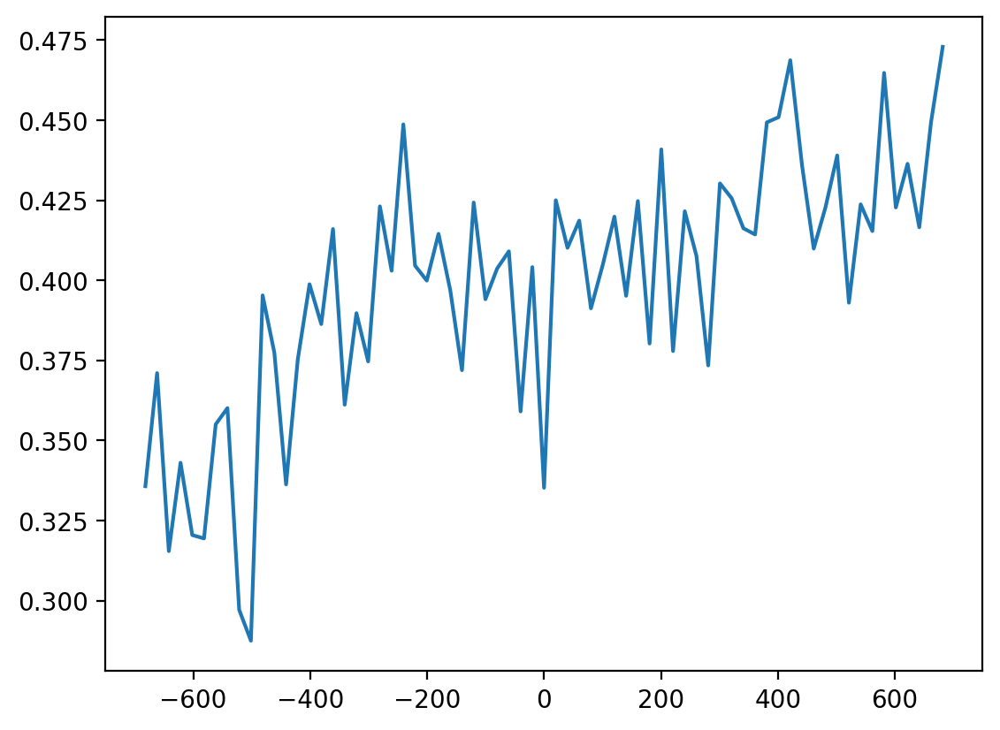

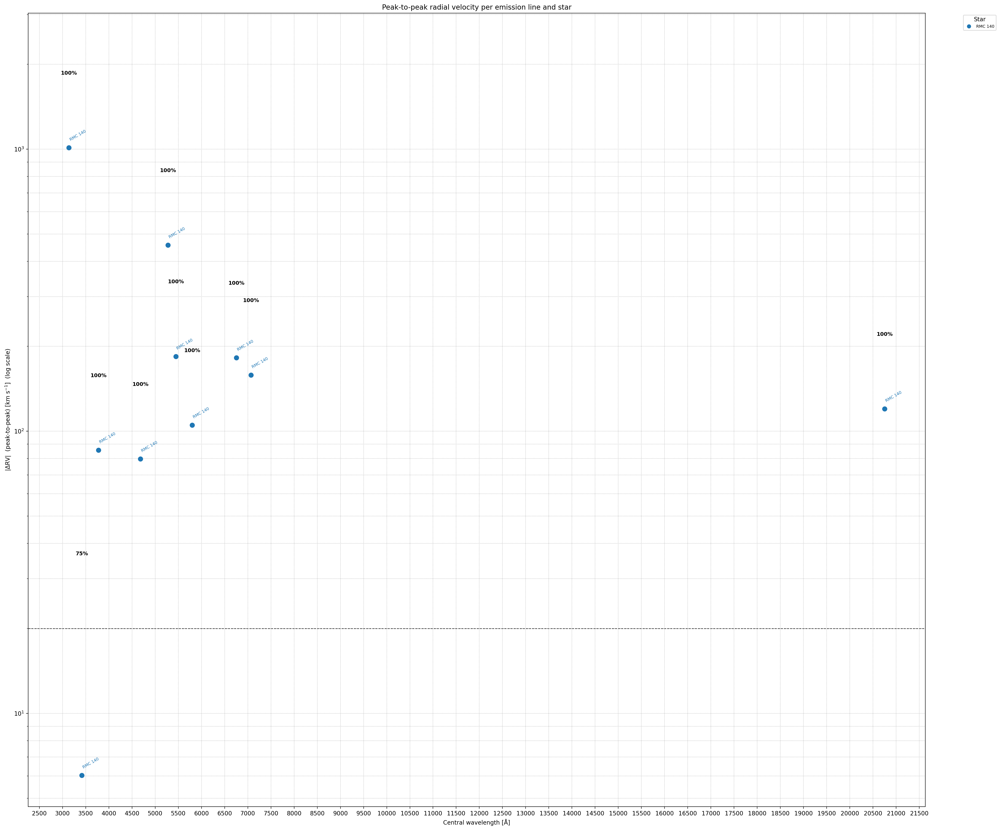

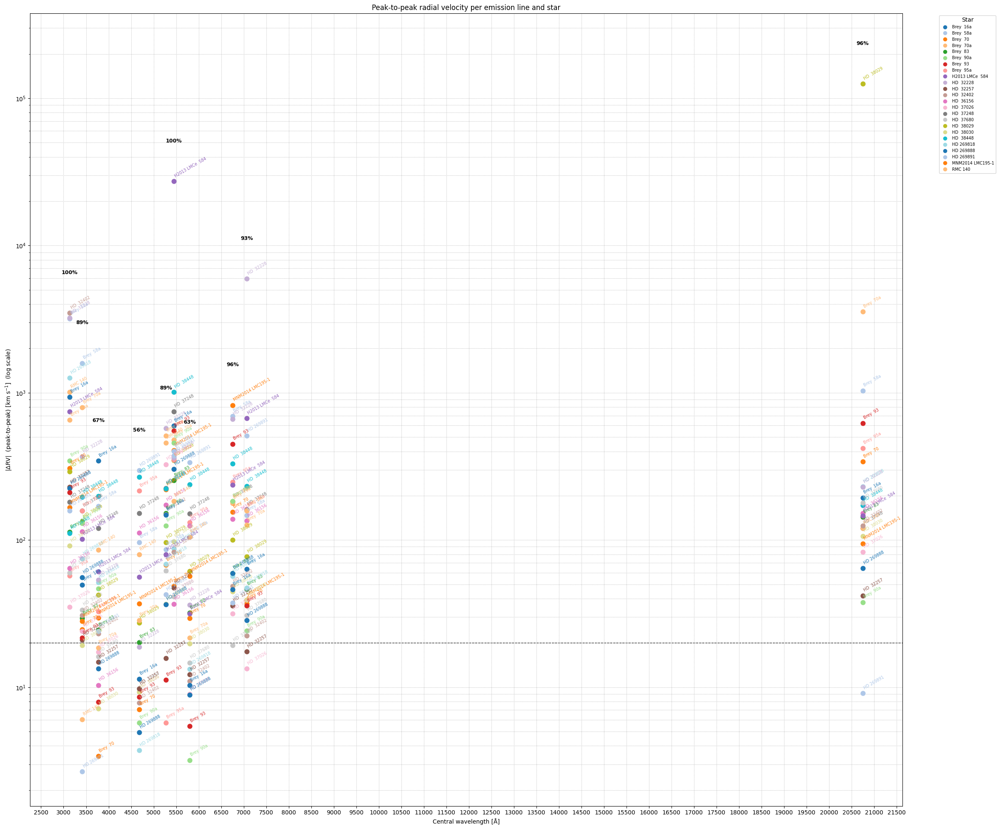

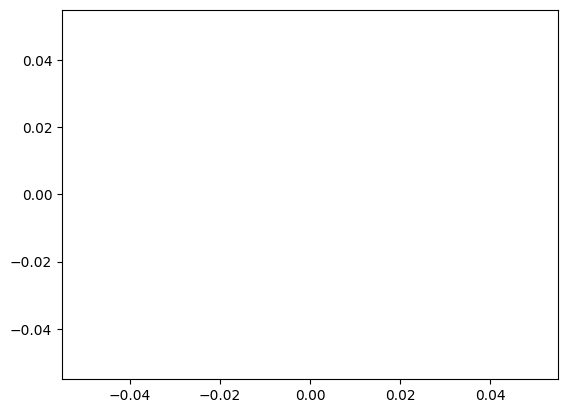

Can't find local maximum in CCF



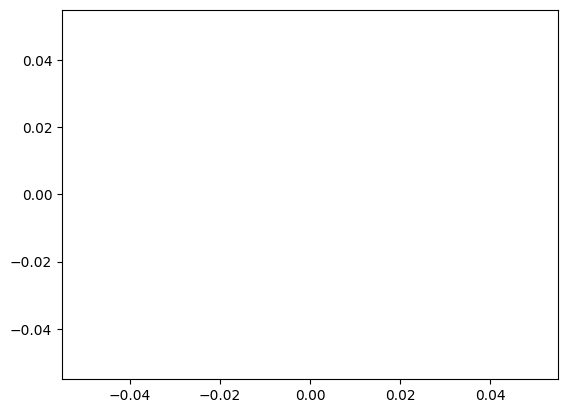

Can't find local maximum in CCF



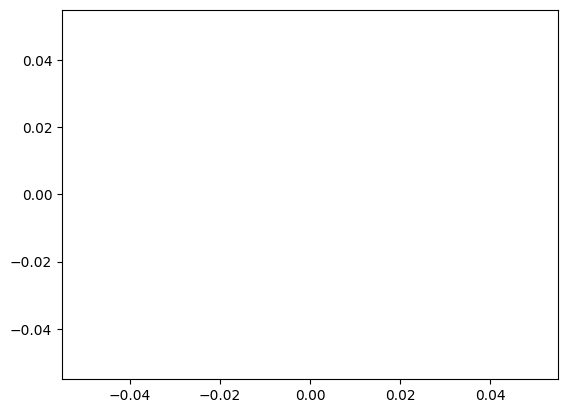

Can't find local maximum in CCF



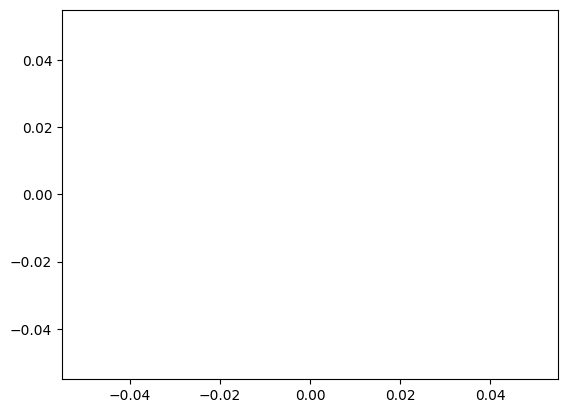

Can't find local maximum in CCF



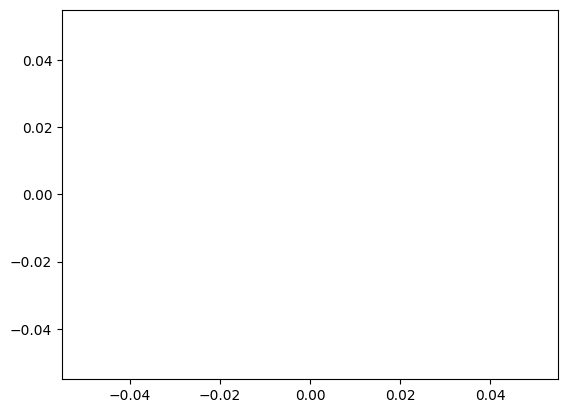

Can't find local maximum in CCF



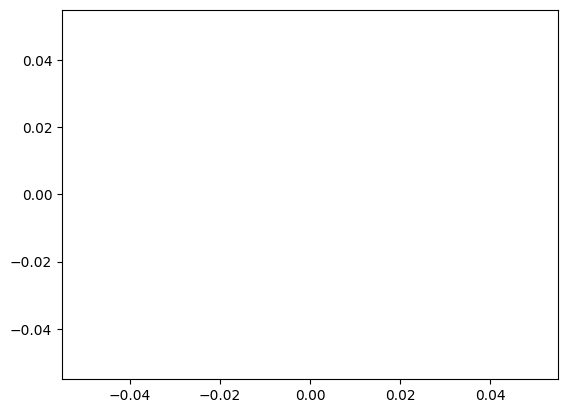

Now calculating coadded template
Check out star unknown‑star, epoch None line 
Check out star unknown‑star, epoch None line 
Check out star unknown‑star, epoch None line 
Check out star unknown‑star, epoch None line 
Check out star unknown‑star, epoch None line 
Check out star unknown‑star, epoch None line 
Finally calculating CCF using coadded template
Can't find local maximum in CCF



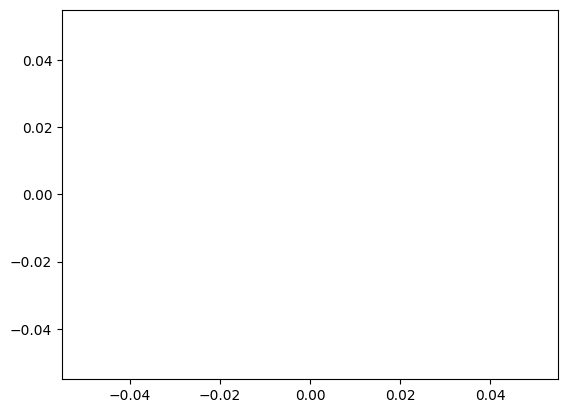

Can't find local maximum in CCF



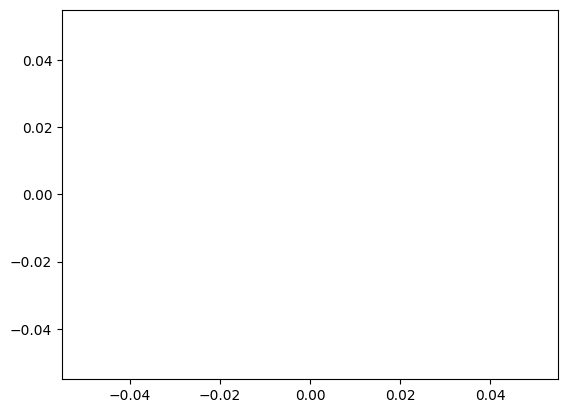

Can't find local maximum in CCF



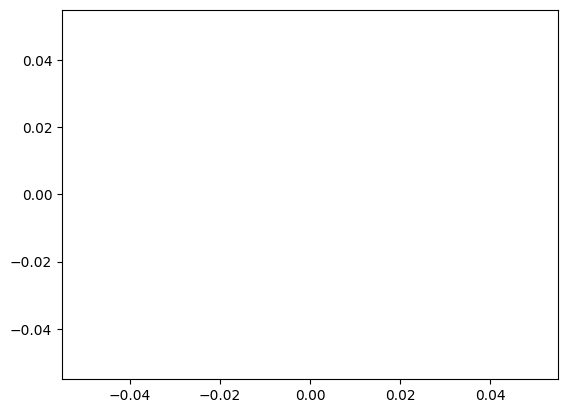

Can't find local maximum in CCF



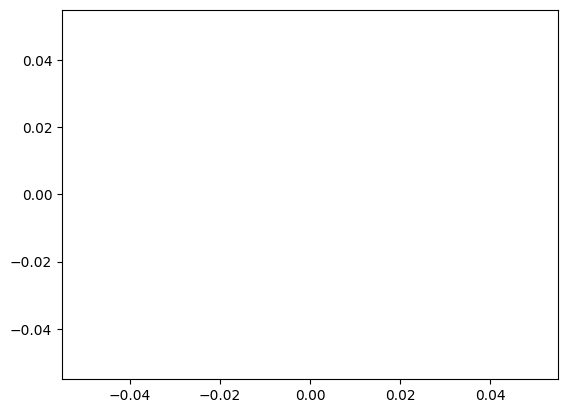

Can't find local maximum in CCF



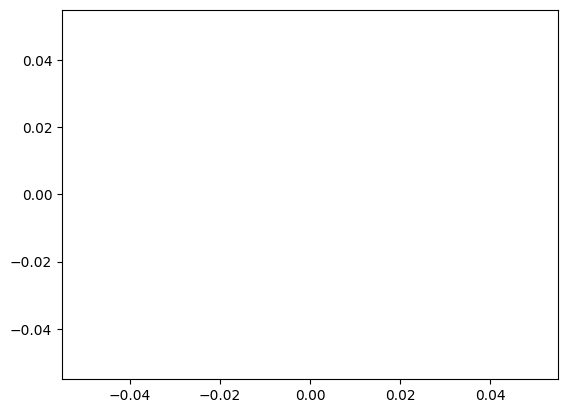

Can't find local maximum in CCF



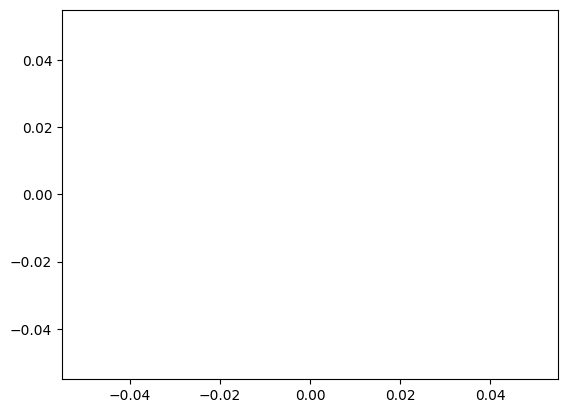

TypeError: '>' not supported between instances of 'NoneType' and 'NoneType'

In [7]:
# JupyterLab cell: compute peak-to-peak RVs for each star & emission line,
# with extra printouts when cleaned/original data are missing

%matplotlib inline

from IPython.display import display

# adjust this import to wherever you’ve defined your CCFclass

# ─── define emission lines & their wavelength windows [Å] ────────────────────
emission_lines = [[[3350.,3500.]],[[4560.,4800.]],[[5700.,6000.]],[[6460.,6650.]],[[7500.,7900.]],[[8100.,8400.]],[[9266.,9475]],[[3115,3230]],[[3645,3730]],[[3788,3863]],[[4415,4520]],[[5246,5326]],[[5380,5535]],[[6960,7155]],[[8800,8915]]]
# emission_lines = {
#     'HeII4686': [4600.0, 4800.0],
#     'Halpha':    [6540.0, 6580.0],
#     # add more lines here if desired
# }

# ─── instantiate your CCF calculator ─────────────────────────────────────────
ccfcalc = CCFclass(intr_kind='cubic')

# ─── loop over stars & lines, run two‐pass CCF, record peak-to-peak of round2 ───
results = []
for star_name in specs.star_names:
    print(f"\nProcessing star: {star_name}")
    star = obs.load_star_instance(star_name)
    for ranges in emission_lines:
        print(ranges)
        lam_min = ranges[0][0]
        lam_max = ranges[0][1]
        print(f"  Emission line: [{lam_min}–{lam_max} Å]")
        # set this line’s cross-correlation window
        ccfcalc.CrossCorRangeA = [[lam_min, lam_max]]

        # gather COMBINED-band spectra for all epochs (cleaned if available)
        obs_list = []
        for ep in star.get_all_epoch_numbers():
            d = star.load_property('cleaned_normalized_flux', ep, 'COMBINED')
            if d is None:
                print(f"    [epoch {ep}] No cleaned_normalized_flux found; trying original normalized_flux...")
                d = star.load_property('normalized_flux', ep, 'COMBINED')
                if d is None:
                    print(f"    [epoch {ep}] No normalized_flux either; skipping this epoch.")
                    continue
                else:
                    print(f"    [epoch {ep}] Loaded original normalized_flux.")
            else:
                print(f"    [epoch {ep}] Loaded cleaned_normalized_flux.")

            wl = np.array(d['wavelengths'])
            fl = np.array(d['normalized_flux'])
            obs_list.append((wl, fl))

        print(f"    → Collected {len(obs_list)} COMBINED spectra for {star_name}")

        if not obs_list:
            print(f"  ▶ No COMBINED spectra for {star_name}, line {lam_min}–{lam_max} Å; moving on.")
            continue

        # use the first spectrum as the initial template
        template_wl, template_fl = obs_list[0]

        # run the two‐pass CCF: returns (round1, round2)
        round1, round2 = ccfcalc.double_ccf(obs_list,
                                            template_wl,
                                            template_fl)

        # extract RVs from the second pass, compute peak-to-peak
        rv_vals = [rv for rv, err in round2]
        p2p     = abs(max(rv_vals) - min(rv_vals))
        print(f"  -> Star {star_name}, {line_name}: peak-to-peak ΔRV = {p2p:.2f} km/s")

        centroid = 0.5 * (lam_min + lam_max)
        results.append([star_name, line_name, centroid, p2p])

# ─── build a DataFrame and display as a pivoted table ────────────────────────
df = pd.DataFrame(results,
                  columns=['Star','Line','Wavelength','ΔRV_peak2peak'])
table = (df.pivot(index='Star', columns='Line', values='ΔRV_peak2peak')
           .style
           .set_caption("Peak-to-Peak ΔRV by Star & Emission Line"))
display(table)

# ─── scatter-plot ΔRV_peak2peak vs. line wavelength ──────────────────────────
plt.figure(figsize=(8,5))
for star in df['Star'].unique():
    sub = df[df['Star']==star]
    plt.scatter(sub['Wavelength'],
                sub['ΔRV_peak2peak'],
                label=star)
# threshold line at 20 km/s
plt.axhline(20, color='gray', linestyle='--', label='20 km/s threshold')
plt.xlabel('Emission-Line Wavelength (Å)')
plt.ylabel('Peak-to-Peak |ΔRV| (km/s)')
plt.title('Peak-to-Peak RV vs. Emission-Line Wavelength')
plt.legend(loc='best', fontsize='small', ncol=2)
plt.grid(True)
plt.tight_layout()
plt.show()


## for NRES

In [12]:
%matplotlib widget
import numpy as np
import matplotlib.pyplot as plt

# Define the two emission line ranges in flipped order:
# (Now, Emission2 (4600–4740 Å) comes first and Emission1 (5740–5920 Å) second)
emission_ranges = {
    "Emission2 (4600-4740 Å)": [[4600, 4740]],
    "Emission1 (5740-5920 Å)": [[5740, 5920]]
}

# Define the two stars
star_names = ['WR 52', 'WR17']
CrossVelo = 700
Fit_Range_in_fraction=0.95

# Dictionary to store per-epoch RV standard deviations for each star and emission range.
# Structure: RVs_results[star_name][emission_label] = {'round1_stds': {epoch:std, ...}, 'round2_stds': {epoch:std, ...}}
RVs_results = {}

# Loop over each star
for star_name in star_names:
    star = obs.load_star_instance(star_name)
    print(f'working on star {star_name}')
    epoch_nums = star.get_all_epoch_numbers()
    RVs_results[star_name] = {}
    
    # Loop over each emission-line range
    for line_tag, cross_range in emission_ranges.items():
        # Create a CCF instance for this emission-line region.
        
        # Build a list of observations (each as a tuple: (wavelength, flux))
        # Also group the observations by epoch to compute per-epoch statistics later.
        obs_list = []
        epoch_obs = {}  # key: epoch number, value: list of observation tuples
        for epoch_num in epoch_nums:
            specta_nums = star.get_all_spectra_in_epoch(epoch_num)
            epoch_obs[epoch_num] = []
            for specta_num in specta_nums:
                CCF_obj = CCFclass(
                    PlotAll=False,
                    CrossVeloMin=-CrossVelo, CrossVeloMax=CrossVelo,
                    Fit_Range_in_fraction=Fit_Range_in_fraction,
                    CrossCorRangeA=[cross_range],
                    star_name=star_name,
                    spectrum = spectrum,
                    epoch=epoch_num,
                    line_tag=line_tag,
                    run_ts=run_ts,
                    nm = False
                )
                clean_norm_data = star.load_property('clean_normalized_flux', epoch_num, specta_num)
                wave_tmp = clean_norm_data['wavelengths']
                flux_tmp = clean_norm_data['normalized_flux']
                obs_list.append((wave_tmp, flux_tmp))
                epoch_obs[epoch_num].append((wave_tmp, flux_tmp))
        
        # Use the first observation as the initial template.
        tpl_wave = obs_list[0][0]
        tpl_flux = obs_list[0][1]
        
        # Run double CCF:
        #  - First iteration uses the initial template (first observation's flux)
        #  - Second iteration uses the coadded spectrum as the new template.
        results_round1, results_round2 = CCF_obj.double_ccf(obs_list=obs_list,
                                                             tpl_wave=tpl_wave,
                                                             tpl_flux=tpl_flux)
        
        # Now, split the results per epoch.
        round1_by_epoch = {}
        round2_by_epoch = {}
        idx = 0
        for epoch_num in epoch_nums:
            n_spec = len(epoch_obs[epoch_num])
            round1_by_epoch[epoch_num] = [results_round1[i][0] for i in range(idx, idx+n_spec)]
            round2_by_epoch[epoch_num] = [results_round2[i][0] for i in range(idx, idx+n_spec)]
            idx += n_spec
        
        # Compute the standard deviation of the RVs per epoch for each iteration.
        stds_round1 = {epoch: np.std(round1_by_epoch[epoch]) for epoch in epoch_nums}
        stds_round2 = {epoch: np.std(round2_by_epoch[epoch]) for epoch in epoch_nums}
        
        # Save the per-epoch standard deviations into the results dictionary.
        RVs_results[star_name][emission_label] = {
            'round1_stds': stds_round1,
            'round2_stds': stds_round2
        }

# ---- PLOTTING ----
# We produce one plot where:
#   - Solid lines represent the first iteration (using the first observation as the template).
#   - Dashed lines represent the second iteration (using the coadded template).
fig, ax = plt.subplots(figsize=(10, 6))

for star_name in star_names:
    for emission_label in emission_ranges.keys():
        epochs = sorted(list(RVs_results[star_name][emission_label]['round1_stds'].keys()))
        stds1 = [RVs_results[star_name][emission_label]['round1_stds'][epoch] for epoch in epochs]
        stds2 = [RVs_results[star_name][emission_label]['round2_stds'][epoch] for epoch in epochs]
        mean1 = np.round(np.mean(stds1),2)
        mean2 = np.round(np.mean(stds2),2)
        print(f'mean for RV STDs is {mean1} km/s')
        print(f'mean for RV STDs is {mean2} km/s')
        
        # Plot first iteration (solid)
        line1, = ax.plot(epochs, stds1, marker='o', linestyle='-', 
                         label=f"{star_name}, {emission_label} (1st)")
        # Plot second iteration (dashed), using the same color as line1.
        ax.plot(epochs, stds2, marker='o', linestyle='--', color=line1.get_color(),
                label=f"{star_name}, {emission_label} (2nd)")

ax.set_title('RV Standard Deviations per Epoch\n(Comparison for Two Stars & Two Emission Lines)')
ax.set_xlabel('Epoch Number')
ax.set_ylabel('RV Standard Deviation [km/s]')
ax.legend()
ax.grid(True)
plt.show()


working on star WR 52


NameError: name 'spectrum' is not defined


=== WR 52 ===
Calculating for first time to get shifts and create the coadded template
Now calculating coadded template
Finally calculating CCF using coadded template
Finished two-pass CCF for Emission2 (4600-4740 Å); regenerating per-spectrum plots...
[saved] plots to ../output/WR_52/CCF/2025-08-17_23-52-37/Emission2 (4600-4740 Å)
Backed up Data/WR 52/epoch1/1/1D/output/RVs.npz -> Backups/overwritten/WR 52/epoch1/1/1D/output/RVs_backup_20250817_235249.npz
Saved property to Data/WR 52/epoch1/1/1D/output/RVs.npz
[saved] plots to ../output/WR_52/CCF/2025-08-17_23-52-37/Emission2 (4600-4740 Å)
Backed up Data/WR 52/epoch1/2/1D/output/RVs.npz -> Backups/overwritten/WR 52/epoch1/2/1D/output/RVs_backup_20250817_235250.npz
Saved property to Data/WR 52/epoch1/2/1D/output/RVs.npz
[saved] plots to ../output/WR_52/CCF/2025-08-17_23-52-37/Emission2 (4600-4740 Å)
Backed up Data/WR 52/epoch1/3/1D/output/RVs.npz -> Backups/overwritten/WR 52/epoch1/3/1D/output/RVs_backup_20250817_235250.npz
Saved prop

/Users/guyshtainer/Library/CloudStorage/OneDrive-Tel-AvivUniversity/תואר שני!/Thesis/Thesis-codes/CCF.py:105: RuntimeWarning: invalid value encountered in sqrt
  sigma = np.sqrt(-1. / (N * 2 * a * CCFAtMax / (1 - CCFAtMax ** 2)))
/Users/guyshtainer/Library/CloudStorage/OneDrive-Tel-AvivUniversity/תואר שני!/Thesis/Thesis-codes/CCF.py:200: RuntimeWarning: invalid value encountered in sqrt
  return np.array([vmax, np.sqrt(-1./(N * CFFdvdvAtMax *


Now calculating coadded template
Finally calculating CCF using coadded template
Can't find local maximum in CCF



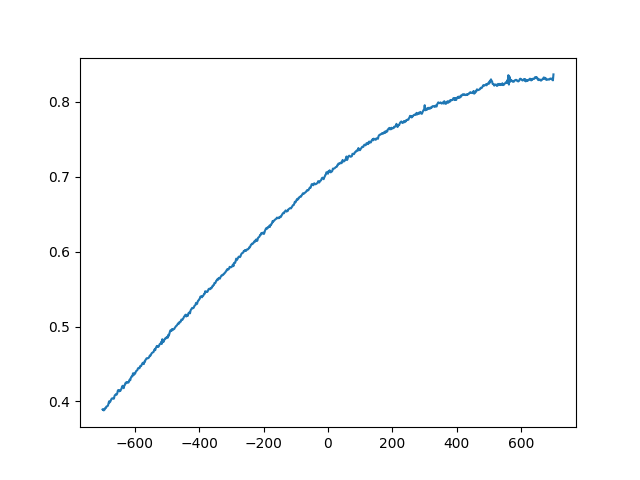

/Users/guyshtainer/Library/CloudStorage/OneDrive-Tel-AvivUniversity/תואר שני!/Thesis/Thesis-codes/CCF.py:105: RuntimeWarning: divide by zero encountered in scalar divide
  sigma = np.sqrt(-1. / (N * 2 * a * CCFAtMax / (1 - CCFAtMax ** 2)))
/Users/guyshtainer/Library/CloudStorage/OneDrive-Tel-AvivUniversity/תואר שני!/Thesis/Thesis-codes/CCF.py:200: RuntimeWarning: divide by zero encountered in scalar divide
  return np.array([vmax, np.sqrt(-1./(N * CFFdvdvAtMax *


Finished two-pass CCF for Emission2 (4600-4740 Å); regenerating per-spectrum plots...
[saved] plots to ../output/WR17/CCF/2025-08-17_23-52-37/Emission2 (4600-4740 Å)
Backed up Data/WR17/epoch1/1/1D/output/RVs.npz -> Backups/overwritten/WR17/epoch1/1/1D/output/RVs_backup_20250817_235355.npz
Saved property to Data/WR17/epoch1/1/1D/output/RVs.npz
Can't find local maximum in CCF



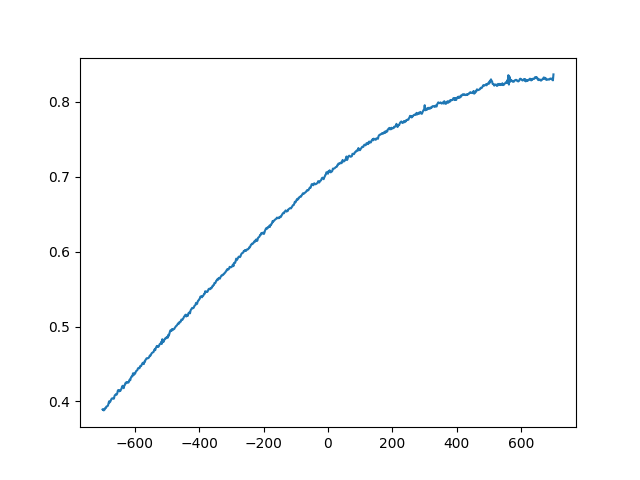

TypeError: float() argument must be a string or a real number, not 'NoneType'

In [13]:
# %matplotlib widget
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
from scipy.interpolate import interp1d

# -------------------- CONFIG --------------------
star_names = ['WR 52', 'WR17']  # adjust as needed
# Emission windows in Å. Accepts either [λmin,λmax] or [[λmin,λmax]]
emission_ranges = {
    "Emission2 (4600-4740 Å)": [4600.0, 4740.0],
    "Emission1 (5740-5920 Å)": [5740.0, 5920.0],
}
CrossVelo = 700
Fit_Range_in_fraction = 0.95
run_ts = datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
c_kms = 299792.458

# Optional skips per star/epoch/spectrum
skip_epochs = {}        # e.g., {'WR 52': [2]}
skip_spectra = {}       # e.g., {'WR 52': {3: [1,4]}}

# -------------------- MAIN ----------------------
for star_name in star_names:
    print(f"\n=== {star_name} ===")
    star = obs.load_star_instance(star_name, to_print=False)

    # ---------- gather all (epoch, spectrum) ----------
    obs_meta = []   # [(epoch, spectrum)]
    raw_list = []   # [(wave_A, flux)]
    for ep in star.get_all_epoch_numbers():
        if star_name in skip_epochs and ep in skip_epochs[star_name]:
            continue
        spectra_nums = star.get_all_spectra_in_epoch(ep)
        for sp in spectra_nums:
            if star_name in skip_spectra and ep in skip_spectra[star_name]:
                if sp in skip_spectra[star_name][ep]:
                    continue

            d = (star.load_property('clean_normalized_flux', ep, sp)
                 or star.load_property('normalized_flux',    ep, sp)
                 or star.load_property('cleaned_normalized_flux', ep, sp))
            if d is None:
                continue

            wA = np.asarray(d['wavelengths'], dtype=float)   # Å for NRES
            f  = np.asarray(d['normalized_flux'], dtype=float)
            s  = np.argsort(wA)
            wA = wA[s]; f = f[s]

            # Barycentric hook if you have it (km/s) — set to 0 otherwise.
            bary = 0.0
            wA = wA * (1.0 + bary / c_kms)

            obs_meta.append((ep, sp))
            raw_list.append((wA, f))

    if not raw_list:
        print("No observations found; skipping star.")
        continue

    # ---------- initial template = first usable spectrum ----------
    tpl_wave = raw_list[0][0]
    tpl_flux = raw_list[0][1]

    # common wavelength grid for all spectra (match X-Shooter style)
    common_wavegrid = tpl_wave

    # regrid all spectra to the template grid
    obs_data = []   # [(ep, sp, wave_common, flux_interp)]
    for (wA, f), (ep, sp) in zip(raw_list, obs_meta):
        interp_flux = interp1d(wA, f, kind='cubic', bounds_error=False, fill_value=1.0)(common_wavegrid)
        obs_data.append((ep, sp, common_wavegrid, interp_flux))

    # ===============================================================
    # loop over emission-line windows: two-pass CCF, then plots only
    # ===============================================================
    for line_tag, rng in emission_ranges.items():
        # Ensure CrossCorRangeA has shape (n_ranges, 2)
        if isinstance(rng[0], (list, tuple, np.ndarray)):
            CrossCorRangeA = rng
        else:
            CrossCorRangeA = [rng]

        # -- run TWO-PASS RV once (silent) -----------------------------
        CCF_base = CCFclass(
            PlotAll=False,
            CrossVeloMin=-CrossVelo, CrossVeloMax=CrossVelo,
            Fit_Range_in_fraction=Fit_Range_in_fraction,
            CrossCorRangeA=CrossCorRangeA,
            star_name=star_name,
            epoch=obs_meta[0][0],        # bookkeeping
            spectrum=obs_meta[0][1],     # bookkeeping
            line_tag=line_tag,
            run_ts=run_ts,
            nm=False                      # Å mode for NRES
        )
        r1, r2, (co_wave, co_flux) = CCF_base.double_ccf(
            [(w, f) for _, _, w, f in obs_data],
            tpl_wave, tpl_flux,
            return_coadd=True
        )
        print(f"Finished two-pass CCF for {line_tag}; regenerating per-spectrum plots...")

        # -- per-spectrum plotting ONLY; save RVs per (epoch,spectrum) ----
        for ((ep, sp, w, f), (RV_val, RV_err)) in zip(obs_data, r2):
            CCF_plot = CCFclass(
                PlotAll=False,                  # produce figures (saved below)
                CrossVeloMin=-CrossVelo, CrossVeloMax=CrossVelo,
                Fit_Range_in_fraction=Fit_Range_in_fraction,
                CrossCorRangeA=CrossCorRangeA,
                star_name=star_name,
                epoch=ep,
                spectrum=sp,                    # ← include spectrum number in titles/files
                line_tag=line_tag,
                savePlot=True,                  # ← save plots
                run_ts=run_ts,
                nm=False
            )
            # compute_RV is called ONLY to generate plots; numbers come from r2
            _ = CCF_plot.compute_RV(w, f, co_wave, co_flux)

            # save RVs at (epoch, spectrum), no band in NRES
            entry = {'full_RV': float(RV_val), 'full_RV_err': float(RV_err)}
            RVs = star.load_property('RVs', ep, sp) or {}
            RVs[line_tag] = entry
            star.save_property('RVs', RVs, ep, sp, overwrite=True)

        print(f"Saved RVs & plots for {star_name} — {line_tag}")


In [14]:
# %matplotlib widget
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
from scipy.interpolate import interp1d

# ---- config ----
star_names = ['WR 52', 'WR17']   # edit as needed
emission_lines = {
    "He II (4600-4740 Å)": [4610.0, 4700.0],
    "C IV (5740-5920 Å)": [5740.0, 5920.0],
}
CrossVelo = 700
Fit_Range_in_fraction = 0.95
run_ts = datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
c_kms = 299792.458

# optionally skip specific (epoch, spectrum) pairs
skip_map = {
    # 'WR 52': {2: [1, 3]},   # example: skip spectra 1 and 3 in epoch 2
    # 'WR17' : {1: 'ALL'},    # example: skip entire epoch 1
}

for star_name in star_names[1:]:
    print(f"\n=== {star_name} ===")
    star = obs.load_star_instance(star_name, to_print=False)
    epoch_nums = star.get_all_epoch_numbers()

    # ---------- gather all observations (epoch,spectrum) ----------
    # Build a flat list of observations and remember their meta so we can save back per spectrum.
    obs_list = []          # [(wave_A, flux)]
    obs_meta = []          # [(epoch, spectrum)]
    for epoch_num in epoch_nums:
        spectra_nums = star.get_all_spectra_in_epoch(epoch_num)
        for spectrum_num in spectra_nums:
            # respect skips
            # if star_name in skip_map:
            #     sk = skip_map[star_name]
            #     if epoch_num in sk and (sk[epoch_num] == 'ALL' or spectrum_num in sk[epoch_num]):
            #         continue

            # NRES data are keyed by (epoch, spectrum, data_type) — no bands
            d = (star.load_property('clean_normalized_flux', epoch_num, spectrum_num)
                 or star.load_property('normalized_flux',    epoch_num, spectrum_num)
                 or star.load_property('cleaned_normalized_flux', epoch_num, spectrum_num))
            if d is None:
                continue

            wave_A = np.asarray(d['wavelengths'], dtype=float)    # assumed Å already for NRES
            flux   = np.asarray(d['normalized_flux'], dtype=float)

            # sort just in case
            s = np.argsort(wave_A)
            wave_A = wave_A[s]
            flux   = flux[s]

            # (hook for barycentric correction if you have it in headers)
            # fits = star.load_observation(epoch_num, spectrum=spectrum_num)
            # bary = fits.header.get('BARYCOR', 0.0)  # km/s
            bary = 0.0
            wave_A = wave_A * (1.0 + bary / c_kms)

            obs_list.append((wave_A, flux))
            obs_meta.append((epoch_num, spectrum_num))

    if not obs_list:
        print("No observations found; skipping star.")
        continue

    # ---------- template & common grid ----------
    template_wave = obs_list[0][0]
    template_flux = obs_list[0][1]
    common_wavegrid = template_wave

    # Regrid all spectra to the template grid
    obs_data = []  # [(epoch, spectrum, wave_common, flux_interp)]
    for (wave_A, flux), (epoch_num, spectrum_num) in zip(obs_list, obs_meta):
        interp_flux = interp1d(wave_A, flux, kind='cubic', bounds_error=False, fill_value=1.0)(common_wavegrid)
        obs_data.append((epoch_num, spectrum_num, common_wavegrid, interp_flux))

    # ==================================================================
    # loop over emission-line windows
    # ==================================================================
    for line_tag, rng in emission_lines.items():
        # -- run TWO-PASS CCF once (silent) --
        CCF_base = CCFclass(
            PlotAll=False,
            CrossVeloMin=-CrossVelo, CrossVeloMax=CrossVelo,
            Fit_Range_in_fraction=Fit_Range_in_fraction,
            CrossCorRangeA=[rng],
            star_name=star_name,
            epoch=obs_meta[0][0],   # bookkeeping only
            line_tag=line_tag,
            run_ts=run_ts,
            nm=False               # Å mode
        )

        r1, r2, (co_wave, co_flux) = CCF_base.double_ccf(
            [(w, f) for _, _, w, f in obs_data],
            template_wave, template_flux,
            return_coadd=True
        )
        print(f'Ended real calculation for {line_tag}, now runs again for plots')

        # -- per-spectrum plotting + save RVs (keyed by epoch & spectrum) --
        for ((epoch_num, spectrum_num, w, f), (RV_val, RV_err)) in zip(obs_data, r2):
            CCF_plot = CCFclass(
                PlotAll=False,                  # figures saved inside if savePlot=True
                CrossVeloMin=-CrossVelo, CrossVeloMax=CrossVelo,
                Fit_Range_in_fraction=Fit_Range_in_fraction,
                CrossCorRangeA=[rng],
                star_name=star_name,
                epoch=epoch_num,
                spectrum=spectrum_num,
                line_tag=line_tag,
                savePlot=True,
                run_ts=run_ts,
                nm=False
            )
            _ = CCF_plot.compute_RV(w, f, co_wave, co_flux)

            entry = {'full_RV': float(RV_val), 'full_RV_err': float(RV_err)}
            RVs = star.load_property('RVs', epoch_num, spectrum_num) or {}
            RVs[line_tag] = entry
            # save with (epoch, spectrum) — no band
            star.save_property('RVs', RVs, epoch_num, spectrum_num, overwrite=True)

        print(f"Done {star_name} — {line_tag}")

print("\nAll requested NRES RVs recomputed and saved under 'RVs' per (epoch, spectrum).")



=== WR17 ===
Calculating for first time to get shifts and create the coadded template
Now calculating coadded template
Finally calculating CCF using coadded template
Ended real calculation for He II (4600-4740 Å), now runs again for plots
[saved] plots to ../output/WR17/CCF/2025-08-18_00-35-42/He II (4600-4740 Å)
Backed up Data/WR17/epoch1/1/1D/output/RVs.npz -> Backups/overwritten/WR17/epoch1/1/1D/output/RVs_backup_20250818_003552.npz
Saved property to Data/WR17/epoch1/1/1D/output/RVs.npz
[saved] plots to ../output/WR17/CCF/2025-08-18_00-35-42/He II (4600-4740 Å)
Saved property to Data/WR17/epoch1/2/1D/output/RVs.npz
[saved] plots to ../output/WR17/CCF/2025-08-18_00-35-42/He II (4600-4740 Å)
Saved property to Data/WR17/epoch1/3/1D/output/RVs.npz
[saved] plots to ../output/WR17/CCF/2025-08-18_00-35-42/He II (4600-4740 Å)
Saved property to Data/WR17/epoch1/4/1D/output/RVs.npz
[saved] plots to ../output/WR17/CCF/2025-08-18_00-35-42/He II (4600-4740 Å)
Saved property to Data/WR17/epoch1/

In [15]:
# -----------------------------------------------
# 1) Gather RVs stored per (epoch, spectrum) and aggregate per epoch
# -----------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from datetime import datetime
import re

# reuse prior run_ts if it exists; otherwise create one
try:
    run_ts
except NameError:
    run_ts = datetime.now().strftime("%Y-%m-%d_%H-%M-%S")

for star_name in star_names:
    star = obs.load_star_instance(star_name)

    for line_tag in emission_lines:
        epochs, rv_means, rv_errs = [], [], []

        for ep in star.get_all_epoch_numbers():
            # if star_name in skip_epochs and ep in skip_epochs[star_name]:
            #     continue

            # collect all spectra for this epoch
            spectra_nums = star.get_all_spectra_in_epoch(ep)

            # gather RVs for this line_tag across spectra in this epoch
            per_spec_rv = []
            per_spec_err = []
            for sp in spectra_nums:
                RVs = star.load_property('RVs', ep, sp)
                if not RVs:
                    continue
                raw = RVs.get(line_tag)
                if raw is None:
                    continue
                try:
                    entry = raw.item()  # sometimes stored as 0-d np.object
                except Exception:
                    entry = raw

                try:
                    rv_val = float(entry.get('full_RV'))
                except Exception:
                    continue
                try:
                    rv_err = float(entry.get('full_RV_err'))
                except Exception:
                    rv_err = np.nan

                per_spec_rv.append(rv_val)
                per_spec_err.append(rv_err)

            # if no spectra had RVs for this epoch -> skip it
            if not per_spec_rv:
                continue

            per_spec_rv = np.asarray(per_spec_rv, dtype=float)
            per_spec_err = np.asarray(per_spec_err, dtype=float)

            # aggregate to one RV per epoch:
            #  - if we have finite errors, use inverse-variance weighted mean
            #  - else fall back to simple mean; use sample std as error
            finite_err = np.isfinite(per_spec_err) & (per_spec_err > 0)
            if finite_err.any():
                w = 1.0 / per_spec_err[finite_err]**2
                rv_mean = np.sum(w * per_spec_rv[finite_err]) / np.sum(w)
                rv_err  = np.sqrt(1.0 / np.sum(w))
                # optional: if there's visible scatter beyond formal errs,
                # you could inflate rv_err using sample std; keeping it clean here.
            else:
                rv_mean = np.mean(per_spec_rv)
                rv_err  = np.std(per_spec_rv) if per_spec_rv.size > 1 else np.nan

            epochs.append(ep)
            rv_means.append(rv_mean)
            rv_errs.append(rv_err)

        # nothing to plot?  →  skip and move on
        if not epochs:
            print(f"{star_name} – {line_tag}: no stored RVs, skipping plot")
            continue

        # keep epochs ascending
        order    = np.argsort(epochs)
        epochs   = np.array(epochs)[order]
        rv_means = np.array(rv_means)[order]
        rv_errs  = np.array(rv_errs,  dtype=float)[order]

        # -----------------------------------------------
        # 2) Make the plot
        # -----------------------------------------------
        fig, ax = plt.subplots(figsize=(8, 5))

        valid_mask = np.isfinite(rv_errs)
        invalid_mask = ~valid_mask

        # valid errorbars (black)
        if valid_mask.any():
            ax.errorbar(epochs[valid_mask], rv_means[valid_mask], yerr=rv_errs[valid_mask],
                        marker='o', linestyle='None', capsize=4, color='black',
                        label='Epoch RV (weighted mean)')
        # points without errors (red)
        if invalid_mask.any():
            ax.scatter(epochs[invalid_mask], rv_means[invalid_mask],
                       marker='o', color='red', label='Epoch RV (no error)')

        ax.set_xlabel('Epoch number')
        ax.set_ylabel('Radial velocity  [km s$^{-1}$]')
        ax.set_title(f'{star_name} – {line_tag}')
        ax.grid(True)
        ax.legend(loc='best')

        # -----------------------------------------------
        # 3) Save into ..\output\<star>\CCF\<run_ts>\<line_tag>\RVs.png
        #    (non-destructive: never delete existing files)
        # -----------------------------------------------
        clean_star = re.sub(r"[^A-Za-z0-9_-]", "_", star_name)
        out_dir = Path('..') / 'output' / clean_star / 'CCF' / run_ts / line_tag
        out_dir.mkdir(parents=True, exist_ok=True)
        dest = out_dir / 'RVs.png'
        fig.savefig(dest, dpi=300, bbox_inches='tight')
        plt.close(fig)

        print(f"{star_name} – {line_tag}: summary plot written to {dest}")


WR 52 – He II (4600-4740 Å): summary plot written to ../output/WR_52/CCF/2025-08-18_00-35-42/He II (4600-4740 Å)/RVs.png
WR 52 – C IV (5740-5920 Å): summary plot written to ../output/WR_52/CCF/2025-08-18_00-35-42/C IV (5740-5920 Å)/RVs.png
WR17 – He II (4600-4740 Å): summary plot written to ../output/WR17/CCF/2025-08-18_00-35-42/He II (4600-4740 Å)/RVs.png
WR17 – C IV (5740-5920 Å): summary plot written to ../output/WR17/CCF/2025-08-18_00-35-42/C IV (5740-5920 Å)/RVs.png


# Simulations

## using LMC WC4 14-10 template from POwR to simulate SB1 and calc minimum SNR needed for 3km/s certainty for each emssion line

In [6]:
S2Ns = [1,2,3,4,5,7,10,12,14,17,20,30,40,50,100,120,150]
emission_lines = [[[3350.,3500.]],[[4560.,4800.]],[[5700.,6000.]],[[6460.,6650.]],[[7500.,7900.]],[[8100.,8400.]],[[9266.,9475]],[[3115,3230]],[[3645,3730]],[[3788,3863]],[[4415,4520]],[[5246,5326]],[[5380,5535]],[[6960,7155]],[[8800,8915]]]

In [9]:
import multiprocess as mp
import numpy as np
# from your_simulation_module import sc  # Replace with your actual import

def process_pair(params):
    """
    Process a single pair of S2N and CrossCorRangeA.
    """
    S2N, CrossCorRangeA = params
    sim = sc(S2N=S2N, lamB=3100., lamR=9990.)
    sim.run_simulation(overwrite=False)

    temp_path = 'Data/LMC WC Temaplates/lmc-wc_14-10_line.txt'
    template_wave, template_flux = sim.load_two_column_file(temp_path)

    file_name = f'CCRA_{CrossCorRangeA}_RVs'
    try:
        results = sim.load_property(file_name)
    except:
        results = np.array(sim.run_CCF(template_wave, template_flux, CrossCorRangeA=CrossCorRangeA), dtype='float')
        sim.save_property(file_name,results)
    sigma = np.std(results[:, 0])
    return CrossCorRangeA, np.array([S2N, sigma])

def run_multiprocessing(S2Ns, emission_lines):
    # Create pairs of S2Ns and CrossCorRangeA
    params = [(S2N, line) for line in emission_lines for S2N in S2Ns]
    
    # Initialize multiprocessing pool
    with mp.Pool(processes=mp.cpu_count()) as pool:
        results = pool.map(process_pair, params)
    
    # Organize results into the desired format
    total_results = {}
    for line in emission_lines:
        total_results[str(line)] = [result[1] for result in results if result[0] == line]
    
    return total_results

# Running the multiprocessing code in Jupyter
if __name__ == "__main__":
    # S2Ns = [10, 20, 50, 100]  # Example S2N values
    # emission_lines = ['line1', 'line2', 'line3']  # Replace with actual lines
    
    # Run multiprocessing and collect results
    total_results = run_multiprocessing(S2Ns, emission_lines)
    print(total_results)


[INFO] Simulation files already exist in 'simulations/SNR50'. Set overwrite=True to rerun the simulation.[INFO] Simulation files already exist in 'simulations/SNR1'. Set overwrite=True to rerun the simulation.[INFO] Simulation files already exist in 'simulations/SNR40'. Set overwrite=True to rerun the simulation.[INFO] Simulation files already exist in 'simulations/SNR12'. Set overwrite=True to rerun the simulation.[INFO] Simulation files already exist in 'simulations/SNR10'. Set overwrite=True to rerun the simulation.[INFO] Simulation files already exist in 'simulations/SNR14'. Set overwrite=True to rerun the simulation.[INFO] Simulation files already exist in 'simulations/SNR2'. Set overwrite=True to rerun the simulation.[INFO] Simulation files already exist in 'simulations/SNR3'. Set overwrite=True to rerun the simulation.[INFO] Simulation files already exist in 'simulations/SNR4'. Set overwrite=True to rerun the simulation.[INFO] Simulation files already exist in 'simulations/SNR12

/Users/guyshtainer/Library/CloudStorage/OneDrive-Tel-AvivUniversity/תואר שני!/Thesis/Thesis-codes/CCF.py:87: RuntimeWarning: divide by zero encountered in scalar divide
  RV_error = np.sqrt(-1. / (N * CFFdvdvAtMax * CCFAtMax / (1 - CCFAtMax**2)))
/Users/guyshtainer/Library/CloudStorage/OneDrive-Tel-AvivUniversity/תואר שני!/Thesis/Thesis-codes/CCF.py:87: RuntimeWarning: divide by zero encountered in scalar divide
  RV_error = np.sqrt(-1. / (N * CFFdvdvAtMax * CCFAtMax / (1 - CCFAtMax**2)))
/Users/guyshtainer/Library/CloudStorage/OneDrive-Tel-AvivUniversity/תואר שני!/Thesis/Thesis-codes/CCF.py:87: RuntimeWarning: divide by zero encountered in scalar divide
  RV_error = np.sqrt(-1. / (N * CFFdvdvAtMax * CCFAtMax / (1 - CCFAtMax**2)))
/Users/guyshtainer/Library/CloudStorage/OneDrive-Tel-AvivUniversity/תואר שני!/Thesis/Thesis-codes/CCF.py:87: RuntimeWarning: divide by zero encountered in scalar divide
  RV_error = np.sqrt(-1. / (N * CFFdvdvAtMax * CCFAtMax / (1 - CCFAtMax**2)))
/Users/guysh

Property saved at simulations/SNR120/output/CCRA_[[5700.0, 6000.0]]_RVs.npz
[INFO] Simulation files already exist in 'simulations/SNR150'. Set overwrite=True to rerun the simulation.
Property saved at simulations/SNR120/output/CCRA_[[4560.0, 4800.0]]_RVs.npz
[INFO] Simulation files already exist in 'simulations/SNR150'. Set overwrite=True to rerun the simulation.
Property saved at simulations/SNR120/output/CCRA_[[3350.0, 3500.0]]_RVs.npz
[INFO] Simulation files already exist in 'simulations/SNR150'. Set overwrite=True to rerun the simulation.
Property saved at simulations/SNR120/output/CCRA_[[7500.0, 7900.0]]_RVs.npz
[INFO] Simulation files already exist in 'simulations/SNR1'. Set overwrite=True to rerun the simulation.
[INFO] Simulation files already exist in 'simulations/SNR2'. Set overwrite=True to rerun the simulation.
[INFO] Simulation files already exist in 'simulations/SNR3'. Set overwrite=True to rerun the simulation.
[INFO] Simulation files already exist in 'simulations/SNR4'.

/Users/guyshtainer/Library/CloudStorage/OneDrive-Tel-AvivUniversity/תואר שני!/Thesis/Thesis-codes/CCF.py:87: RuntimeWarning: divide by zero encountered in scalar divide
  RV_error = np.sqrt(-1. / (N * CFFdvdvAtMax * CCFAtMax / (1 - CCFAtMax**2)))
/Users/guyshtainer/Library/CloudStorage/OneDrive-Tel-AvivUniversity/תואר שני!/Thesis/Thesis-codes/CCF.py:87: RuntimeWarning: divide by zero encountered in scalar divide
  RV_error = np.sqrt(-1. / (N * CFFdvdvAtMax * CCFAtMax / (1 - CCFAtMax**2)))


Property saved at simulations/SNR120/output/CCRA_[[3788, 3863]]_RVs.npz
[INFO] Simulation files already exist in 'simulations/SNR150'. Set overwrite=True to rerun the simulation.
Property saved at simulations/SNR120/output/CCRA_[[5246, 5326]]_RVs.npz
[INFO] Simulation files already exist in 'simulations/SNR150'. Set overwrite=True to rerun the simulation.
Property saved at simulations/SNR150/output/CCRA_[[5700.0, 6000.0]]_RVs.npz
[INFO] Simulation files already exist in 'simulations/SNR1'. Set overwrite=True to rerun the simulation.
[INFO] Simulation files already exist in 'simulations/SNR2'. Set overwrite=True to rerun the simulation.
[INFO] Simulation files already exist in 'simulations/SNR3'. Set overwrite=True to rerun the simulation.
Property saved at simulations/SNR150/output/CCRA_[[4560.0, 4800.0]]_RVs.npz
[INFO] Simulation files already exist in 'simulations/SNR1'. Set overwrite=True to rerun the simulation.
[INFO] Simulation files already exist in 'simulations/SNR2'. Set overw

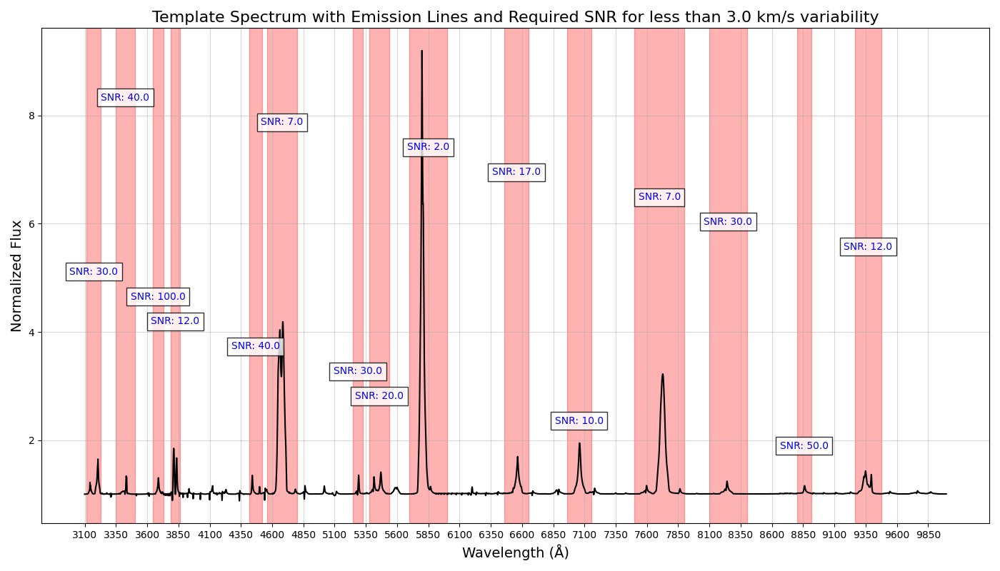

In [12]:
%matplotlib widget
import matplotlib.pyplot as plt
import numpy as np
import re

def plot_template_with_snr_improved(template_wave, template_flux, total_results, threshold=3.0):
    """
    Plots the template spectrum, highlights each emission line, and annotates the required SNR
    for each line to achieve less than the given threshold in RV variation.

    Parameters:
        template_wave (array): Wavelength array of the template.
        template_flux (array): Flux array of the template.
        total_results (dict): Dictionary containing results for each emission line.
                              Keys are emission line ranges (e.g., 'start-end'),
                              values are lists of [S2N, sigma] pairs.
        threshold (float): The threshold for RV variation in km/s. Defaults to 3.0.
    """
    plt.figure(figsize=(14, 8))

    # Plot the template spectrum
    plt.plot(template_wave, template_flux, color='black', linewidth=1.5)

    # Keep track of y-coordinates to avoid overlap
    used_positions = []

    # Iterate through each emission line and annotate the required SNR
    for emission_line, results in total_results.items():
        # Convert results to NumPy array for easier manipulation
        results_array = np.array(results)
        S2Ns, sigmas = results_array[:, 0], results_array[:, 1]

        # Find the minimum SNR where the sigma is below the threshold
        valid_indices = np.where(sigmas < threshold)[0]
        if valid_indices.size > 0:
            required_snr = S2Ns[valid_indices[0]]
        else:
            required_snr = "N/A"

        # Highlight the emission line
        emission_start, emission_end = map(float, re.findall(r"[-+]?\d*\.\d+|\d+", emission_line))
        plt.axvspan(emission_start, emission_end, color='red', alpha=0.3)
        mid_point = (emission_start + emission_end) / 2

        # Determine y-coordinate for the text box
        y_position = max(template_flux) * 0.9
        while y_position in used_positions:
            y_position -= max(template_flux) * 0.05  # Adjust to avoid overlap
        used_positions.append(y_position)

        # Annotate the SNR
        plt.text(mid_point, y_position, f"SNR: {required_snr}", 
                 color='blue', fontsize=10, ha='center', bbox=dict(facecolor='white', alpha=0.8))

    # Add title, labels, and grid
    plt.title(f"Template Spectrum with Emission Lines and Required SNR for less than {threshold} km/s variability", fontsize=16)
    plt.xlabel("Wavelength (Å)", fontsize=14)
    plt.ylabel("Normalized Flux", fontsize=14)
    
    # Improve X-axis resolution
    plt.xticks(np.arange(min(template_wave)+1, max(template_wave), 250))  # 20 ticks for better resolution
    plt.grid(alpha=0.5)
    plt.tight_layout()

    # Show the plot
    plt.show()

# Example usage
# Replace these with your actual data
sim = sc()
temp_path = 'Data/LMC WC Temaplates/lmc-wc_14-10_line.txt'
template_wave, template_flux = sim.load_two_column_file(temp_path)
plot_template_with_snr_improved(template_wave, template_flux, total_results)


# Combing Spectra

In [3]:
%matplotlib widget
obs = obsm()
star_name = specs.star_names[20]
star = obs.load_star_instance(star_name)
# star.list_available_properties()
# data = star.load_property('aligment_data',3,'COMBINED2')
# star.combine_fits_files(3)

In [15]:
text = ''
for star_name in specs.star_names:
    text += f'{star_name}\n'


print(text)

Brey  70
Brey  83
HD  38029
HD  37248
Brey  95a
MNM2014 LMC195-1
HD  32125
HD  37026
HD 269818
HD  38448
HD  38030
HD  37680
Brey  58a
HD  32228
HD  32257
HD 269888
HD  36156
H2013 LMCe  584
RMC 140
HD  32402
Brey  70a
Brey  16a
Brey  93
Brey  90a
HD 269891



In [6]:
for star_name in specs.star_names[6:7]:
    star = obs.load_star_instance(star_name)
    epcoh_nums = [int(key[-1]) for key in specs.obs_file_names[star_name].keys()]
    for epoch_num in epcoh_nums:
        star.combine_fits_files(epoch_num=epoch_num, overwrite = True, backup = True, save = True)
        print(f'finished epoch{epoch_num}')

Data/HD  32125/epoch1/NIR/ADP.2020-12-15T08_50_15.779.fits
Data loaded from Data/HD  32125/epoch1/NIR/ADP.2020-12-15T08_50_15.779.fits
Data/HD  32125/epoch1/VIS/ADP.2020-12-15T08_50_15.534.fits
Data loaded from Data/HD  32125/epoch1/VIS/ADP.2020-12-15T08_50_15.534.fits
Data/HD  32125/epoch1/UVB/ADP.2020-12-15T08_50_15.458.fits
Data loaded from Data/HD  32125/epoch1/UVB/ADP.2020-12-15T08_50_15.458.fits
combined_overlap_indices is [11737 11738 11739 ... 12851 12852 12853]
first the mean_flux_combined was 1.5251829946237718e-15 and mean_flux_current is 1.903839551277465e-15
entered case where mean_flux_combined < mean_flux_current
mean_flux_finer is 2.5233755791473987e-15 and mean_flux_coarser is 3.09388461040055e-15
Aligned spectra in overlap between 533.66 and 555.98 Å.
Alignment factor: 1.2483, Alignment score: 1.4552 and Alignment scoreafter interpolation: 0.0302
combined_overlap_indices is [34755 34756 34757 ... 36052 36053 36054]
first the mean_flux_combined was 8.260459268016736e-1

Data/MNM2014 LMC195-1/epoch4/UVB/ADP.2021-09-20T19_54_28.010.fits
Data loaded from Data/MNM2014 LMC195-1/epoch4/UVB/ADP.2021-09-20T19_54_28.010.fits
Data/MNM2014 LMC195-1/epoch4/VIS/ADP.2021-09-20T19_54_28.032.fits
Data loaded from Data/MNM2014 LMC195-1/epoch4/VIS/ADP.2021-09-20T19_54_28.032.fits
Data/MNM2014 LMC195-1/epoch4/NIR/ADP.2021-09-20T19_54_27.947.fits
Data loaded from Data/MNM2014 LMC195-1/epoch4/NIR/ADP.2021-09-20T19_54_27.947.fits


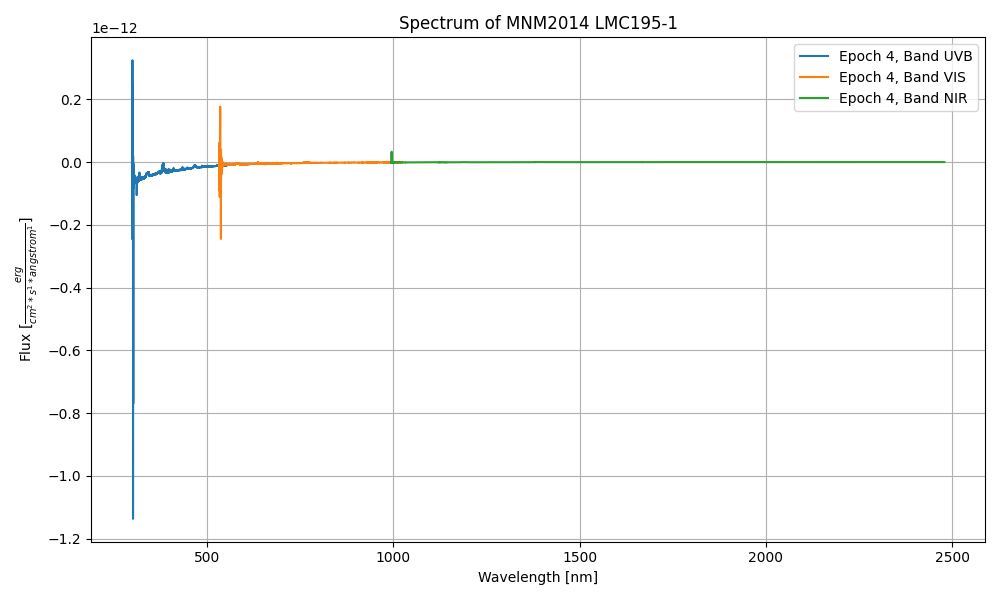

In [10]:
%matplotlib widget
star_name = specs.star_names[5]
star = obs.load_star_instance(star_name)
star.plot_spectra(epoch_nums=4,bands = ['UVB','VIS','NIR'])
# star.plot_spectra(2)
# star.plot_spectra(3)
# star.plot_spectra(4)
# star.plot_spectra(5)
# star.plot_spectra(6)
# star.plot_spectra(7)

# Printing data on stars

In [3]:
obs = obsm()

In [4]:
star_name = specs.star_names[17]
print(star_name)
star = obs.load_star_instance(star_name)
twoD = star.load_2D_observation(3,'UVB')
twoD.print_file_info()

H2013 LMCe  584
Data/H2013 LMCe  584/epoch3/UVB/2D image
['Data/H2013 LMCe  584/epoch3/UVB/2D image/ADP.2021-04-22T19:37:53.845.fits']
Data/H2013 LMCe  584/epoch3/UVB/2D image/ADP.2021-04-22T19:37:53.845.fits
Data loaded from Data/H2013 LMCe  584/epoch3/UVB/2D image/ADP.2021-04-22T19:37:53.845.fits
Opened FITS file: Data/H2013 LMCe  584/epoch3/UVB/2D image/ADP.2021-04-22T19:37:53.845.fits
Number of HDUs: 3
HDU 0: PrimaryHDU
------------------------------------------------------------
Header:
SIMPLE = True
BITPIX = -32
NAXIS = 2
NAXIS1 = 12854
NAXIS2 = 99
EXTEND = True
COMMENT =   FITS (Flexible Image Transport System) format is defined in 'Astronomy
COMMENT =   and Astrophysics', volume 376, page 359; bibcode: 2001A&A...376..359H
DATE = 2021-04-13T07:37:55
LAMNLIN = 3326
LAMRMS = 0.00304125724777618
CRDER1 = 5.27341602359237e-05
CSYER1 = 0.03
CUNIT1 = nm
SPATRMS = 0.0105833775067827
CRDER2 = 0.000183511449315262
CSYER2 = 0.17
CUNIT2 = arcsec
CRPIX1 = 1.0
CRVAL1 = 298.92
CDELT1 = 0.02
C

In [7]:
data = star.load_property('RVs',5,'COMBINED')
print(data)

{'He II 4686': array({'full_RV': 6.160090502324315, 'full_RV_err': 1.8573523299169121},
      dtype=object), 'C IV 5808-5812': array({'full_RV': -5.80339072199721, 'full_RV_err': 1.7585858237933507},
      dtype=object), 'He II 655': array({'full_RV': 24.855244870299547, 'full_RV_err': 12.005269755749094},
      dtype=object), 'C IV-III 761-772': array({'full_RV': 7.518119282553855, 'full_RV_err': 8.630171773269758},
      dtype=object), 'C III 970': array({'full_RV': 89.88863223380676, 'full_RV_err': nan}, dtype=object), 'C IV-III 1022-1012': array({'full_RV': -402.983502374966, 'full_RV_err': 33.08250897198534},
      dtype=object), 'C III 1187': array({'full_RV': 32.487639587463796, 'full_RV_err': 10.710451461244686},
      dtype=object), 'idk1': array({'full_RV': 12.549843449039543, 'full_RV_err': 6.908342309842356},
      dtype=object), 'idk2': array({'full_RV': 70.65424909067478, 'full_RV_err': nan}, dtype=object)}


In [4]:
data = []
for star_name in specs.star_names:
    star = obs.load_star_instance(star_name)
    data.append([star_name, star.spectral_type, star.BAT_ID])

df = pd.DataFrame(data, columns=["Star Name", "Spectral Type", "BAT99 ID"])
print(df)

           Star Name   Spectral Type BAT99 ID
0           Brey  70            WR D       87
1           Brey  83           WC4 C      115
2          HD  38029            None       85
3          HD  37248        WC4+O9 C       53
4          Brey  95a            G: E      127
5   MNM2014 LMC195-1           WO2 C     None
6          HD  32125            WC C        9
7          HD  37026            WC D       52
8          HD 269818            WR D       70
9          HD  38448            WR C      125
10         HD  38030            WC D       84
11         HD  37680            WC D       61
12         Brey  58a            WC D       69
13         HD  32228   WC4+O9.5II: C       10
14         HD  32257            WC D        8
15         HD 269888            WR D       90
16         HD  36156            WC D       34
17   H2013 LMCe  584           WO4 C     None
18           RMC 140  WN7+WC4/5pec C      101
19         HD  32402            WC D       11
20         Brey  70a      WN4b/WCE

# using astroquery to get data on stars

In [16]:
from astroquery.vizier import Vizier

# Check catalog metadata
metadata = Vizier.get_catalogs("J/ApJ/931/157")
print(metadata)
for table in metadata:
    print(table)
    print(f"Table: {table['Name']}")
    print(f"Columns: {table.colnames}")


TableList with 1 tables:
	'0:J/ApJ/931/157/sample' with 11 column(s) and 8 row(s) 
   Name    SpT f_SpT   RAJ2000   ... Ref   sp     SimbadName    
                                 ...                            
---------- --- ----- ----------- ... ---- --- ------------------
  BAT99-61 WC4       05 34 19.24 ... A22b  sp           BAT99 61
  BAT99-90 WC4       05 37 44.64 ... A22b  sp           BAT99 90
Sanduleak2 WO3       05 39 34.29 ... A22b  sp          BAT99 123
  LMC195-1 WO2     b 05 18 10.33 ... A22b  sp [MNM2014] LMC195-1
   BAT99-8 WC4       04 56 02.89 ... A22a  sp            BAT99 8
   BAT99-9 WC4       04 56 11.10 ... A22a  sp            BAT99 9
  BAT99-11 WC4       04 57 24.08 ... A22a  sp           BAT99 11
  BAT99-52 WC4       05 30 12.16 ... A22a  sp           BAT99-52
Table:    Name   
----------
  BAT99-61
  BAT99-90
Sanduleak2
  LMC195-1
   BAT99-8
   BAT99-9
  BAT99-11
  BAT99-52
Columns: ['Name', 'SpT', 'f_SpT', 'RAJ2000', 'DEJ2000', 'Vmag', 'VMag', 'AName', 'Ref

In [18]:
viz_res = viz.query_object(object_name = 'BAT99-52', catalog='J/ApJ/931/157')
print(viz_res)

Empty TableList


In [12]:
from astroquery.simbad import Simbad
from astroquery.vizier import Vizier
from astroquery.gaia import Gaia
from astropy.coordinates import SkyCoord
import astropy.units as u
import pandas as pd

# Initialize results table
results = []

# Example star list from specs
BAT99_star_names = {}
for star_name in specs.star_names:
    star = obs.load_star_instance(star_name)
    BAT99_star_names[star_name] = f'BAT99 {star.BAT_ID}'

# Vizier setup
viz = Vizier(columns=["SpType"])
vizier_catalogs = ["J/ApJ/863/181",'J/ApJ/931/157','J/ApJ/888/54','J/AJ/158/192']  # Galactic Wolf-Rayet stars catalog

# Add necessary fields to SIMBAD query
simbad = Simbad()
simbad.add_votable_fields("sptype", "ra", "dec")  # Add necessary fields

# Iterate over star names
for star_name in specs.star_names:
    star_result = {"Star Name": star_name,"BAT99 name": BAT99_star_names[star_name], "SIMBAD": None}
    star_name = BAT99_star_names[star_name]
    # Query SIMBAD
    try:
        sim_res = simbad.query_object(star_name)
        if sim_res is not None and "SP_TYPE" in sim_res.colnames:
            star_result["SIMBAD"] = sim_res["SP_TYPE"][0]  # Spectral type
    except Exception as e:
        print(f"SIMBAD query failed for {star_name}: {e}")

    # Query Vizier by name, then fallback to coordinates
    for vizier_catalog in vizier_catalogs:
        try:
            viz_res = viz.query_object(star_name, catalog=vizier_catalog)
            if viz_res is None or len(viz_res) == 0:
                # print('BAT99-' + str(star_name.split(' ')[1]))
                viz_res = viz.query_object('BAT99-' + str(star_name.split(' ')[1]), catalog=vizier_catalog)
                print(f"Vizier query by name failed for {star_name} in catalog {vizier_catalog}, attempting by coordinates...")
                # Fetch coordinates from SIMBAD
                if sim_res is not None:
                    ra, dec = sim_res["RA"][0], sim_res["DEC"][0]
                    coords = SkyCoord(ra, dec, unit=(u.hourangle, u.deg))
                    if star_name == 'BAT99 52':
                        print(f'RA: {ra}')
                        print(f'DEC: {dec}')
                        print(f'coords: {coords}')
                    viz_res = viz.query_region(coords, radius=5000 * u.arcsec, catalog=vizier_catalog)
            if viz_res is not None and len(viz_res) > 0:
                table = viz_res[0]
                if "SpType" in table.colnames:
                    star_result[vizier_catalog] = table["SpType"][0]  # Spectral type
            else:
                print(f'Didnt find {star_name} in vizier catalog {vizier_catalog}')
        except Exception as e:
            print(f"Vizier query failed for {star_name}: {e}")

    # Append results
    results.append(star_result)

# Convert results to DataFrame
df = pd.DataFrame(results)

# Display table
from tabulate import tabulate
print(tabulate(df, headers="keys", tablefmt="pretty"))


BAT99-87
Vizier query by name failed for BAT99 87 in catalog J/ApJ/931/157, attempting by coordinates...
Didnt find BAT99 87 in vizier catalog J/ApJ/931/157
BAT99-87
Vizier query by name failed for BAT99 87 in catalog J/ApJ/888/54, attempting by coordinates...
Didnt find BAT99 87 in vizier catalog J/ApJ/888/54
BAT99-87
Vizier query by name failed for BAT99 87 in catalog J/AJ/158/192, attempting by coordinates...
BAT99-115
Vizier query by name failed for BAT99 115 in catalog J/ApJ/931/157, attempting by coordinates...
Didnt find BAT99 115 in vizier catalog J/ApJ/931/157
BAT99-115
Vizier query by name failed for BAT99 115 in catalog J/ApJ/888/54, attempting by coordinates...
Didnt find BAT99 115 in vizier catalog J/ApJ/888/54
BAT99-85
Vizier query by name failed for BAT99 85 in catalog J/ApJ/931/157, attempting by coordinates...
Didnt find BAT99 85 in vizier catalog J/ApJ/931/157
BAT99-85
Vizier query by name failed for BAT99 85 in catalog J/ApJ/888/54, attempting by coordinates...
Didnt

# Extracting data form fits files 

## X-SHOOTER

In [2]:
obs = obsm()
star_name = specs.star_names[0]
star = obs.load_star_instance(star_name)

In [13]:
fits_file = star.load_observation(1,'NIR')
wave = fits_file.data['WAVE'][0]
reduced_flux = fits_file.data['FLUX_REDUCED'][0]
print(len(wave))
print(len(reduced_flux))
print(reduced_flux)

Data/Brey  70/epoch1/NIR/ADP.2020-11-13T13_19_45.726.fits
Data loaded from Data/Brey  70/epoch1/NIR/ADP.2020-11-13T13_19_45.726.fits
24750
24750
[2261.75756836 3470.08886719 2000.34106445 ...  935.94451904  493.60571289
 3229.68554688]


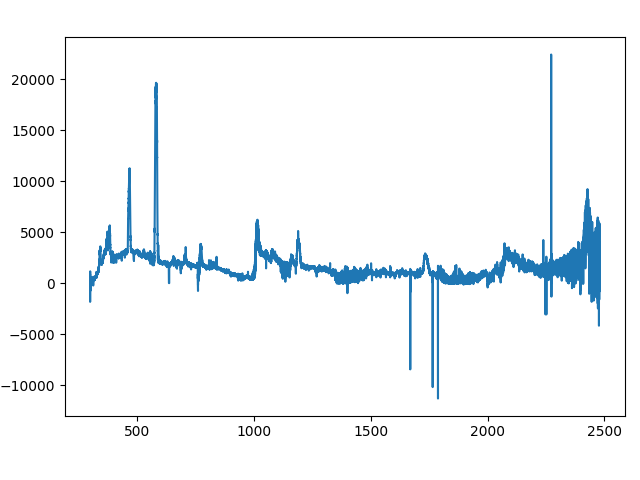

In [12]:
%matplotlib widget
plt.clf()
plt.plot(wave,reduced_flux)
plt.show()

In [14]:
test = fits_file.data

In [15]:
print(test)

[([ 994.02,  994.08,  994.14, ..., 2478.84, 2478.9 , 2478.96], [ 0.00000000e+00,  9.44211555e-16,  5.44302737e-16, ...,  2.28491158e-17,  1.20480792e-17,  0.00000000e+00], [0.00000000e+00, 5.24367075e-16, 5.34550635e-16, ..., 3.88968117e-17, 3.88799836e-17, 0.00000000e+00], [4194304, 4194304,       0, ...,       0,       0,       0], [0.00000000e+00, 1.80066903e+00, 1.01824355e+00, ..., 5.87429014e-01, 3.09878711e-01, 0.00000000e+00], [ 2.26175757e+03,  3.47008887e+03,  2.00034106e+03, ...,  9.35944519e+02,  4.93605713e+02,  3.22968555e+03], [1.71631262e+03, 1.92711096e+03, 1.96450159e+03, ..., 1.59328967e+03, 1.59289966e+03, 1.59095325e+03])]


In [17]:
fits_file.print_file_info()

Opened FITS file: Data/Brey  70/epoch1/NIR/ADP.2020-11-13T13_19_45.726.fits
Number of HDUs: 2
HDU 0: PrimaryHDU
------------------------------------------------------------
Header:
SIMPLE = True
BITPIX = 16
NAXIS = 0
EXTEND = True
COMMENT =   FITS (Flexible Image Transport System) format is defined in 'Astronomy
COMMENT =   and Astrophysics', volume 376, page 359; bibcode: 2001A&A...376..359H
DATE = 2020-11-12T15:04:00
PRODCATG = SCIENCE.SPECTRUM
M_EPOCH = False
CONTNORM = False
FLUXERR = -2.0
REFERENC = 
PRODLVL = 2
ORIGIN = ESO
SPECSYS = TOPOCENT
PROCSOFT = xshoo/3.5.1
DISPELEM = NIR
PROG_ID = 105.207A.002
OBID1 = 2842712
OBSTECH = ECHELLE,SLIT,NODDING
FLUXCAL = ABSOLUTE
WAVELMIN = 994.02
WAVELMAX = 2478.96
SPEC_BIN = 0.06
OBJECT = Brey  70
RA = 84.370347
DEC = -69.34535
EXPTIME = 400.0
TEXPTIME = 400.0
MJD-OBS = 59150.34526638
MJD-END = 59150.3503765648
SNR = 20.7810331210391
LAMNLIN = 1840
LAMRMS = 0.0099535627588728
SPEC_RES = 5573.0
SPEC_ERR = 5.40954497764826e-06
SPEC_SYE = 9.32

In [14]:
print(star_name)
data = star.load_property('normalized_flux',1,'COMBINED')
flux = data['normalized_flux']
wave = data['wavelengths']
for f, w in zip(flux, wave):
    print(f"{w:.17e}  {f:.55e}")      # 17‑digit scientific notation


IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



1.26665999999999985e+03  9.9132283366818219061400441205478273332118988037109375000e-01
1.26672000000000003e+03  9.7925296023517383048329065786674618721008300781250000000e-01
1.26677999999999997e+03  9.6888597472610149541338842027471400797367095947265625000e-01
1.26683999999999992e+03  9.5853662387328530947172566811786964535713195800781250000e-01
1.26690000000000009e+03  1.0215747961239765029262116513564251363277435302734375000e+00
1.26696000000000004e+03  9.8484929964686573899967925171949900686740875244140625000e-01
1.26701999999999998e+03  9.5545832688287146705619079511961899697780609130859375000e-01
1.26707999999999993e+03  8.8422860399239822104533459423691965639591217041015625000e-01
1.26713999999999987e+03  9.1229755438324799943217158215702511370182037353515625000e-01
1.26720000000000005e+03  1.0351099300967989691457660228479653596878051757812500000e+00
1.26725999999999999e+03  9.5661835582124066235110149136744439601898193359375000000e-01
1.26731999999999994e+03  9.3362416909694156

### Barycentric table for stars vs epochs

In [9]:
results = {}
band = 'NIR'
for star_name in specs.star_names:
    if star_name not in results:
        results[star_name] = {}
    star = obs.load_star_instance(star_name,to_print = False)
    epochs = star.get_all_epoch_numbers()
    for epoch_num in epochs:
        if epoch_num not in results[star_name]:
            results[star_name][epoch_num] = []
        fits_file = star.load_observation(epoch_num,band)
        bary = fits_file.header['ESO QC VRAD BARYCOR']
        results[star_name][epoch_num].append(bary)

Data/Brey  70/epoch1/NIR/ADP.2020-11-13T13_19_45.726.fits
Data loaded from Data/Brey  70/epoch1/NIR/ADP.2020-11-13T13_19_45.726.fits
Data/Brey  70/epoch2/NIR/ADP.2020-12-07T08_55_14.173.fits
Data loaded from Data/Brey  70/epoch2/NIR/ADP.2020-12-07T08_55_14.173.fits
Data/Brey  70/epoch3/NIR/ADP.2021-09-01T08_13_28.027.fits
Data loaded from Data/Brey  70/epoch3/NIR/ADP.2021-09-01T08_13_28.027.fits
Data/Brey  70/epoch4/NIR/ADP.2021-09-20T19_54_27.938.fits
Data loaded from Data/Brey  70/epoch4/NIR/ADP.2021-09-20T19_54_27.938.fits
Data/Brey  70/epoch5/NIR/ADP.2021-11-05T09_31_37.324.fits
Data loaded from Data/Brey  70/epoch5/NIR/ADP.2021-11-05T09_31_37.324.fits
Data/Brey  70/epoch6/NIR/ADP.2021-11-30T21_59_33.247.fits
Data loaded from Data/Brey  70/epoch6/NIR/ADP.2021-11-30T21_59_33.247.fits
Data/Brey  83/epoch1/NIR/ADP.2020-11-13T13_19_45.746.fits
Data loaded from Data/Brey  83/epoch1/NIR/ADP.2020-11-13T13_19_45.746.fits
Data/Brey  83/epoch2/NIR/ADP.2020-12-07T08_55_14.103.fits
Data loaded

In [10]:
import pandas as pd

# Flatten the results dict into records
records = []
for star_name, epochs in results.items():
    for epoch_num, bary_list in epochs.items():
        bary = bary_list[0] if bary_list else None
        records.append((star_name, epoch_num, bary))

# Create the DataFrame
df = pd.DataFrame(records, columns=["Star", "Epoch", "Barycentric_Velocity_kms"])

# Pivot: wide format
df_wide = df.pivot(index="Star", columns="Epoch", values="Barycentric_Velocity_kms")

# ✅ Preserve star order based on `results` dict
df_wide = df_wide.loc[list(results.keys())]

# ✅ Preserve epoch order based on first occurrence in your dict
# (collect all unique epoch numbers in order of appearance)
epoch_order = []
for star_epochs in results.values():
    for ep in star_epochs:
        if ep not in epoch_order:
            epoch_order.append(ep)
df_wide = df_wide[epoch_order]

# Optional: clean up display
df_wide.columns.name = None  # remove "Epoch" label
df_wide.index.name = None    # remove "Star" label
pd.set_option('display.expand_frame_repr', False)
pd.set_option('display.max_columns', 100)

# Show the final ordered table
print(df_wide)


                         1         2         3         4         5         6         7
Brey  70         -1.841524 -1.652729 -0.640733 -1.038604 -1.753024 -1.636351       NaN
Brey  83         -1.632680 -1.522830 -0.588757 -1.022882 -1.636477 -1.538720       NaN
HD  38029        -1.735375 -1.771641  1.601465  0.490047 -1.696493 -1.736625       NaN
HD  37248        -2.702282 -2.517643 -0.128436 -0.683958 -1.245608 -2.610477 -2.610769
Brey  95a        -1.621739 -1.279591 -0.776982 -1.533610 -1.660971 -1.418102       NaN
MNM2014 LMC195-1 -2.343539 -2.527022  1.990627 -0.822663 -2.517903 -2.473434       NaN
HD  32125        -1.349958 -2.209715 -2.639565  1.258034  2.723453 -1.345436 -1.853423
HD  37026        -1.309630 -1.636552  0.824250  1.354441 -1.242348 -1.438901       NaN
HD 269818        -1.823086 -1.680166 -0.477300 -1.663345 -1.642799       NaN       NaN
HD  38448        -1.227025 -1.305108 -0.872954 -0.767453 -1.634859 -1.640493 -1.726166
HD  38030        -1.817985 -1.779417  1.575

In [26]:
star.star_name
RVs = star.load_property('RVs',3,'COMBINED')
print(RVs['C IV 5808-5812'].item()['full_RV'])

38.896906718057345


## NRES

In [45]:
star_name = 'WR17'
star = obs.load_star_instance(star_name)
fits_file = star.load_observation(1,1)
data = fits_file.data
print(data['wavelength'][0][30:40])

Data loaded from Data/WR17/epoch1/1/1D/cptnrs03-fa13-20250103-0033-e92-1d.fits.fz
[8879.34886648 8879.40736992 8879.46586446 8879.52435011 8879.58282686
 8879.64129472 8879.69975368 8879.75820376 8879.81664494 8879.87507724]
